In [147]:
import numpy as np
from astropy.io import fits
from astropy.wcs import WCS
from astropy.convolution import convolve
import matplotlib.pyplot as plt
import pandas as pd
from reproject import reproject_interp
from photutils.background import Background2D, SExtractorBackground
from photutils.segmentation import detect_sources, SourceCatalog, SegmentationImage, deblend_sources, make_2dgaussian_kernel
from astropy.stats import sigma_clipped_stats, sigma_clip, SigmaClip, mad_std
from astropy.visualization import simple_norm, SqrtStretch
from tqdm import tqdm
from astropy.visualization.mpl_normalize import ImageNormalize
from astropy.visualization import make_lupton_rgb, make_rgb, ManualInterval, LogStretch, SqrtStretch,LuptonAsinhStretch
from sklearn.preprocessing import StandardScaler
from scipy.stats import pearsonr, gaussian_kde
from scipy.optimize import minimize_scalar
from scipy.signal import argrelextrema, find_peaks
from astropy import constants as const
from collections import defaultdict
from photutils.aperture import CircularAperture
from skimage.measure import label
from skimage.transform import resize
from functools import partial
from concurrent.futures import ThreadPoolExecutor
from astropy.utils.exceptions import AstropyUserWarning
import warnings
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
import seaborn as sns
from scipy.interpolate import UnivariateSpline
import matplotlib.patches as patches
from matplotlib.patches import Ellipse
import pickle as pkl
import importlib
import plotly as px
import matplotlib.lines as mlines
import re
from matplotlib.colors import to_rgb
import random
from matplotlib import cm

%matplotlib inline

# Bloc 1: Curate the images

### Loading the images

In [2]:
def loading(file):
    """
    Load a FITS file and extract its header and data

    Parameters :
    ------------
    file: list of str
        Name of the FITS file (images)

    Returns:
    --------
    data: list of numpy.ndarray
        Data representing the imported image
    header: list of headers from FITS files
        Header of the different imported images
    """

    data = []
    header = []

    for img in file:

        hdul = fits.open(img)
        data.append(hdul[0].data)
        header.append(hdul[0].header)
        hdul.close()
    
    return data, header

### Creating the white image

Because maybe not all the part of the sources emit at every wavelength, we just can not re-use the same aperture obtained in one image for the others.\
To be sure that the whole source is detected, we will create a "white light image", sum of the different fits images, and detect the sources on it.

In [3]:
def padding(images):
    """
    Add a padding on the top/bottom/right/left of the array so that they all have the same size.
    The padding will be added based on the max width and height taken among the different images.

    Parameters :
    ------------
    file: list of numpy.ndarray
        Data of the imported FITS files

    Returns:
    --------
    padded_data: list of numpy.ndarray
        List of numpy array representing the edges have been padded if necessary
    """
    max_height = max(img.shape[0] for img in images)
    max_width = max(img.shape[1] for img in images)

    padded_images = []
    
    for img in images:

        h, w = img.shape

        pad_top = (max_height - h) // 2
        pad_bottom = max_height - h - pad_top
        pad_right = (max_width - w) //2
        pad_left = max_width - w - pad_right

        padded_img = np.pad(img, ((pad_top, pad_bottom), (pad_left, pad_right)), mode='constant', constant_values=np.nan)
        padded_images.append(padded_img)

    return padded_images

In [4]:
def compute_white_image(images):
    """
    Create a white light image: Sum of the image in different bands.

    Parameters :
    ------------
    images: list of numpy.ndarray
        List of the images that need to be summed

    Returns:
    --------
    wl: numpy.ndarray
        White light image 
    """
    
    images = padding(images)

    # Keep the positions of pixels where a NaN is in each images
    all_nan_mask = np.ones_like(images[0], dtype='bool')
    for img in images:
        all_nan_mask &= np.isnan(img)     # True if nan of a given pixel in each images

    # Sum the different image
    wl = np.nansum(images, axis=0)

    # Reapply the NaN
    wl[all_nan_mask] = np.nan

    return wl

### Alignement of the images

To be entirely sure that the center pixel of every image correspond to the same point in the sky (= that the images are aligned), we will create a function that output its ra/dec coordinates. It is just a security as supperposing the images to create the white image, without them being aligned will resolve in an "out of focus images" where different points in the sky will be supperposed. 

In [5]:
def get_center(data, header):
    """
    Search for the center (in pixel) on a previously imported FITS file.

    Parameters :
    ------------
    data: list of numpy.ndarray
        Data part of the imported FITS file (similar to a pixel matrix)
    header: list of astropy.io.fits.header.Header
        Header part of the imported FITS file

    Returns:
    --------
    center_radec: numpy.ndarray
        RA-DEC position of the center pixel of the image
    """

    wcs = WCS(header)
    
    center_pixel = np.array([[data.shape[1]/2, data.shape[0]/2]])

    center_radec = wcs.all_pix2world(center_pixel, 0)[0] # ,0) because we work with numpy array and [0] takes directly the result coord

    return center_radec

For our particular test images, the camera used to take the image in the red filter is not the same as the one for the blue and green. We thus experienced a sligth shift of sources. To overcome this, we used a function to account for that shift. This function apply a shift to the CRVAL in the header of the image (based on a reference image), but also apply that shift to the array of pixel. That is mendatory because, in order to create the white image, we sum up the arrays pixel to pixel. However this cannot work if two summed pixel do not have the same RA-DEC coordinates.

In [6]:
def align_fits_reproject(ref_fits, input_fits_list, output_fits_list):
    """
    Align a list of FITS images on a reference image by using reproject and save them.

    Parameters :
    ------------
    ref_fits : str
        Reference file name
    input_fits_list : list of str
        List of the name of the FITS files to align
    output_fits_list : list of str
        List of the name of the FITS file outputed after alignement
    """
    # Load the reference image
    with fits.open(ref_fits) as ref_hdul:
        ref_hdr = ref_hdul[0].header
        ref_wcs = WCS(ref_hdr)
        shape_out = (ref_hdr['NAXIS2'], ref_hdr['NAXIS1'])
    
    print(f"Reference : {ref_fits}")
    
    # Loop of the list of images to align
    for input_fits, output_fits in zip(input_fits_list, output_fits_list):
        with fits.open(input_fits) as hdul:
            data = hdul[0].data
            hdr = hdul[0].header
            wcs = WCS(hdr)
            
            aligned_data, _ = reproject_interp((data, wcs), ref_wcs, shape_out=shape_out)
            
            # Prepare the new header
            new_hdr = hdr.copy()
            # Updated only WCS part of the header
            new_hdr.update(ref_wcs.to_header())
            # Create final fits file
            fits.writeto(output_fits, aligned_data, new_hdr, overwrite=True)
        
        print(f" Aligned : {input_fits} → {output_fits}")
    
    print("\n Alignement over for every FITS file !")


# Bloc 2: Detection of the sources

We first start by creating a function that detect sources and will be used on a white light image. This function then output a segmentation map.\
\
Some details:
1) We handle the NaN by making a mask on those pixel, then replace those pixels with the median of the image.
2) We optimize the box size by trying to optimize global smoothing (huge box) and local detection (small box).
3) We use SExtractor as a background that uses a sigma clip method so robust to outliers. The argument 'exclude_percentile' allows to ignore a part of the brightest pixels. The method 'pad' uses a duplication of value to complete the incomplete edges.
4) A convolution is used to attenuate the ambiant noise. It will also remove small structures and accentuate the large ones.
5) Create adaptative nlevels for the deblending. We use a log2() to reduce the gap between high count of detection and low count of detection. We still multiply by 2 right after so that the number of levels increases enough with the number of detection (increase a bit the gap). The addition of 6 right after just insures that the final nuber of levels is not too low and still makes sense.

In [7]:
def detection_sources_opti(image, coef_threshold, n_pixels):
    """
    Detect sources in an image and ouput a segmentation map.

    Parameters:
    -----------
    image: numpy.ndarray
        Data array from the imported FITS file
    coef_threshold: float, optional
        Detection threshold coefficient (Pixels > coef_threshold * bkg_rms to be detected)
    n_pixels: int, optional
        Minimum number of connected pixels above threshold required for detection

    Returns:
    --------
    SegmentationImage
        Deblend segmentation map of detected sources
    """

    # Use of float32 to lighten the image data type if not the case
    # if image.dtype == np.float64:
    #     image = image.astype(np.float32)

    # Handle the NaN values 
    mask = None
    if np.isnan(image).any():
        mask = np.isnan(image)
        image = np.copy(image)  # Create a copy to avoid modifying the original (can happen)
        image[mask] = np.nanmedian(image)

    # Optimize the box_size based on the dimensiosn of the image
    sig_clip = SigmaClip(sigma=3.0)

    box_size = min(50, max(20, min(image.shape) // 20)) 

    # Use SExtractorBackground and compute a background with optimized parameters

    bkg = Background2D(image, box_size=(box_size, box_size), filter_size=(5, 5), sigma_clip=sig_clip, 
                       bkg_estimator=SExtractorBackground(), mask=mask)

    # Create a background substracted image
    bkg_substracted = image - bkg.background

    #Calculate the threshold for detection
    threshold = coef_threshold * bkg.background_rms

    # Create a gaussian kernel for smoothing
    kernel = make_2dgaussian_kernel(3.0, size=9)

    # Use a convolution for a better detection
    convolved_image = convolve(bkg_substracted, kernel)

    # Sources detection
    seg_map = detect_sources(convolved_image, threshold, npixels=n_pixels, mask=mask)

    # We only apply deblending if sources are detected
    if seg_map.nlabels > 0:

        # Deblend the sources 
        seg_deb = deblend_sources(convolved_image, seg_map, npixels=100, nlevels=16, contrast=0.03, mode='linear')

        return seg_deb, bkg, kernel

    else:
        return seg_map, bkg, kernel
     

In [8]:
def export_seg_map(seg_map, header, name):
    """
    Export a segmentation map as a fits file

    Parameters :
    ------------
    seg_map: SegmentationImage
        Segmentation map that need to be downloaded
    header: Header of FITS file
        Header pasted to the segmentation map. Typically the same header as the white light image.
    name: str
        Name of the segmentation map as "segmentation_map_name"
    """
    
    hdu=fits.PrimaryHDU(seg_map, header=header)
    hdul = fits.HDUList([hdu])
    hdul.writeto(f'segmentation_map_{name}.fits', overwrite=True)

# Bloc 3: Creation of the catalog

In [9]:
def replace_neg(images):
    """
    Replace the value of the pixel with zero whenever it is negative (potential result of background substraction).
    It improves the accuracy when summing on the whole source to get the total flux.

    Parameters :
    ------------
    image: list of numpy.ndarray
        Data of a FITS file as an array of pixel
    """
    
    for i in range(len(images)):
        images[i][images[i] < 0] = 0
        
    return images

In [10]:
def check_length(catalogs):
    """
    Verify (output a boolean) in the different catalogs have the same length and thus same number of detection.

    Parameters :
    - catalog: list of catalogs (in the form of a datafram)
    """
    
    ref = len(catalogs[0])
    
    for i, cat in enumerate(catalogs):
        if len(cat) != ref:
            print(f"The catalog {i} has a different length: {len(cat)} (reference : {ref})")
            return False
            
    return True

We now have to combine the different catalogs into one. We will first consider the case of 4 RGB filters. As mentionned before, the field of view of the camera responsible for the image in the red filter is smaller than the one for the other film. For this reason, our catalog for the red image contain NaN values in the centroid and count columns when the sources was located outside the field of view of the camera.

To account for that, once we merged the different catalog into one general RGB catalog, we'll suppress the sources for which we do not have info in the red. We do this because, when it comes to the comparison of lightcurves, those sources will only have 3 point (so two slope) in opposition to the other who will have 4 (so 3 slopes).

For the creation of the photometric catalog:
1) The positions are based on the centroids position in the white light image
3) The output is a catalog containing position and photometry for each sources in each bands


In [11]:
def band_photometry(image, header, filter_name, segmentation_map):
    """
    Extract the flux and associated error for each sources in the different bands

    Parameters:
    -----------
    image: list of numpy.ndarray
        List of image data arrays from different bands
    header: list of FITS headers
        List of headers from the FITS files in the different bands
    segmentation_map: SegmentationImage
        Segmentation map used for the detection across all the different bands       
    filter_name: list of str, optional
        Names of the different bands

    Returns:
    --------
    catalog_band: DataFrame
        Photometric catalog in a given band
    """
       
    wcs = WCS(header)

    # Mask the NaN values
    mask = None
    if np.isnan(image).any():
        mask = np.isnan(image)

    # Compute the background

    sig_clip = SigmaClip(sigma=3.0)
    box_size = min(50, max(20, min(image.shape) // 20))  
    bkg = Background2D(image, box_size=(box_size, box_size), filter_size=(5, 5), sigma_clip=sig_clip,
                       bkg_estimator=SExtractorBackground(), mask=mask)

    background = bkg.background
    rms = bkg.background_rms

    # Convolve the image
    im_bkg_subs = image - background
    kernel = make_2dgaussian_kernel(3.0, size=9)

    with warnings.catch_warnings():
        warnings.simplefilter("ignore", category=AstropyUserWarning)
        im_convolved = convolve(im_bkg_subs, kernel)

    # Create a photometric catalog
    catalog = SourceCatalog(im_bkg_subs, segmentation_map, background=background, 
                            convolved_data=im_convolved, error=rms, wcs=wcs)

    fluxes = catalog.segment_flux
    flux_errs = catalog.segment_fluxerr

    phot_data = {"segment_id": catalog.label, f"flux_{filter_name}": fluxes, f"flux_err_{filter_name}": flux_errs}

    catalog_bands = pd.DataFrame(phot_data)

    return catalog_bands

In [12]:
def process_band_photometry(idx, images, headers, filter_names, segmentation_map):
    """
    Extract the flux and associated error for each sources in the different bands by threading

    Parameters:
    -----------
    idx: int
        Index of the images to treat in the list of images, headers and names to process in the different lists
    image: list of numpy.ndarray
        List of images data arrays from different bands
    header: list of FITS headers
        List of headers from the FITS files in the different bands
    segmentation_map: SegmentationImage
        Segmentation map used for the detection across all the different bands       
    filter_name: list of str, optional
        Names of the different bands

    Returns:
    --------
    catalog_band: DataFrame
        Photometric catalog in a given band
    """

    #------ Disable the warnings -------

    # They are mainly due to the presence of NaN in the image (border of the fov)

    warnings.filterwarnings(
        'ignore', 
        message="Degrees of freedom <= 0 for slice.", 
        category=RuntimeWarning
    )
    warnings.filterwarnings(
        'ignore', 
        message="All-NaN slice encountered", 
        category=RuntimeWarning
    )
    warnings.filterwarnings(
        'ignore', 
        message="Mean of empty slice", 
        category=RuntimeWarning
    )
    warnings.filterwarnings(
        'ignore', 
        message="invalid value encountered in divide", 
        category=RuntimeWarning)

    #-----------------------------------

    image = images[idx]
    header = headers[idx]
    filter_name = filter_names[idx]

    
    wcs = WCS(header)

    # Mask the NaN values
    mask = None
    if np.isnan(image).any():
        mask = np.isnan(image)

    # Compute the background

    sig_clip = SigmaClip(sigma=3.0)
    box_size = min(50, max(20, min(image.shape) // 20))  
    bkg = Background2D(image, box_size=(box_size, box_size), filter_size=(5, 5), sigma_clip=sig_clip,
                       bkg_estimator=SExtractorBackground(), mask=mask)

    background = bkg.background
    rms = bkg.background_rms

    # Convolve the image
    im_bkg_subs = image - background
    kernel = make_2dgaussian_kernel(3.0, size=9)

    with warnings.catch_warnings():
        warnings.simplefilter("ignore", category=AstropyUserWarning)
        im_convolved = convolve(im_bkg_subs, kernel)

    # Create a photometric catalog
    catalog = SourceCatalog(image, segmentation_map, background=background, 
                            convolved_data=im_convolved, error=rms, wcs=wcs)

    fluxes = catalog.segment_flux
    flux_errs = catalog.segment_fluxerr

    phot_data = {"segment_id": catalog.label, f"flux_{filter_name}": fluxes, f"flux_err_{filter_name}": flux_errs}

    catalog_bands = pd.DataFrame(phot_data)

    return catalog_bands    

In [13]:
def generate_multi_band_catalog(images, headers, segmentation_map, white_light_image, filter_names=None, type_var='heavy', thread=False):
    """
    Creation of a catalog containing the sources centroid's positions based on a white light image and
    the associated flux and errors on the flux in the different bands.

    Parameters:
    -----------
    images: list of numpy.ndarray
        List of image data arrays from different bands
    headers: list of FITS headers
        List of headers from the FITS files in the different bands
    segmentation_map: SegmentationImage
        Segmentation map used for the detection across all the different bands       
    white_light_image: numpy.ndarray
        White light image used for the creation of the segmentation map. It will be used for the centroid calculations.
    filter_names: list of str, optional
        Names of the different bands
    type_var: str
        Convert the data from float64 to float 32 if set to 'light'. Default is 'heavy'.  
    thread: bool
        Compute the different catalog by doing threading if set to True. Default is False.

    Returns:
    --------
    DataFrame:
        general catalog with the position of the detected sources (taken from the white light image) and the photometry in all bands.
    """

    # Raise errors if missing values
    n_images = len(images)
    if len(headers) != n_images:
        raise ValueError("The number of images does not match the number of headers")

    if filter_names is None:
        filter_names = [f'band_{i}' for i in range(n_images)]
    elif len(filter_names) != n_images:
        raise ValueError("The number of images does not match the number of names")

    # Start with the white light image as reference
    #----------------------------------------------

    # If needed we lighten the images
    if type_var == 'light':
        if white_light_image.dtype == np.float64:
            white_light_image = white_light_image.astype(np.float32)
        images = [img.astype(np.float32) if img.dtype == np.float64 else img for img in images] 

    # The white light image has the same header as one of the images anyway and is only used for position
    wcs_ref = WCS(headers[0])  

    # Create a kernel for later convolution (in every bands)
    kernel = make_2dgaussian_kernel(3.0, size=9)

    # Computation of the background
    mask = None
    if np.isnan(white_light_image).any():
        mask = np.isnan(white_light_image)

    # Optimize the box_size based on the dimensiosn of the image
    sig_clip = SigmaClip(sigma=3.0)

    box_size = min(50, max(20, min(white_light_image.shape) // 20))  

    # Use SExtractorBackground and compute a background with optimized parameters

    wl_bkg = Background2D(white_light_image, box_size=(box_size, box_size), filter_size=(5, 5), sigma_clip=sig_clip, 
                       bkg_estimator=SExtractorBackground(), mask=mask)

    wl_background = wl_bkg.background
    wl_rms = wl_bkg.background_rms

    # Convolve white ligth image
    wl_bkg_subs = white_light_image - wl_background

    with warnings.catch_warnings():
        warnings.simplefilter("ignore", category=AstropyUserWarning) 
        wl_convolved = convolve(wl_bkg_subs, kernel)

    # Create a reference Source Catalog based on the white ligth image to get the positions
    print("Extraction of the positions of the sources ...")
    wl_catalog = SourceCatalog(wl_bkg_subs, segmentation_map, background=wl_background, 
                               convolved_data=wl_convolved, error=wl_rms, wcs=wcs_ref)

    # Extract the positions information into a base catalog
    ref = {"segment_id": wl_catalog.label, "xcentroid": wl_catalog.xcentroid, "ycentroid": wl_catalog.ycentroid}
    
    pix_coord = list(zip(wl_catalog.xcentroid, wl_catalog.ycentroid))

    coord_radec = wcs_ref.all_pix2world(pix_coord, 1)

    ref["ra"] = coord_radec[:,0]
    ref["dec"] = coord_radec[:,1]

    ref["a"] = wl_catalog.semimajor_sigma
    ref["b"] = wl_catalog.semiminor_sigma
    ref["theta"] = wl_catalog.orientation

    ref_catalog = pd.DataFrame(ref)

    # Different bands images photometry
    #----------------------------------

    # Process all bands
    bands_result = []

    if thread == False:
        # Output the catalog from different bands
        for im, head, name in zip(images, headers, filter_names):
            print(f'Creation of the photometric catalog for band: {name}')
            catalog = band_photometry(im, head, name, segmentation_map)
            bands_result.append(catalog)  

    else:
        partial_phot = partial(process_band_photometry, images=images, headers=headers, filter_names=filter_names, segmentation_map=segmentation_map)

        print("Creation of the photometric catalog for each bands by threading")
        with ThreadPoolExecutor(max_workers=min(n_images, 2)) as executor:
            bands_result = list(executor.map(partial_phot, range(n_images)))

    # Merging of the dataframes
    print('Merging ...')
    catalog = ref_catalog.copy()
    for band_df in bands_result:
        catalog = pd.merge(catalog, band_df, on='segment_id', how='left')


    # Supress sources that have no detections in one of the bands
    phot_band_names = [f'{prefix}_{band}' for band in filter_names for prefix in ["flux", "flux_err"]]

    print(phot_band_names)

    catalog_final = catalog.dropna(subset=phot_band_names)

    catalog_final.reset_index(drop=True, inplace=True)

    print('Catalog created !')    
    return catalog_final

In [141]:
def merge_sources(segmap, src_keep, src_merge):
    # Copy to avoid modification in the catalog
    new_data = segmap.data.copy()

    # Merge the pixel and keep only the reference label
    new_data[new_data == src_merge] = src_keep

    # Recreate a segmentation object via photutils
    new_segmap = SegmentationImage(new_data)

    return new_segmap

In [14]:
def SN_ratio_cleaning(photometric_catalog, bands_name, threshold):
    """
    Cleans the catalog by removing the sources with a signal to noise ratio bellow a given threshold in a least one of the bands.
    Parameters:
    -----------
    photometric_catalog: pandas.DataFrame
        Photometric catalog containing the flux and associated error in different bands
    bands_name: list of str
        Name of the bands as xxxxx such that it stands as flux_xxxxx and flux_err_xxxxx
    threshold: int
        Sources with a minimum SN ratio on the selected bands bellow that threshold will be discarded
    Returns:
    --------
    photometric_catalog_updated: pandas.DataFrame
        Updated photometric catalog with faint sources discarded
    """
    flux_bands = ["flux_" + name for name in bands_name]
    err_bands = ["flux_err_" + name for name in bands_name]

    fluxes = photometric_catalog[flux_bands].values
    errs = photometric_catalog[err_bands].values
    
    with np.errstate(divide='ignore', invalid='ignore'):
        snr_per_bands = fluxes/errs
    
    snr_per_bands = np.nan_to_num(snr_per_bands, nan=0.0, posinf=0.0, neginf=0.0)
    
    min_snr = np.min(snr_per_bands, axis=1)
    
    mask = min_snr >= threshold
    
    photometric_catalog_updated = photometric_catalog[mask]
    
    print(f'Number of discarded sources: {len(photometric_catalog)-len(photometric_catalog_updated)}')
    
    return photometric_catalog[mask].copy()

# Bloc 4: Comparison of the flux

Definition of chi² as in Guillaume Mahler's thesis

In [15]:
def compute_chi2(alpha, flux_A, flux_B, err_A, err_B):
    """
    Compute the Chi2 for two sources depending bases on their fluxes and the associated errors with an adaptible parameter alpha.
    The alpha parameter will be defined by minimization of the computed Chi2 value.

    Parameters:
    -----------
    alpha: float
        Scaling parameter
    flux_A: list of float
        List of the flux in the different bands for the source A
    flux_B: list of float
        List of flux for in the different bands for the source B
    err_A: list of float
        List of errors associated to the flux in the different bands for the source A
    err_B: list of float
        List of errors associated to the flux in the different bands for the source B

    Returns:
    --------
    chi2: float
        Value of the Chi2 between the two sources for a given value of alpha.
    """

    # Definittion of the adaptible Chi2
    num = (flux_A - (alpha*flux_B))**2
    den = err_A**2 + ((alpha**2)*(err_B)**2)

    chi2 = np.sum(num/den)

    return chi2

In [16]:
def chi2_reduced(flux_A, flux_B, err_A, err_B):
    """
    Optimize the value of the adaptible parameter alpha based on a minimization of the Chi2 between two sources (A and B).

    Parameters:
    -----------
    flux_A: list of float
        List of the flux in the different bands for the source A
    flux_B: list of float
        List of flux for in the different bands for the source B
    err_A: list of float
        List of errors associated to the flux in the different bands for the source A
    err_B: list of float
        List of errors associated to the flux in the different bands for the source B

    Returns:
    --------
    chi2_result: float
        Slowest value of Chi2 found after optimization of alpha
    alpha_opt: float
        Value of alpha associated with the lowest Chi2
    """

    N = len(flux_A)

    def chi2_param(alpha):
        return compute_chi2(alpha, flux_A, flux_B, err_A, err_B)

    result = minimize_scalar(chi2_param, bounds=[0.001, 10], method='bounded')
    alpha_opt = result.x
    chi2_min = compute_chi2(alpha_opt, flux_A, flux_B, err_A, err_B)
    chi2_result = chi2_min/(N-1)

    return chi2_result, alpha_opt

In [17]:
def chi2_dictionary_boh(catalog, ranks=True):
    """
    Compute the pairwise chi2 similarity (and optimal alpha scaling parameter) between all sources in each DataFrame of a catalog.

    The input catalog is assumed to be a list of DataFrames, each representing a fragment region (from a zone of influence).
    Each DataFrame must contain flux and associated errors columns named as:
        - "flux_<band>" for the fluxes
        - "flux_err_<band>" for the errors

    Parameters:
    -----------
    catalog: list of DataFrame
        List of segmented source catalog. Each DataFrame contains photometry, and error per band.
    ranks: bool
        If True, add a column displaying the position of the key segment in the dataframe of the other segment. Default is False.

    Returns:
    --------
    rankings: dict
        Dictionary where each key is a segment_id (reference source), and the value is a DataFrame of other segments containing:
            - "segment_id": matched segment
            - "centroid_x", "centroid_y": spatial positions
            - "chi2": reduced chi2 similarity
            - "alpha": optimal scaling factor
        The DataFrames are sorted by ascending order of chi2.
    """
    
    # Automatically initializes a new list for unseen keys
    rankings = defaultdict(list)

    # Select the colums containing the flux and the columns containing the associated errors
    # The names are taken in the first DataFrame of the fragmented catalog. They are the same in each DataFrame anyway.
    flux_cols = [col for col in catalog[0].columns if col.startswith("flux_") and not col.startswith("flux_err_")]
    flux_err_cols = [col for col in catalog[0].columns if col.startswith("flux_err_")]

    # Loop on the different DataFrames
    for idx, data in enumerate(tqdm(catalog, desc="Fragments")):
        #tqdm.write(f"Fragment {idx+1}/{len(catalog)} being processed ...")

        # Avoid modification of the original data
        data = data.copy()

        n_sources = len(data)

        # Verify the presence of the segment id in the DataFrame
        if 'segment_id' not in data.columns:
            raise ValueError(f'Column  "segment_id" not found in the DataFrame.')

        # Loop on each sources (lines) in the DataFRame as a reference source
        for i in range(n_sources):

            # Extract fluxes and errors from the base source
            row_i = data.iloc[i]
            id_i = row_i["segment_id"]
            flux_i = row_i[flux_cols].values
            err_i = row_i[flux_err_cols].values

            # Loop on all the sources (except the reference) of the DataFrame to compare it with the reference
            for j in range(i+1, n_sources):  # j>i only 

                # Extract the fluxes and errors from the sources being compared
                row_j = data.iloc[j]
                id_j = row_j["segment_id"]
                flux_j = row_j[flux_cols].values
                err_j = row_j[flux_err_cols].values

                # Compute the optimise chi2 and associated alpha
                chi2, alpha = chi2_reduced(flux_i, flux_j, err_i, err_j)

                # Create an new entry (list) in the dictionnary corresponding to the reference segment
                # Append the info of all sources including their chi2 and optimized alpha
                rankings[id_i].append({
                    "segment_id": row_j["segment_id"],
                    "xcentroid": row_j["xcentroid"],
                    "ycentroid": row_j["ycentroid"],
                    "chi²": chi2,
                    "alpha": alpha
                })

                # To reduce the computation time, the computed values are already added in the DataFrame of the compared source
                rankings[id_j].append({
                    "segment_id": row_i["segment_id"],
                    "xcentroid": row_i["xcentroid"],
                    "ycentroid": row_i["ycentroid"],
                    "chi²": chi2,
                    "alpha": 1 / alpha
                })

    # Each element of the dictionary becomes a DataFrame where the element are ordered by ascending chi2
    for key in rankings:
        rankings[key] = pd.DataFrame(rankings[key]).sort_values(by="chi²").reset_index(drop=True)

    # Add the mutual ranks (position of key segment in the dataframe of the other segment)
    if ranks is True:
        for key in rankings:
            mutual_ranks = []

            for _, row in rankings[key].iterrows():
                other_id = row["segment_id"]

                # Fetch the DataFram of the other segment
                other_df = rankings.get(other_id)

                # Search for the position of key segment in other DataFrame
                if other_df is not None:
                    match = other_df[other_df["segment_id"]==key]
                    if not match.empty:
                        mutual_ranks.append(int(match.index[0]))
                    else:
                        mutual_ranks.append(np.nan)
                else:
                    mutual_ranks.append(np.nan)

            rankings[key]["mutual_ranks"] = mutual_ranks

    return rankings             

In [18]:
def chi2_dictionary(catalog, ranks=True):
    """
    Compute the pairwise chi2 similarity (and optimal alpha scaling parameter) between all sources in each DataFrame of a catalog.

    The input catalog is assumed to be a list of DataFrames, each representing a fragment region (from a zone of influence).
    Each DataFrame must contain flux and associated errors columns named as:
        - "flux_<band>" for the fluxes
        - "flux_err_<band>" for the errors

    Parameters:
    -----------
    catalog: list of DataFrame
        List of segmented source catalog. Each DataFrame contains photometry, and error per band.
    ranks: bool
        If True, add a column displaying the position of the key segment in the dataframe of the other segment. Default is False.

    Returns:
    --------
    rankings: dict
        Dictionary where each key is a segment_id (reference source), and the value is a DataFrame of other segments containing:
            - "segment_id": matched segment
            - "centroid_x", "centroid_y": spatial positions
            - "chi2": reduced chi2 similarity
            - "alpha": optimal scaling factor
        The DataFrames are sorted by ascending order of chi2.
    """
    
    # Automatically initializes a new list for unseen keys
    rankings = defaultdict(list)

    # Select the colums containing the flux and the columns containing the associated errors
    # The names are taken in the first DataFrame of the fragmented catalog. They are the same in each DataFrame anyway.
    flux_cols = [col for col in catalog[0].columns if col.startswith("flux_") and not col.startswith("flux_err_")]
    flux_err_cols = [col for col in catalog[0].columns if col.startswith("flux_err_")]

    # Loop on the different DataFrames
    for idx, data in enumerate(tqdm(catalog, desc="Fragments")):
        #tqdm.write(f"Fragment {idx+1}/{len(catalog)} being processed ...")

        # Avoid modification of the original data
        data = data.copy()

        n_sources = len(data)

        # Verify the presence of the segment id in the DataFrame
        if 'segment_id' not in data.columns:
            raise ValueError(f'Column  "segment_id" not found in the DataFrame.')

        # Loop on each sources (lines) in the DataFRame as a reference source
        for i in range(n_sources):

            # Extract fluxes and errors from the base source
            row_i = data.iloc[i]
            id_i = row_i["segment_id"]
            flux_i = row_i[flux_cols].values
            err_i = row_i[flux_err_cols].values

            # Loop on all the sources (except the reference) of the DataFrame to compare it with the reference
            for j in range(i+1, n_sources):  # j>i only 

                # Extract the fluxes and errors from the sources being compared
                row_j = data.iloc[j]
                id_j = row_j["segment_id"]
                flux_j = row_j[flux_cols].values
                err_j = row_j[flux_err_cols].values

                # Compute the optimise chi2 and associated alpha
                chi2, alpha = chi2_reduced(flux_i, flux_j, err_i, err_j)

                # Au lieu de stocker 1/alpha pour id_j,
                # recalculer proprement en inversant les rôles
                chi2_ji, alpha_ji = chi2_reduced(flux_j, flux_i, err_j, err_i)

                rankings[id_i].append({
                    "segment_id": id_j,
                    "xcentroid": row_j["xcentroid"],
                    "ycentroid": row_j["ycentroid"],
                    "chi²": chi2,
                    "alpha": alpha
                })

                rankings[id_j].append({
                    "segment_id": id_i,
                    "xcentroid": row_i["xcentroid"],
                    "ycentroid": row_i["ycentroid"],
                    "chi²": chi2_ji,        # chi² aussi potentiellement différent
                    "alpha": alpha_ji       # alpha correct pour j→i
                })

    # Each element of the dictionary becomes a DataFrame where the element are ordered by ascending chi2
    for key in rankings:
        rankings[key] = pd.DataFrame(rankings[key]).sort_values(by="chi²").reset_index(drop=True)

    # Add the mutual ranks (position of key segment in the dataframe of the other segment)
    if ranks is True:
        for key in rankings:
            mutual_ranks = []

            for _, row in rankings[key].iterrows():
                other_id = row["segment_id"]

                # Fetch the DataFram of the other segment
                other_df = rankings.get(other_id)

                # Search for the position of key segment in other DataFrame
                if other_df is not None:
                    match = other_df[other_df["segment_id"]==key]
                    if not match.empty:
                        mutual_ranks.append(int(match.index[0]))
                    else:
                        mutual_ranks.append(np.nan)
                else:
                    mutual_ranks.append(np.nan)

            rankings[key]["mutual_ranks"] = mutual_ranks

    return rankings             

In [19]:
def pos_segment(dictionary, key, segment):
    """
    Return the position of a segment in the DataFrame of a key (reference) segment.

    Parameters:
    -----------
    rankings: dict
        Dictionary where each key is a segment_id (reference source), and the value is a DataFrame of other segments containing:
            - "segment_id": matched segment
            - "xcentroid", "ycentroid": spatial positions
            - "chi2": reduced chi2 similarity
            - "alpha": optimal scaling factor
        The DataFrames are sorted by ascending order of chi2.
    key: int
        Reference segment
    segment: int
        Segment to find in the DataFrame

    Returns:
    --------
    position_segment: float
        Position of the segment in the key DataFrame
    """
    # Extract the DataFrame of the key segment
    df = dictionary[key]

    # Search for the segment in the DataFrame
    match = df[df["segment_id"]==segment]

    if not match.empty:
        # Index of the segment in the DataFrame
        position_segment = match.index[0]

        print(f'Index in the DataFrame: {position_segment}')
    else:
        position_segment = None
        print(f'Segment not found in the DataFrame.')

    return position_segment

## Similarity strength

In [20]:
def compute_similarity_score(ranking):
    """
    Compute the strength of the similarity between different sources as explained in the manuscript.
    
    Parameters:
    -----------
    ranking: dict:
        Dictionnary where each key is a segment_id (reference source), and the value is a DataFrame of the other segments containing:
            - 'segment_id": matched segment
            - "centroid_x", "centroid_y": spatial postion
            - "chi²": SED-chi² similarity
            - "alpha": optimal scaling factor for the SED-Chi² comparison
        The DataFrames are sorted by ascending order of chi²

    Result:
    ------
    ranking: DataFrame
        Original dictionnary where each dataframe has been updaed with a "similarity_score" column.
    """
    
    for source_id, df in ranking.items():

        df = df.copy()

        # Check required column
        required_cols = {"chi²", "mutual_ranks"}
        missing = required_cols - set(df.columns)
        if missing:
            raise ValueError(f"Missing required column {missing} in the dataframe for {source_id}.")
        
        # Ranking position in the dataframe
        pos = np.arange(len(df)) + 1

        # Compute similarity score
        reduced_chi2 = (df["chi²"].to_numpy())
        df["similarity_score"] = (np.exp(- reduced_chi2 / 2.0) *
                                  (2.0 / (pos + df["mutual_ranks"].to_numpy()+1.0)))
        
        # Sort by similarity score (descending)
        df = df.sort_values(by="similarity_score", ascending=False).reset_index(drop=True)

        # Write into the original dataframe
        ranking[source_id] = df

    return ranking

# Bloc 5: Refining the catalog

## Fragmentation of the catalog

In [21]:
def convert_to_mag(catalog, headers, filter_names, ADU=True):
    """
    Convert the flux in ADU to magnitude in the AB system by making use of the informations contained in the header.

    Parameters:
    -----------
    catalog: Dataframe
        Photometric catalog containing the flux and associated of the different sources in each bands.
    headers: list of FITS headers
        List of headers from the FITS files in the different bands
    filter_names: list of str, optional
        Names of the different bands
    ADU: bool
        Set to False if the flux is already in ADU/s. Default is True.

    Returns:
    --------
    catalog: DataFrame
        Catalog where the flux as been modified from ADU(/s) to magnitude in the AB system.
    """

    catalog = catalog.copy()

    if filter_names is None:
        filter_names = [f'band_{i}' for i in range(len(headers))]

    # Select the colums containing the flux and the columns containing the associated errors
    flux_cols = [col for col in catalog.columns if col.startswith("flux_") and not col.startswith("flux_err_")]
    flux_err_cols = [col for col in catalog.columns if col.startswith("flux_err_")]

    # Check that the amount of flux matches the amount of errors and headers
    if not len(flux_cols) == len(flux_err_cols) == len(headers):
        raise ValueError("The list fluxes_ADU, error_ADU and headers do not have the same length.")

    # Loop on the different bands
    for flux, err, head in zip(flux_cols, flux_err_cols, headers):

        # Check for the required keys in the header
        required_keys = ["PHOTFLAM", "PHOTPLAM", "EXPTIME"]
        
        if not all(k in head for k in required_keys):
            missing_key = [k in head for k in required_keys]
            raise ValueError (f'Error: Missing keys in the header for {flux}: {missing_key}')
    

        # Compute the Zero Point
        Z_AB = -2.5*np.log10(head['PHOTFLAM'])-5*np.log10(head['PHOTPLAM'])-2.408

        # Convert the flux in ADU/s if needed
        if ADU is True:
            flux_ADUs = catalog[flux]/head["EXPTIME"]
            err_ADUs = catalog[err]/head["EXPTIME"]

        else:
            flux_ADUs = catalog[flux]
            err_ADUs = catalog[err]

        # Create a mask to ignore invalid-flux (negative or NaN)
        valid_flux = (flux_ADUs>0) & np.isfinite(flux_ADUs)

        # Initialize of the output arrays with NaNs
        magnitude = np.full_like(flux_ADUs, np.nan, dtype=float)    # Array of given size full of a same value
        err_mag = np.full_like(err_ADUs, np.nan, dtype=float)

        # Compute magnitude and associated error
        magnitude[valid_flux] = -2.5 * np.log10(flux_ADUs) + Z_AB
        err_mag[valid_flux] = (2.5 / np.log(10))*(err_ADUs / flux_ADUs)
        
        # Replace in the catalog
        catalog[flux] = magnitude
        catalog[err] = err_mag

    return catalog


In [22]:
def change_to_sky_coord(catalog, header):
    """
    Transforme the coordinates of the sources centroid from pixel to world coordinates

    Parameters :
    ------------
    catalog: Dataframe
        Photometric catalog containing the flux and associated of the different sources in each bands.
    headers: list of FITS headers
        List of headers from the FITS files in the different bands

    Returns:
    --------
    catalog: Dataframe
        Photometric catalog containing the flux and associated of the different sources in each bands but with the position in ra dec.
    """

    wcs = WCS(header)

    pix_coord = list(zip(catalog['centroid_x'], catalog['centroid_y']))
    sky_coord = wcs. wcs_pix2world(pix_coord, 1)

    catalog[['centroid_x'], ['centroid_y']] = sky_coord

    return catalog

In [23]:
def rad_mag(catalog, header, R_0, m_0, reference_band):
    """
    Compute the radius (in pixels) of influence of every sources in a catalog based on their magnitude.
    It is best to fit the reference radius and magnitude based on the BCG.

    Parameters :
    ------------
    catalog: Dataframe
        Photometric catalog containing the flux and associated of the different sources in each bands.
    headers: FITS header
        Header of the image in the reference band.
    R_0: float
        Reference radius on influence in pixels (typically corresponding to the BCG in the reference band)
    m_0: float
        Reference magnitude (typically corresponding to the BCG in the reference band)
    reference_band: str
        Name of the band used for the parametrisation
        

    Returns:
    --------
    rad_pixels: ndarray
        1D table of the radii (in pixels) associated to the sources in the catalog.
    """

    # Load the header
    wcs = WCS(header)
    
    pixel_scale = wcs.proj_plane_pixel_scales()   # Output a couple: scale in x and y
    pixel_scale_arcsec_x = pixel_scale[0] * 3600    # From deg to arcsec   (arcsec/pixels)
    pixel_scale_arcsec_y = pixel_scale[1] * 3600
    
    mean_scale = (pixel_scale_arcsec_x + pixel_scale_arcsec_y)/2

    print(f'Pixel Scale (arcsec/pixel): {mean_scale:.3f}')    # 1 pixel = *** arcsec
    print(f'[INFO]: The sphere of influence will is set to {mean_scale*R_0:.3f} for a magnitude of {m_0}.')

    # Search for the reference column
    mag_col = "flux_" + reference_band
    if mag_col not in catalog.columns:
        raise ValueError(f'Column {mag_col} not found in catalog.') 

    # Compute the radius in pixel based on a relation detailed in the report
    rad_pixels = R_0*(10**(-0.2*(catalog[mag_col]-m_0)))

    return rad_pixels

In [24]:
def circular_mask_incrementals(catalog, header, R_0, m_0, reference_band):
    """
    Create a combined mask modeling the cluster shape by progressively adding circular masks centered on the galaxy center with their respective radius.
    The different circular masks are centered on the centroid of the cluster members galaxies.

    Parameters:
    -----------
    catalog: Dataframe
        Photometric catalog containing the flux and associated error of the different cluster galaxies in each bands.
    headers: FITS header
        Header of the reference image (typically the one corresponding to the band used for the X-axis of the cluster's color diagram.
    R_0: float
        Reference radius on influence in pixels (typically corresponding to the BCG)
    m_0: float
        Reference magnitude (typically corresponding to the BCG)
    reference_band: str
        Name of the band used for the parametrisation

    Returns:
    --------
    labeled_masks: ndarray
        2D table of integer where each value correspond to a connected region. Unmasked pixels are set to 0, and masked pixels have a value > 0.
    """

    # Take the info out of the catalog
    pos = list(zip(catalog['xcentroid'], catalog['ycentroid']))
    radii = rad_mag(catalog, header, R_0, m_0, reference_band)

    # Get the image dimensions
    image_shape = (header['NAXIS2'], header['NAXIS1'])

    # Initialize an empty mask with the image dimensions
    combined_mask = np.zeros(image_shape, dtype=bool)

    # Loop over each galaxies to create a mask and add it to the global mask
    for (x, y), r in tqdm(zip(pos, radii), total=len(radii), desc="Creating circular masks"):
        aperture = CircularAperture(positions=(x,y), r=r)

        # Create the mask
        mask =  aperture.to_mask(method='exact').to_image(shape=image_shape).astype(bool)

        # Add it to the global mask
        combined_mask |= mask

    # Label the combined mask
    # Each independent region will be labeled with a different integer
    labeled_masks = label(combined_mask)

    return labeled_masks

In [25]:
def mask_fragments(catalog, labeled_masks):
    """
    Fragment the catalog depending on in which mask the sources are.

    Parameters:
    -----------
    catalog: Dataframe
        Photometric catalog containing the flux and associated of the different sources in each bands.
    labeled_masks: ndarray
        2D table of integer where each value correspond to a connected region. Unmasked pixels are set to 0, and masked pixels have a value > 0.

    Returns:
    --------
    fragmented_catalog: list of DataFrame
        List of sub-catalogs each containing the sources that fall into a specific labeled region.
    """

    # Get every different labels
    masks_id = np.unique(labeled_masks)
    
    # Ommit the background
    masks_id = masks_id[masks_id != 0]

    # Initiate the final fragmentation
    fragmented_catalog = []

    sources_centroid = labeled_masks[catalog['ycentroid'].astype(int), catalog['xcentroid'].astype(int)]

    # Itterate over each mask_id
    for mask_id in masks_id:

        # Boolean mask to select the sources with their respective centroid in each mask
        fragment = catalog[sources_centroid==mask_id].reset_index(drop=True)

        # Keep fragments with only 2 sources
        if len(fragment)>=2:
            fragmented_catalog.append(fragment)
        
    return fragmented_catalog

In [26]:
def fragment_catalogue_by_segments(ref_fragments, target_catalogue, segment_col='segment_id'):
    """
    Refragment the target_catalog in alist of dataframes, 
    with the same fragmentation than ref_fragments based on segment_col

    Parameters:
    -----------
    ref_fragments : list of pd.DataFrame
        List of fragmented DataFrames (reference)
    target_catalogue : pd.DataFrame
        The complete catalog to fragment
    segment_col : str
        Name of the segmentation column. (default is "segment_id")

    Returns:
    --------
    target_fragments : list of pd.DataFrame
        List of the DataFrames fragmented as ref_fragments.
    """
    target_fragments = []
    for df_ref in ref_fragments:
        # Extract the segment_id in the reference fragment
        segments_in_ref = df_ref[segment_col].unique()
        
        # Select the elements with this id in the target_catalogue
        df_target_frag = target_catalogue[target_catalogue[segment_col].isin(segments_in_ref)].copy()
        
        target_fragments.append(df_target_frag)
    return target_fragments


In [27]:
def fragment_catalog_by_segments(ref_fragments, target_catalogue, segment_col='segment_id'):
    """
    Re-fragment a catalog inn a list of Dataframes with the same segmentation as a reference fragmentation based on a given column.

    Parameters:
    -----------
    ref_fragments : list of DataFrames
        List of fragmented dataframes (reference).
    target_catalogue : DataFrame
        The complete catalog to fragment.
    segment_col : str
        Name of the column of segmentation. Default is 'segment_id'.

    Returns:
    --------
    target_fragments : list of pd.DataFrame
        Liste des DataFrames fragmentées de la même façon que ref_fragments.
    """
    target_fragments = []
    for df_ref in ref_fragments:
        segment_ids = df_ref[segment_col].unique()
        df_target_frag = target_catalogue[target_catalogue[segment_col].isin(segment_ids)].copy()
        target_fragments.append(df_target_frag)
    return target_fragments


## Selection of the red sequence

In [28]:
def make_color_index_diagram(catalog, band_1="F606W", band_2="F110W", band_x="F110W", ylim_max=None, ylim_min=None, xlim_min=None, xlim_max=None):
    """
    Plot the color index diagram of our catalog.

    Parameters:
    ------------
    catalog: Dataframe
        Photometric catalog containing the flux and associated of the different sources in each bands.
    band_1: str
        Name of the first band use for the color computation as color = band_1 - band_2. Default is F110W.
    band_2: str
        Name of the second band use for the color computation as color = band_1 - band_2. Default is F606W.
    band_x: str
        Name of the filter from which the magnitude wanted on the x-axis is obtained. Default is F110W.
    ylim_max: float
        Higher limit on the y axis for the plot
    ylim_min: float
        Lower limit on the y axis for the plot
    xlim_min: float
        Lower limit on the x axis for the plot
    xlim_max: float
        Higher limit on the x axis for the plot
    """

    # Define column names
    color_1 = "flux_" + band_1
    color_2 = "flux_" + band_2
    mag_x = "flux_" + band_x

    # Check if the columns exist in the given catalog
    for col in [color_1, color_2, mag_x]:
        if col not in catalog.columns:
            raise ValueError(f"Column {col} not found in catalog.")

    color_index = catalog[color_1] - catalog[color_2]
    mag = catalog[mag_x]

    # Filter out the NaNs
    valid = color_index.notna() & mag.notna()
    color_index = color_index[valid]
    magnitude = mag[valid]

    # Plot the result
    plt.style.use('seaborn-v0_8-ticks')
    fig, ax = plt.subplots(figsize=(8, 6))

    scatter = ax.scatter(magnitude, color_index, c='black', s=5, alpha=0.5, label='Sources')

    ax.set_title(f"Color-Magnitude Diagram ({band_1}-{band_2})", fontsize=14, fontweight='bold')
    ax.set_ylabel(f'Color Index: {band_1} - {band_2} (AB)', fontsize=12)
    ax.set_xlabel(f'Magnitude: {band_x} (AB)', fontsize=12)

    # Limits
    ax.set_ylim(ylim_min, ylim_max)
    ax.set_xlim(xlim_min, xlim_max)

    # Amélioration visuelle
    ax.grid(True, linestyle='--', alpha=0.6)
    ax.tick_params(which='both', direction='in', top=True, right=True)
    
    ax.text(0.05, 0.95, f'Total sources: {len(magnitude)}', transform=ax.transAxes, 
            verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))

    plt.tight_layout()
    plt.show()

In [29]:
def make_hist_2D(catalog, bins=100, band_1="F606W", band_2="F110W", band_x="F110W"):
    """
    Compute the color_index 2D diagram weighted by the density of sources in each bins.

    Parameters:
    ------------
    catalog: Dataframe
        Photometric catalog containing the flux and associated of the different sources in each bands.
    bins: int
        Number of bins present in the diagram
    band_1: str
        Name of the first band use for the color computation as color = band_1 - band_2. Default is F110W.
    band_2: str
        Name of the second band use for the color computation as color = band_1 - band_2. Default is F606W.
    band_x: str
        Name of the filter from which the magnitude wanted on the x-axis is obtained. Default is F110W.

    Returns:
    --------
    hist: ndarray, shape(nx  ny)
        Bi-dimensional histogram of samples x and y
    x_edges: ndarray, shape(nx+1,)
        Bin edges along the first dimension
    y_edges: ndarray, shape(ny+1,)
        Bin edges along the second dimension
    """

    # Define column names
    color_1 = "flux_" + band_1
    color_2 = "flux_" + band_2
    mag_x = "flux_" + band_x

    # Check if the columns exist in the given catalog
    for col in [color_1, color_2, mag_x]:
        if col not in catalog.columns:
            raise ValueError(f"Column {col} not found in catalog.")

    color_index = catalog[color_1] - catalog[color_2]
    mag = catalog[mag_x]

    # Filter out the NaNs
    valid = color_index.notna() & mag.notna()
    color_index = color_index[valid]
    magnitude = mag[valid]

    hist, x_edges, y_edges = np.histogram2d(magnitude, color_index, bins=bins)

    return hist, x_edges, y_edges

In [30]:
def show_hist_2D(hist, x_edges, y_edges, ylim_max=None, ylim_min=None, xlim_min=None, xlim_max=None):
    plt.style.use('seaborn-v0_8-ticks')
    fig, ax = plt.subplots(figsize=(8, 6))

    im = ax.imshow(hist.T, origin='lower', aspect='auto', interpolation='nearest',
                   extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]],
                   cmap='viridis')

    plt.colorbar(im, ax=ax, label='Density')

    ax.set_title('2D Histogram of Galaxy Density', fontsize=14, fontweight='bold')
    ax.set_xlabel('Magnitude (AB)', fontsize=12)
    ax.set_ylabel('Color Index (AB)', fontsize=12)

    ax.set_ylim(ylim_min, ylim_max)
    ax.set_xlim(xlim_min, xlim_max)

    ax.grid(True, linestyle='--', alpha=0.6)
    ax.tick_params(which='both', direction='in', top=True, right=True)

    plt.tight_layout()
    plt.show()

In [31]:
def select_red_sequence(hist, x_edges, y_edges, index_min, index_max, mag_min, mag_max, ylim_max=None, ylim_min=None, xlim_min=None, xlim_max=None, plot=True):
    
    x_centers = 0.5 * (x_edges[:-1] + x_edges[1:])
    y_centers = 0.5 * (y_edges[:-1] + y_edges[1:])

    X, Y = np.meshgrid(x_centers, y_centers, indexing="xy")

    mask = (Y >= index_min) & (X >= mag_min) & (Y <= index_max) & (X <= mag_max)

    x_fit = X[mask].ravel()
    y_fit = Y[mask].ravel()
    weights = hist.T[mask].ravel()

    coeffs = np.polyfit(x_fit, y_fit, deg=1, w=weights)
    slope, intercept = coeffs
    print(f"Regression: y = {slope:.3f} * x + {intercept:.3f}")

    if plot == True:
        x_vals = np.linspace(x_edges[0], x_edges[-1], 500)
        y_vals = slope * x_vals + intercept

        plt.style.use('seaborn-v0_8-ticks')
        plt.rcParams['legend.frameon'] = True
        plt.rcParams['legend.facecolor'] = 'white'
        plt.rcParams['legend.framealpha'] = 1.0
        plt.rcParams['legend.edgecolor'] = 'grey'

        fig, ax = plt.subplots(figsize=(8, 6))

        im = ax.imshow(hist.T, origin='lower', aspect='auto', interpolation='nearest',
                       extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]],
                       cmap='viridis')
        
        rect = patches.Rectangle((mag_min, index_min), 
                                 mag_max - mag_min, 
                                 index_max - index_min, 
                                 linewidth=2, edgecolor='cyan', facecolor='none', 
                                 linestyle='--', label='Fit Area')
        ax.add_patch(rect)

        ax.plot(x_vals, y_vals, 'r--', linewidth=1.5, label=f'Red Sequence: y = {slope:.3f}x + {intercept:.3f}')

        plt.colorbar(im, ax=ax, label='Density')

        ax.set_title('Linear Regression on the Red Sequence', fontsize=14, fontweight='bold')
        ax.set_xlabel('Magnitude (AB)', fontsize=12)
        ax.set_ylabel('Color Index', fontsize=12)

        ax.set_ylim(ylim_min, ylim_max)
        ax.set_xlim(xlim_min, xlim_max)

        ax.grid(True, linestyle='--', alpha=0.6)
        ax.tick_params(which='both', direction='in', top=True, right=True)

        ax.legend(fontsize=11)

        plt.tight_layout()
        plt.show()

    return coeffs

In [32]:
def robust_red_sequence_selection(coeffs, catalog, mag_min, mag_max, sigma=2, band_1="F110W", band_2="F160W", band_x="F110W", min_bin_size=5, n_bins=None,
                                  ylim_max=None, ylim_min=None, xlim_min=None, xlim_max=None, plot=True):
    """
    Robust selection of galaxies around the red sequence fit with a local adaptation per bin.

    Parameters :
    ------------
    coeffs: ndarray, shape(2,)
        Coefficients of the linear regression (slope, intercept)
    catalog: Dataframe
        Photometric catalog containing the flux and associated of the different sources in each bands.
    mag_min / mag_max: float
        Limits in magnitude for the selection
    sigma: float
        Width of the acceptance region (multiplicator of the MAD dispersion)
    band_1 / band_2: str
        Bands used to compute the color (color = band_1 - band_2)
    band_x: str
        Band used for the magnitude on the x axis (magnitude)
    min_bin_size : int
        Minimal number of galaxies in a bin to consider it.
    n_bins: int
        Number of bins to split the mag interval. Default is None -> Automatic split.
    ylim_max: float
        Higher limit on the y axis for the plot
    ylim_min: float
        Lower limit on the y axis for the plot
    xlim_min: float
        Lower limit on the x axis for the plot
    xlim_max: float
        Higher limit on the x axis for the plot
    plot : bool
        If True, display the color-magnitude diagram with the acceptance zone

    Returns :
    --------
    cluster_galaxies : DataFrame
        Galaxies sélectionnées comme faisant partie de la red sequence
        Galaxies selected as part of the red sequence
    field_galaxies : DataFrame
        Rejected galaxies (Field)
    """

    # Decompose the fit parameters
    slope, intercept = coeffs

    # Compute the color and the magnitude
    color = catalog[f"flux_{band_1}"] - catalog[f"flux_{band_2}"]
    mag = catalog[f"flux_{band_x}"]

    # Filter the valid objects
    valid = color.notna() & mag.notna()
    color = color[valid]
    mag = mag[valid]
    catalog = catalog[valid]

    # Apply the magnitude imits
    in_mag = (mag >= mag_min) & (mag <= mag_max)
    color = color[in_mag]
    mag = mag[in_mag]
    catalog_in_box = catalog[in_mag]

    # Define the number of bins
    if n_bins is None:
        n_bins = max(5, min(20, len(catalog_in_box)//50))
        
    bins = np.linspace(mag_min, mag_max, n_bins + 1)

    selected_indices = []
    bin_centers = []
    lower_bounds = []
    upper_bounds = []

    for i in range(len(bins) - 1):
        bin_mask = (mag > bins[i]) & (mag <= bins[i+1])
        if bin_mask.sum() < min_bin_size:
            continue  # Skip if not enoug galaxies

        mag_bin = mag[bin_mask]
        color_bin = color[bin_mask]

        # Distance to the red sequence fit
        delta = color_bin - (slope * mag_bin + intercept)

        # Measure the robustness of the dispersion
        mad = mad_std(delta)

        # Selection: points at less than sigma * mad
        keep_mask = np.abs(delta) <= sigma * mad
        selected_indices.extend(mag_bin[keep_mask].index.tolist())

        # Save the limits for the plot
        center = 0.5 * (bins[i] + bins[i+1])
        bin_centers.append(center)
        y_center = slope * center + intercept
        lower_bounds.append(y_center - sigma * mad)
        upper_bounds.append(y_center + sigma * mad)

    # Construct the subsamples
    cluster_galaxies = catalog_in_box.loc[selected_indices]
    field_galaxies = pd.concat([catalog_in_box.drop(index=selected_indices), catalog[~in_mag]])

    # Plot
    if plot:
        plt.style.use('seaborn-v0_8-ticks')
        fig, ax = plt.subplots(figsize=(8, 6))

        # Field galaxies
        ax.scatter(catalog[f"flux_{band_x}"],
                   catalog[f"flux_{band_1}"] - catalog[f"flux_{band_2}"],
                   s=5, c='black', alpha=0.5, label='Field galaxies')

        # Selected cluster galaxies
        ax.scatter(cluster_galaxies[f"flux_{band_x}"],
                   cluster_galaxies[f"flux_{band_1}"] - cluster_galaxies[f"flux_{band_2}"],
                   s=5, color='red', alpha=0.7, label='Selected cluster galaxies')

        # Central fit of the red sequence
        x_vals = np.linspace(mag_min, mag_max, 300)
        y_vals = slope * x_vals + intercept
        ax.plot(x_vals, y_vals, 'r--', label='Red Sequence Fit')

        # Acceptance zone
        extended_x = [bins[0]]
        extended_lower = []
        extended_upper = []

        for i in range(len(bin_centers)):
            extended_x.append(0.5 * (bins[i] + bins[i+1]))
            extended_lower.append(lower_bounds[i])
            extended_upper.append(upper_bounds[i])

        extended_x.append(bins[-1])
        extended_lower = [lower_bounds[0]] + extended_lower + [lower_bounds[-1]]
        extended_upper = [upper_bounds[0]] + extended_upper + [upper_bounds[-1]]

        ax.fill_between(extended_x, extended_lower, extended_upper,
                        color='green', alpha=0.3, label=f'±{sigma} MAD std')

        ax.set_title("Robust Galaxy Selection Around Red Sequence", fontsize=14, fontweight='bold')
        ax.set_xlabel(f'Magnitude {band_x} (AB)', fontsize=12)
        ax.set_ylabel(f'Color Index: {band_1} - {band_2} (AB)', fontsize=12)

        ax.set_ylim(ylim_min, ylim_max)
        ax.set_xlim(xlim_min, xlim_max)

        ax.grid(True, linestyle='--', alpha=0.6)
        ax.tick_params(which='both', direction='in', top=True, right=True)
        ax.text(0.05, 0.95, f'Selected: {len(cluster_galaxies)}',
                transform=ax.transAxes, verticalalignment='top',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))

        ax.legend()
        plt.tight_layout()
        plt.show()

    print(f"[INFO] Selected {len(cluster_galaxies)} cluster galaxies, rejected {len(field_galaxies)} field galaxies.")
    return cluster_galaxies, field_galaxies


In [33]:
def density_gap_finder(photometric_catalog, band_1, band_2, plot=False):
    """
    Identify the analytical features in a distribution by using its kernel density estimation (KDE).

    Parameters:
    -----------
    photometric_catalog : pandas.DataFrame
        Catalog containing flux measurements in different photometric bands.

    band_1, band_2 : str
        Names of the photometric bands used to define the color:
            color = band_1 - band_2

    plot : bool, optional
        If True, display the KDE, histogram, and detected features.

    Returns:
    --------
    dict with keys:
        "minima" : list of float
            Positions of density minima (interpreted as population gaps).   

        "inflections" : list of float
            Positions of inflection points (both rising and falling sides).

        "curvature_max" : list of float
            Positions of local maxima of the second derivative.
    """

    x_data = photometric_catalog[f'flux_{band_1}'] - photometric_catalog[f'flux_{band_2}']
    kde = gaussian_kde(x_data)

    x_space = np.linspace(x_data.min(), x_data.max(), 1000)
    y_kde = kde(x_space)

    # Derivatives
    dy_dx = np.gradient(y_kde, x_space)
    dy2_dx2 = np.gradient(dy_dx, x_space)

    # density peaks
    peaks, _ = find_peaks(y_kde)
    peaks = peaks[np.argsort(x_space[peaks])]

    # Density gaps
    minima = []
    for i in range(len(peaks) - 1):
        left, right = peaks[i], peaks[i+1]

        mask = (x_space > x_space[left]) & (x_space < x_space[right])
        x_between = x_space[mask]
        y_between = y_kde[mask]

        if len(x_between) > 0:
            minima.append(x_between[np.argmin(y_between)])

    # Inflexion points
    inflection_idx = np.where(np.diff(np.sign(dy2_dx2)) != 0)[0]
    inflections = [x_space[i] for i in inflection_idx]

    # Curvature maxima
    curvature_peaks, _ = find_peaks(dy2_dx2)
    curvature_max = [x_space[i] for i in curvature_peaks if dy_dx[i] < 0]

    # Plot if required
    if plot:
        plt.style.use('seaborn-v0_8-ticks')
        fig, ax = plt.subplots(figsize=(9, 6))

        # Histogram
        ax.hist(x_data, bins=20, density=True, color='gray', alpha=0.2,label="Empirical Distribution", histtype='stepfilled')

        # KDE
        ax.plot(x_space, y_kde, linewidth=2, label="Gaussian KDE", zorder=3)

        # Peaks
        ax.scatter(x_space[peaks], y_kde[peaks],s=70, marker='^', label='Density Peaks', zorder=5)

        # density gaps -> Minima
        if minima:
            ax.scatter(minima, kde(minima),s=70, marker='v', label='Minima (gaps)', zorder=6)

        # Inflection points
        if inflections:
            ax.scatter(inflections, kde(inflections),s=30, alpha=0.7, label='Inflection points', zorder=4)

        # Curvature maxima
        if curvature_max:
            ax.scatter(curvature_max, kde(curvature_max),s=30, alpha=0.7, label='Curvature maxima', zorder=4)

        ax.set_xlabel(f"Color Index: {band_1} - {band_2} (AB)")
        ax.set_ylabel("Normalized Density")
        ax.set_title("Density Structure Analysis", fontweight='bold')

        ax.grid(True, linestyle=':', alpha=0.6)
        ax.tick_params(which='both', direction='in', top=True, right=True)

        ax.legend()
        plt.tight_layout()
        plt.show()

    return {
        "minima": minima,
        "inflections": inflections,
        "curvature_max": curvature_max
    }

# Bloc 6: Display

In [34]:
def display_flux(catalog, segment_id, bands_name, wavelength, mag):
    """
    Plot the SED of a given list of segments based on a given list of bands.

    Parameters:
    ------------
    catalog: DataFrame
        Photometric catalog containing the flux and associated of the different sources in each bands.
    segment_id: list of float
        List containing the id of the segment(s) that will be plotted
    bands_name: list of str
        List containing the name of the different bands used for the plot
    wavelength: list of float
        List containing the wavelength associated to the different bands present in the photometric catalog
    mag: bool
        If True, process the flux as magnitude. Default is False.
    """

    # Extract the columns corresponding to the flux and the associated errors
    flux_cols = ['flux_'+name for name in bands_name]
    err_cols = ['flux_err_'+name for name in bands_name]

    # Check for the pressence of the columns in the DataFrame
    for col in flux_cols + err_cols:
        if col not in catalog.columns:
            raise ValueError(f'Column {col} not found in the catalog.')

    plt.figure(figsize=(12,5))
    
    for seg in segment_id:
        segment_row = catalog[catalog['segment_id'] == seg]
        
        flux = segment_row[flux_cols].values.flatten()
        error = segment_row[err_cols].values.flatten()

        plt.errorbar(wavelength, flux, yerr=error, marker='o', capsize=5, label=f'Segment {seg}')

    
    plt.title('Spectral Energy Distribution (SED)')
    plt.xticks(wavelength, bands_name)
    plt.xlabel('Photometric Bands')
    plt.ylabel('Magnitude [AB]' if mag else 'Flux [count]')
    
    if mag is True:
        plt.gca().invert_yaxis()
        
    plt.legend()
    plt.grid(True)
    plt.show()
        

In [35]:
def make_cmap(n_colors):
    """
    Create a personalized colormaps with n colors.

    Parameters:
    -----------
    n_colors: int
        Number of different color present in the colormap

    Returns:
    --------
    cmap: matplotlib.colors.ListedColormap
        A ListedColormap instance containing 'n' RGB colors usable in matplotlib.
    """
    np.random.seed(42)
    colors = np.random.rand(n_colors,3)    # The 3 stands for the 3 RGB channels used for color composition
    cmap = ListedColormap(colors)

    return cmap

In [36]:
def visualize_labeled_masks(labeled_masks, header):
    """
    Visualize the labeled masks with different colours.

    Parameters:
    ----------
    labeled_masks: ndarray
        2D table of integer where each value correspond to a connected region. Unmasked pixels are set to 0, and masked pixels have a value > 0.
        
    """
    wcs = WCS(header)
    n_mask = int(labeled_masks.max())
    
    # Mask the background
    masked_data = np.ma.masked_where(labeled_masks == 0, labeled_masks)

    fig = plt.figure(figsize=(9, 7), layout='constrained')
    ax = fig.add_subplot(1, 1, 1, projection=wcs)

    # N (number of mask) fraction of the segmap
    cmap = plt.get_cmap('nipy_spectral', n_mask)

    im = ax.imshow(masked_data, cmap=cmap, origin='lower', interpolation='nearest')

    # Projection in ra dec with the header WCS
    ax.set_title("Combined Labeled Masks", fontsize=14, fontweight='bold')
    ax.coords['ra'].set_major_formatter('d.ddd')
    ax.coords['dec'].set_major_formatter('d.ddd')
    ax.set_xlabel('RA (deg)', fontsize=12)
    ax.set_ylabel('Dec (deg)', fontsize=12)

    # Red grid
    ax.coords.grid(color='red', ls='dotted', alpha=0.5)

    # Colorbar
    cbar = fig.colorbar(im, ax=ax, location='right', shrink=0.8)
    cbar.set_label('Mask Label ID', rotation=270, labelpad=15, fontweight='bold')
    
    # Ticks in the center of the colours (just for visu -> bugs sometimes need debugging)
    if n_mask <= 25:  # Arbitrary -> If too much masks it becomes unreadable
        tick_locs = np.linspace(1, n_mask, n_mask)
        cbar.set_ticks(tick_locs)

    # Info
    ax.text(0.05, 0.95, f'Total masks: {n_mask}', transform=ax.transAxes, 
            verticalalignment='top', fontsize=11, fontweight='bold',
            bbox=dict(boxstyle='round', facecolor='white', alpha=0.7, edgecolor='gray'))

    plt.show()

In [37]:
def python_rgb(images, perc_low, perc_up, header, crop_size=None, plot=False):
    """
    Create and plot an RGB image centered on the given pixel coordinates.

    Parameters
    ----------
    images: list of 3 ndarray
        Input images in the order [R, G, B].
    perc_low, perc_up: float
        Lower and upper percentiles for intensity scaling.
    header: astropy.Header
        Container for the WCS coordinates used to reproject in RA/DEC.
    crop_size: int, optional
        Size (in pixels) of the square crop around the center. Required if center is set.
    plot: boolean
        Plot the resulting RGB image (default is False).

    Returns
    -------
    rgb : ndarray
        RGB image (ready for overlay or saving).
    """

    clean_image = []
    vmin, vmax = 0.0, 100
    center = [np.shape(images[2])[0]/2, np.shape(images[2])[1]/2]  # Center of an image for the crop if needed
    
    for img in images:
        img = np.nan_to_num(img, nan=0.0, posinf=0.0, neginf=0.0)
        img[img < 0] = 0.0
        vmin = min(vmin, np.percentile(img, perc_low))
        vmax = max(vmax, np.percentile(img, perc_up))
        clean_image.append(img)
    
    clean_image[0] *= 0.25  # Reduce red channel intensity
    
    # CCreate the RGB image
    rgb = make_lupton_rgb(clean_image[0], clean_image[1], clean_image[2],
                          stretch=0.015, Q=8,
                          interval=ManualInterval(vmin=vmin, vmax=vmax))
    
    if plot:
        # Configuration de la projection
        wcs = WCS(header) if header is not None else None
        
        fig = plt.figure(figsize=(10, 10))
        ax = fig.add_subplot(1, 1, 1, projection=wcs)
        
        # Affichage de l'image
        im = ax.imshow(rgb, origin='lower')
        
        # Gestion du titre (plus propre)
        ax.set_title("Combined RGB Image", fontsize=14, fontweight='bold', pad=20)

        # Application du crop (via les limites des axes)
        if crop_size is not None:
            h, w = rgb.shape[:2]
            # Utilisation de shape pour le centre si non défini
            cy, cx = h // 2, w // 2 
            half = crop_size // 2
            ax.set_xlim(cx - half, cx + half)
            ax.set_ylim(cy - half, cy + half)

        # Style visuel cohérent avec tes autres plots
        if wcs is not None:
            ax.coords['ra'].set_major_formatter('d.ddd')
            ax.coords['dec'].set_major_formatter('d.ddd')
            ax.set_xlabel('RA (deg)', fontsize=12)
            ax.set_ylabel('Dec (deg)', fontsize=12)
            ax.coords.grid(color='red', ls='dotted', alpha=0.5)
        else:
            ax.set_xlabel('Pixels (X)')
            ax.set_ylabel('Pixels (Y)')
            ax.grid(color='white', ls='--', alpha=0.3)

        plt.show()

    return rgb

In [38]:
def list_source_on_rgb(rgb_image, catalog, sources, colors, header=None, group_labels=None, scale=1.0, linewidth=2, show_ids=True, fontsize=10, fig_size=(12, 12), crop_size=None):
    """
    Plot ellipses around sources on an RGB image. 
    The cropping of both the image and the WCS is driven by the 'crop_size' parameter.
    """
    from astropy.wcs import WCS
    from matplotlib.patches import Ellipse
    import matplotlib.lines as mlines

    # Define the limit based on the crop
    h, w = rgb_image.shape[:2]
    cy, cx = h // 2, w // 2
    
    if crop_size is not None:
        # Slice around the center
        y1, y2 = int(cy - crop_size), int(cy + crop_size)
        x1, x2 = int(cx - crop_size), int(cx + crop_size)
        
        # Crop on the RGB
        final_image = rgb_image[y1:y2, x1:x2]
        
        # Crop of the WCS
        full_wcs = WCS(header) if header is not None else None
        sub_wcs = full_wcs[y1:y2, x1:x2] if full_wcs is not None else None
    else:
        final_image = rgb_image
        sub_wcs = WCS(header) if header is not None else None
        x1, y1 = 0, 0

    # Plot
    fig = plt.figure(figsize=fig_size)
    ax = fig.add_subplot(1, 1, 1, projection=sub_wcs)
    ax.imshow(final_image, origin='lower')
    
    legend_handles = []

    # Ellipses around sources
    for i, (group, color) in enumerate(zip(sources, colors)):
        if group_labels is not None:
            proxy = mlines.Line2D([], [], color=color, marker='o', linestyle='None',
                                  markersize=8, label=group_labels[i], 
                                  markeredgecolor=color, markerfacecolor='none', markeredgewidth=2)
            legend_handles.append(proxy)

        for source_id in group:
            source = catalog[catalog['segment_id'] == source_id]
            if len(source) == 0: continue

            # Compute a reference for the bondaries of the image
            x = float(source['xcentroid'].iloc[0]) - x1
            y = float(source['ycentroid'].iloc[0]) - y1
            
            # Draw only if source in the image
            if not (0 <= x <= final_image.shape[1] and 0 <= y <= final_image.shape[0]):
                continue

            a = float(source['a'].iloc[0] * scale)
            b = float(source['b'].iloc[0] * scale)
            theta_deg = np.degrees(float(source['theta'].iloc[0]))

            ellipse = Ellipse(xy=(x, y), width=2*a, height=2*b, angle=theta_deg,
                              edgecolor=color, facecolor='none', linewidth=linewidth)
            ax.add_patch(ellipse)

            if show_ids:
                ax.text(x + a*1.2, y + b*0.5, str(source_id), color=color, 
                        fontsize=fontsize, fontweight='bold',
                        bbox=dict(boxstyle='round, pad=0.2', facecolor='black', alpha=0.6, edgecolor='none'))

    # Plot style
    if sub_wcs is not None:
        ax.coords['ra'].set_major_formatter('d.ddd')
        ax.coords['dec'].set_major_formatter('d.ddd')
        ax.set_xlabel('RA (deg)', fontsize=12, fontweight='bold')
        ax.set_ylabel('Dec (deg)', fontsize=12, fontweight='bold')
        ax.coords.grid(color='red', ls='dotted', alpha=0.5)
    else:
        ax.set_xlabel('X (pixels)')
        ax.set_ylabel('Y (pixels)')

    if group_labels is not None:
        ax.legend(handles=legend_handles, loc='upper right', frameon=True, 
                  facecolor='black', framealpha=0.7, labelcolor='white')

    ax.set_title("Source identification on RGB image", fontsize=14, fontweight='bold', pad=20)
    plt.show()
    
    return fig, ax

In [ ]:
def plot_multiple_images(df, rgb, segmap, source_ids, wavelength, col_id="segment_id", col_x="xcentroid", col_y="ycentroid",
                         cutout_size=60, colors=None, alphas=None):
    """
    Visualize N>=2 sources with their segmap and SEDs comparison.
    """

    seg = segmap.data
    wavelength = np.array(wavelength)
    n = len(source_ids)

    # If not enough colors were given
    if colors is None or len(colors) < n:
        try:
            cmap = plt.colormaps["tab10"]
        except AttributeError:
            cmap = plt.cm.get_cmap("tab10", n)
        colors = [cmap(i) for i in range(n)]

    wavelength  = np.array(wavelength)
    flux_cols_all = [c for c in df.columns if c.startswith("flux_") and not c.startswith("flux_err")]

    # Rank the flux of the columns for display
    sort_idx = np.argsort(wavelength)
    wavelength = wavelength[sort_idx]
    flux_cols = [flux_cols_all[i] for i in sort_idx]
    err_cols = {c: c.replace("flux_", "flux_err_") for c in flux_cols}

    H, W = seg.shape

    # Size of the figure (DEPENDS ON NUMBER OF SOURCES)
    fig = plt.figure(figsize=(6 * n, 12)) 
    
    # Definition of a grid in the figure (part for flux comparison and then cutout of the images)
    gs  = fig.add_gridspec(2, n,
                           height_ratios=[1, 1.3],
                           hspace=0.30, wspace=0.25, 
                           left=0.09, right=0.94, top=0.90, bottom=0.18)

    ax_sed = fig.add_subplot(gs[1, :])

    for col_idx, src_id in enumerate(source_ids):
        color  = colors[col_idx]
        row    = df[df[col_id] == src_id].iloc[0]
        cx, cy = float(row[col_x]), float(row[col_y])

        x0 = max(0, int(cx) - cutout_size);  x1 = min(W, int(cx) + cutout_size)
        y0 = max(0, int(cy) - cutout_size);  y1 = min(H, int(cy) + cutout_size)
        rgb_cut = rgb[y0:y1, x0:x1]
        seg_cut = seg[y0:y1, x0:x1]

        # segmap on the background RGB
        ax_seg = fig.add_subplot(gs[0, col_idx])
        ax_seg.imshow(rgb_cut, origin="lower", interpolation="nearest")

        # Outlines of sources in white
        for label_id in np.unique(seg_cut):
            if label_id == 0:
                continue
            m = (seg_cut == label_id).astype(float)
            ax_seg.contour(m, levels=[0.5], colors=["white"],
                           linewidths=[1.0], alpha=0.5, origin="lower")

        # Outlines of targetted source in color
        mask = (seg_cut == src_id).astype(float)
        if mask.sum() > 0:
            ax_seg.contour(mask, levels=[0.5], colors=[color],
                           linewidths=[3.0], origin="lower")

        ax_seg.set_xticks([]); ax_seg.set_yticks([])
        
        # Title of the segments
        ax_seg.set_title(f"Segment {src_id}", color=color,
                         fontsize=18, fontweight="bold", pad=12)
        
        for sp in ax_seg.spines.values():
            sp.set_edgecolor(color); sp.set_linewidth(3)

        # SED
        fluxes = row[flux_cols].values.astype(float)
        errs   = np.array([float(row[err_cols[fc]]) if err_cols[fc] in df.columns
                           else np.nan for fc in flux_cols])

        if alphas is not None and col_idx > 0:
            scale  = alphas[col_idx - 1]
            fluxes = fluxes * scale
            errs   = errs   * scale

        valid = np.isfinite(fluxes) & (fluxes > 0)
        yerr  = errs[valid] if np.any(np.isfinite(errs[valid])) else None

        label = f"Segment {src_id}"
        if alphas is not None and col_idx > 0:
            label += f" × {alphas[col_idx-1]:.3f}"

        # Plot of the SEDs
        ax_sed.errorbar(wavelength[valid], fluxes[valid], yerr=yerr,
                        fmt='o-', color=color, lw=3.0, ms=8,
                        elinewidth=2.0, capsize=5, alpha=0.7,
                        label=label, zorder=4 + col_idx)

        invalid = ~valid & np.isfinite(wavelength)
        if invalid.any():
            ul_y = np.nanmedian(fluxes[valid]) * 0.3 if valid.any() else 1.0
            ax_sed.scatter(wavelength[invalid], np.full(invalid.sum(), ul_y),
                           marker="v", color=color, s=100, alpha=0.7, zorder=4)

    # Labels and axe
    ax_sed.set_xlabel("Wavelength [nm]", fontsize=16, labelpad=12)
    ax_sed.set_ylabel("Flux [Count/s]", fontsize=16, labelpad=12)
    
    # Legend
    ax_sed.legend(fontsize=18, 
                  loc='upper center', 
                  bbox_to_anchor=(0.5, -0.28), 
                  ncol=min(5, n), 
                  framealpha=0.8, 
                  facecolor="white")
    
    # Ticks marker
    ax_sed.tick_params(axis='both', which='major', labelsize=14, length=8, width=1.8)
    ax_sed.tick_params(axis='both', which='minor', length=5, width=1.2)
    ax_sed.minorticks_on()
    
    ax_sed.grid(True, which='both', linestyle="--", linewidth=1.0, alpha=0.7, zorder=1)

    # Principal title of the image
    fig.suptitle("Multiple images analysis", fontsize=24, fontweight="bold", y=0.96)

    plt.show()

In [39]:
def zoom_on_segment(rgb_image, catalog, segment_id, color='red', scale=3.0, 
                    show_ellipse=False, linewidth=2, show_id=True, fontsize=10, fig_size=(10, 10)):
    """
    Plot an ellipse around the sources on a given rgb image.

    Paramteres:
    -----------
    rgb_image: numpy.ndarray
        RGB imageused for the plot
    catalog: pandas.DataFrame
        Photometric catalog containing the information on the detected sources
    segment_id: int
        Id of the segment on which to zoom
    colors: list of str
        List of colors for each groups of sources. ex: ['red', 'blue]
    scale: float, optional
        Multiplication factor for the size of the ellipses. Default is 1.0.
    show_ellipse: boolean
        If true, plot an ellipse around the segment. Default is False.
    linewidth: float, optional
        Width of th ellipses. Default is 2.
    show_ids: bool, optional
        Display the id of the sources. Default is True.
    fontsize: int, optional
        Size of the fonts for the ids. Default is 10.
    fig_size: tuple, optional
        Size of the plot. Default is (12, 12).
    
    Returns:
    --------
    fig, ax: matplotlib figure and axes
    """

    source = catalog[catalog['segment_id'] == segment_id]
    
    # VVerification
    if len(source) == 0:
        raise ValueError(f"Segment {segment_id} non trouvé dans le catalogue")
    
    # EExtract the parameters of the segment
    x = float(source['xcentroid'].iloc[0])
    y = float(source['ycentroid'].iloc[0])
    a = float(source['a'].iloc[0])
    b = float(source['b'].iloc[0])
    theta = float(source['theta'].iloc[0])
    
    # CCompute the zone of the segment
    # We use the biggest dimension of the segment to create the ellipse
    max_radius = max(a, b) * scale
    
    x_min = max(0, int(x - max_radius))
    x_max = min(rgb_image.shape[1], int(x + max_radius))
    y_min = max(0, int(y - max_radius))
    y_max = min(rgb_image.shape[0], int(y + max_radius))
    
    # Crop the image
    cropped_image = rgb_image[y_min:y_max, x_min:x_max]
    
    # Adjust the coordinates of the segment for the crop
    x_crop = x - x_min
    y_crop = y - y_min
    
    # Create the figure
    fig, ax = plt.subplots(figsize=fig_size)
    ax.imshow(cropped_image, origin='lower')
    
    # Add the ellipse
    if show_ellipse:
        theta_deg = np.degrees(theta)
        ellipse = Ellipse(xy=(x_crop, y_crop),
                         width=2*a,
                         height=2*b,
                         angle=theta_deg,
                         edgecolor=color,
                         facecolor='none',
                         linewidth=linewidth)
        ax.add_patch(ellipse)
    
    # AAdd the ID
    if show_id:
        offset_x = a * 1.2 if show_ellipse else 5
        offset_y = b * 0.5 if show_ellipse else 5
        ax.text(x_crop + offset_x, y_crop + offset_y, str(segment_id), 
                color=color, fontsize=fontsize, fontweight='bold',
                bbox=dict(boxstyle='round, pad=0.3', facecolor='black', 
                         alpha=0.7, edgecolor='none'))
    
    ax.set_xlabel('X (pixels)')
    ax.set_ylabel('Y (pixels)')
    ax.set_title(f'Segment {segment_id}')
    plt.tight_layout()
    plt.show()
    
    return fig, ax

In [ ]:
def plot_similarity_connections(rgb_image, source_id, photometric_catalog, similarity_catalog, n_connections=5, color_start='red', color_end='blue',
                                linewidth=2, alpha=0.8, fig_size=(12,12), crop_size=None, show_source_marker=True, marker_size=100):
    
    """
    Plot lines connecting top-match sources to a reference on an RGB image
    """

    # Information source
    source_ref = photometric_catalog[photometric_catalog['segment_id']==source_id]
    x_source = (source_ref['xcentroid'].iloc[0])
    y_source = (source_ref['ycentroid'].iloc[0])

    # Limits the number of connections
    n_connections = min(n_connections, len(similarity_catalog))
    top_similar = similarity_catalog.head(n_connections)

    # Set the limint of the image
    x_min, x_max = 0, rgb_image.shape[1]
    y_min, y_max = 0, rgb_image.shape[0]

    if crop_size is not None:
        center_x = rgb_image.shape[1]/2
        center_y = rgb_image.shape[0]/2
        x_min = center_x - crop_size
        x_max = center_x + crop_size
        y_min = center_y - crop_size
        y_max = center_y + crop_size

    # Create the figure
    plt.figure(figsize=fig_size)
    plt.imshow(rgb_image, origin='lower')
    ax = plt.gca()

    # Creation of the color gradient
    cmap = LinearSegmentedColormap.from_list('Similarity', [color_start, color_end], N=n_connections)

    # Plot the links
    for i, (idx, row) in enumerate(top_similar.iterrows()):
        target_x = row["xcentroid"]
        target_y = row["ycentroid"]

        # Compute the color of the link
        color_fraction = i/max(n_connections-1, 1)    # i starts at 0
        line_color = cmap(color_fraction)

        label = f'Source {row["segment_id"]}: {row["similarity_score"]:.3f}'
        plt.plot([x_source, target_x], [y_source, target_y], color = line_color, linewidth=linewidth, alpha=alpha, zorder=2, label=label)

    # Add a marker on the source if necessary
    if show_source_marker:
        plt.scatter(x_source, y_source, s=marker_size, c='white', marker='*', edgecolors='black', linewidths=1.5,
                    zorder=3, label=f'Source {source_id}')

    plt.xlim(x_min, x_max)
    plt.ylim(y_min, y_max)
    plt.xlabel('X [pixels]')
    plt.ylabel('Y [pixels]')
    plt.legend(loc='upper right', fontsize=9, framealpha=0.9)
    plt.title(f'Plot of the similarity links with source {source_id}')
    plt.tight_layout()

    plt.show()

In [42]:
def plot_paires_on_rgb(rgb_image, catalog, df_pairs, header=None, scale=1.0, linewidth=2, show_ids=True, fontsize=10, fig_size=(12, 12), crop_size=None):
    """
    Trace an ellipse around the pair of sources in a dataframe
    """

    # Crop on the rgb
    h, w = rgb_image.shape[:2]
    cy, cx = h // 2, w // 2
    
    if crop_size is not None:
        y1, y2 = int(cy - crop_size), int(cy + crop_size)
        x1, x2 = int(cx - crop_size), int(cx + crop_size)
        final_image = rgb_image[y1:y2, x1:x2]
        full_wcs = WCS(header) if header is not None else None
        sub_wcs = full_wcs[y1:y2, x1:x2] if full_wcs is not None else None
    else:
        final_image = rgb_image
        sub_wcs = WCS(header) if header is not None else None
        x1, y1 = 0, 0

    # AShow the image
    fig = plt.figure(figsize=fig_size)
    ax = fig.add_subplot(1, 1, 1, projection=sub_wcs)
    ax.imshow(final_image, origin='lower')
    
    # Loop on the different pairs
    for _, row in df_pairs.iterrows():
        # 1Take a random color (see stackoverflow)
        couleur_pif = "#" + "".join([random.choice("0123456789ABCDEF") for _ in range(6)])
        
        # Take the id of the pairs
        couple = [row["ref_id"], row["segment_id"]]
        
        for source_id in couple:
            source = catalog[catalog['segment_id'] == source_id]
            if len(source) == 0: continue

            x = float(source['xcentroid'].iloc[0]) - x1
            y = float(source['ycentroid'].iloc[0]) - y1
            
            if not (0 <= x <= final_image.shape[1] and 0 <= y <= final_image.shape[0]):
                continue

            a = float(source['a'].iloc[0] * scale)
            b = float(source['b'].iloc[0] * scale)
            theta_deg = np.degrees(float(source['theta'].iloc[0]))

            # Draw an ellipse of a given "random" color
            ellipse = Ellipse(xy=(x, y), width=2*a, height=2*b, angle=theta_deg,
                              edgecolor=couleur_pif, facecolor='none', linewidth=linewidth + 1)
            ax.add_patch(ellipse)

            if show_ids:
                ax.text(x + a*1.2, y + b*0.5, str(source_id), color=couleur_pif, 
                        fontsize=fontsize, fontweight='bold',
                        bbox=dict(boxstyle='round, pad=0.2', facecolor='black', alpha=0.6, edgecolor='none'))

    # Axes
    if sub_wcs is not None:
        ax.coords['ra'].set_major_formatter('d.ddd')
        ax.coords['dec'].set_major_formatter('d.ddd')
        ax.set_xlabel('RA (deg)', fontsize=12, fontweight='bold')
        ax.set_ylabel('Dec (deg)', fontsize=12, fontweight='bold')
        ax.coords.grid(color='red', ls='dotted', alpha=0.5)
    else:
        ax.set_xlabel('X (pixels)')
        ax.set_ylabel('Y (pixels)')

    ax.set_title("Top 100 Pairs (color-matched)", fontsize=14, fontweight='bold', pad=20)
    plt.show()

In [142]:

def global_score(ranking, score_col="similarity_score", target_score="segment_id", percentile=None):


    if not ranking:
        return pd.DataFrame()

    # Put the key (gal_ref) in the DataFrame
    df_with_ref = [df.assign(ref_id=gal_ref) for gal_ref, df in ranking.items() if not df.empty]
    
    if not df_with_ref:
        return pd.DataFrame()
        
    # Combine all DataFrame in the list
    df_global = pd.concat(df_with_ref, ignore_index=True)

    # Clean the duplicates 
    pairs = np.sort(df_global[["ref_id", target_score]].values, axis=1)   # Sort in rows alphabetically so B, A becomes A, B
    df_global["pair_keys"] = [tuple(p) for p in pairs]    # needs tupple for duplicate removal
    df_unique = df_global.drop_duplicates(subset="pair_keys", keep="first").drop(columns="pair_keys")  # Drop duplicates then deletes the columns

    # Sort the entries based on the score
    df_unique = df_unique.sort_values(by=score_col, ascending=False)
    
    # Filter to keep % best precent if needed
    if percentile is not None:
        if percentile > 1.0:
            percentile /= 100.0  # If 25 is entered instead of 0.25 (happened before ...)
        n_row = int(len(df_unique) * percentile)
        return df_unique.iloc[:n_row].reset_index(drop=True)

    return df_unique.reset_index(drop=True)

In [144]:
def plot_similarity_distribution(df, score_col="similarity_score", vlines=None, bins=50, 
                                 x_min_zoom=0.05, x_max_zoom=1.0, log_x_zoom=False, use_density_zoom=True):

    data = df[score_col].dropna()

    if data.empty:
        print("The column is empty")
        return

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
    
    hist_color = "skyblue"
    edge_color = "black"
    
    # ---- Left graph ----
    ax1.grid(True, which="both", linestyle=":", alpha=0.5, zorder=0)
    ax1.hist(data, bins=bins, color=hist_color, edgecolor=edge_color, alpha=0.8, zorder=3)
    ax1.set_yscale("log")
    ax1.set_title("Complete distribution", fontsize=12, fontweight='bold')
    ax1.set_xlabel(score_col, fontsize=11)
    ax1.set_ylabel("Count (Log Scale)", fontsize=11)

    if vlines is not None:
        for i, group in enumerate(vlines):
            values = group["values"]
            color = group["color"]
            label = group.get("label", f"set {i+1}")
            
            if not isinstance(values, (list, tuple, range)):
                values = [values]
            
            for j, v in enumerate(values):
                lbl = label if j == 0 else None
                ax1.axvline(x=v, linestyle='--', color=color, linewidth=2, label=lbl, zorder=4)
        ax1.legend(frameon=True, facecolor="white", edgecolor="none")

    # ----- Right Graph ------

    ax2.grid(True, which="both", linestyle=":", alpha=0.5, zorder=0)
    
    data_filtered = data[(data >= x_min_zoom) & (data <= x_max_zoom)]

    ax2.hist(data_filtered, bins=bins, color=hist_color, edgecolor=edge_color, 
             alpha=0.8, zorder=3, density=use_density_zoom)
    
    ax2.set_xlim(x_min_zoom, x_max_zoom) 
    ax2.set_yscale("log")
    
    if log_x_zoom:
        ax2.set_xscale("log")
    
    y_label = "Density (Log Scale)" if use_density_zoom else "Count [Log Scale]"
    ax2.set_title(f"Zoom on range [{x_min_zoom} - {x_max_zoom}]", fontsize=12, fontweight='bold')
    ax2.set_xlabel(score_col, fontsize=11)
    ax2.set_ylabel(y_label, fontsize=11)

    if vlines is not None:
        has_visible_vline = False
        for i, group in enumerate(vlines):
            values = group["values"]
            color = group["color"]
            label = group.get("label", f"set {i+1}")
            
            if not isinstance(values, (list, tuple, range)):
                values = [values]
            
            for j, v in enumerate(values):
                if x_min_zoom <= v <= x_max_zoom:
                    lbl = label if j == 0 else None
                    ax2.axvline(x=v, linestyle='--', color=color, linewidth=2, label=lbl, zorder=4)
                    has_visible_vline = True
        
        if has_visible_vline:
            ax2.legend(frameon=True, facecolor="white", edgecolor="none")

    for ax in [ax1, ax2]:
        for spine in ax.spines.values():
            spine.set_visible(True)
            spine.set_color('black')
            spine.set_linewidth(1)

    plt.suptitle("Distribution of the similarity scores", fontsize=14, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.show()

In [157]:
def plot_paires_on_rgb(rgb_image, catalog, df_pairs, header=None, scale=1.0, linewidth=2, show_ids=True, fontsize=10, fig_size=(12, 12), crop_size=None):
    """
    Plot colored ellipses around the listed pairs. If a source is in multiple pairs, its label will be white.
    """

    # Crop on the rgb
    h, w = rgb_image.shape[:2]
    cy, cx = h // 2, w // 2
    
    if crop_size is not None:
        y1, y2 = int(cy - crop_size), int(cy + crop_size)
        x1, x2 = int(cx - crop_size), int(cx + crop_size)
        final_image = rgb_image[y1:y2, x1:x2]
        full_wcs = WCS(header) if header is not None else None
        sub_wcs = full_wcs[y1:y2, x1:x2] if full_wcs is not None else None
    else:
        final_image = rgb_image
        sub_wcs = WCS(header) if header is not None else None
        x1, y1 = 0, 0

    # Show the image
    fig = plt.figure(figsize=fig_size)
    ax = fig.add_subplot(1, 1, 1, projection=sub_wcs)
    ax.imshow(final_image, origin='lower')
    
    # Generate a distinct color for each pair
    nb_pairs = len(df_pairs)
    # Define a precise colormap
    color_pairs = [cm.gist_rainbow(i / nb_pairs) for i in range(nb_pairs)]
    
    # Associate to each source a list of the colors from its pairs
    source_colors = {}
    for idx_paire, (_, row) in enumerate(df_pairs.iterrows()):
        color = color_pairs[idx_paire]
        couple = [row["ref_id"], row["segment_id"]]
        
        for source_id in couple:
            if source_id not in source_colors:
                source_colors[source_id] = []
            source_colors[source_id].append(color)

    # Draw each sources
    sources_already_drawn = set()
    
    for _, row in df_pairs.iterrows():
        couple = [row["ref_id"], row["segment_id"]]
        
        for source_id in couple:
            if source_id in sources_already_drawn:
                continue
                
            source = catalog[catalog['segment_id'] == source_id]
            if len(source) == 0: continue

            x = float(source['xcentroid'].iloc[0]) - x1
            y = float(source['ycentroid'].iloc[0]) - y1
            
            if not (0 <= x <= final_image.shape[1] and 0 <= y <= final_image.shape[0]):
                continue

            a = float(source['a'].iloc[0] * scale)
            b = float(source['b'].iloc[0] * scale)
            theta_deg = np.degrees(float(source['theta'].iloc[0]))

            # get all the colors associated to that source
            the_colors = source_colors[source_id]
            nb_couleurs = len(the_colors)

            if nb_couleurs == 1:
                # Normal source: Only one ecolor
                ellipse = Ellipse(xy=(x, y), width=2*a, height=2*b, angle=theta_deg,
                                  edgecolor=the_colors[0], facecolor='none', linewidth=linewidth + 1)
                ax.add_patch(ellipse)
                color_text = the_colors[0]
            else:
                # Shared source -> The different colors are used on dash lines for the object (like [empty, dash] and [dash, empty])
                for i, col in enumerate(the_colors):
                    ellipse = Ellipse(xy=(x, y), width=2*a, height=2*b, angle=theta_deg,
                                      edgecolor=col, facecolor='none', linewidth=linewidth + 2)
                    
                    # The start of the dash is shifted
                    dash_length = 1
                    space_length = dash_length * (nb_couleurs - 1)
                    offset = i * dash_length
                    
                    ellipse.set_linestyle((offset, (dash_length, space_length)))
                    ax.add_patch(ellipse)
                
                # For a shared source the text is in white
                color_text = 'white'

            # Shows the unique ID
            if show_ids:
                ax.text(x + a*1.2, y + b*0.5, str(source_id), color=color_text, 
                        fontsize=fontsize, fontweight='bold',
                        bbox=dict(boxstyle='round, pad=0.2', facecolor='black', alpha=0.7, edgecolor='none'))
            
            sources_already_drawn.add(source_id)

    # Axes
    if sub_wcs is not None:
        ax.coords['ra'].set_major_formatter('d.ddd')
        ax.coords['dec'].set_major_formatter('d.ddd')
        ax.set_xlabel('RA (deg)', fontsize=12, fontweight='bold')
        ax.set_ylabel('Dec (deg)', fontsize=12, fontweight='bold')
        ax.coords.grid(color='red', ls='dotted', alpha=0.5)
    else:
        ax.set_xlabel('X (pixels)')
        ax.set_ylabel('Y (pixels)')

    ax.set_title("Top 50 Pairs (color-matched)", fontsize=14, fontweight='bold', pad=20)
    plt.show()

# Test bloc

### Importation of the images

In [50]:
files = ["SPT-CLJ0356-5337_F606W.fits", "SPT-CLJ0356-5337_F814W.fits",
         "SPT-CLJ0356-5337_F110W.fits", "SPT-CLJ0356-5337_F160W.fits"]

In [51]:
data, header = loading(files)

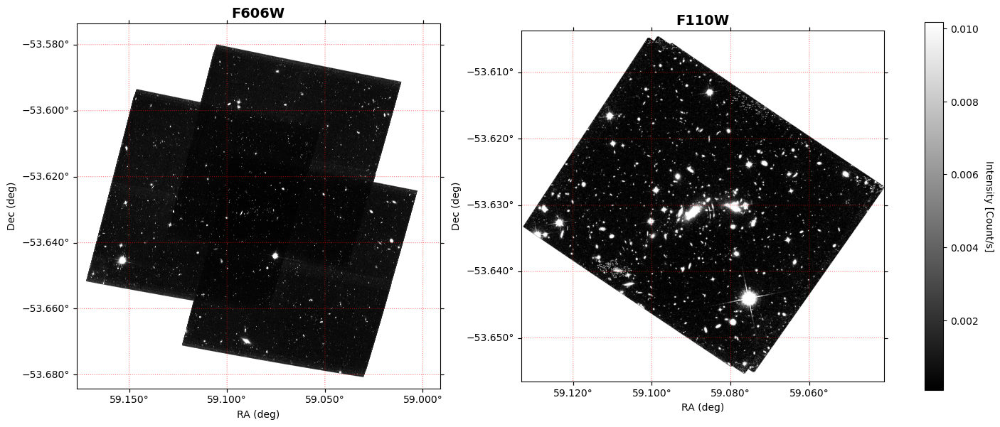

In [ ]:
wcs1 = WCS(header[0])
wcs2 = WCS(header[2])

fig = plt.figure(figsize=(14, 7), layout='constrained')

vmin_log = max(1e-4, np.nanpercentile(data[0], 5)) 
vmax_log = np.nanpercentile(data[0], 99.5)

ax1 = fig.add_subplot(1, 2, 1, projection=wcs1)   # Projected in the ra dec grid and not in pixels
im1 = ax1.imshow(data[0], cmap='gray', origin='lower', vmin=vmin_log, vmax=vmax_log)
ax1.set_title('F606W', fontsize=14, fontweight='bold')

ax2 = fig.add_subplot(1, 2, 2, projection=wcs2)
im2 = ax2.imshow(data[2], cmap='gray', origin='lower', vmin=vmin_log, vmax=vmax_log)
ax2.set_title('F110W', fontsize=14, fontweight='bold')

for ax in [ax1, ax2]:
    ax.coords['ra'].set_major_formatter('d.ddd') # To plot in degrees with 3 number after the ,
    ax.coords['dec'].set_major_formatter('d.ddd')
    
    ax.set_xlabel('RA (deg)')
    ax.set_ylabel('Dec (deg)')

    ax.coords.grid(color='red', ls='dotted', alpha=0.5)

cbar = fig.colorbar(im1, ax=[ax1, ax2], location='right', shrink=0.8)
cbar.set_label('Intensity [Count/s]', rotation=270, labelpad=15)

plt.show()

In [52]:
white_image_unaligned = compute_white_image(data)

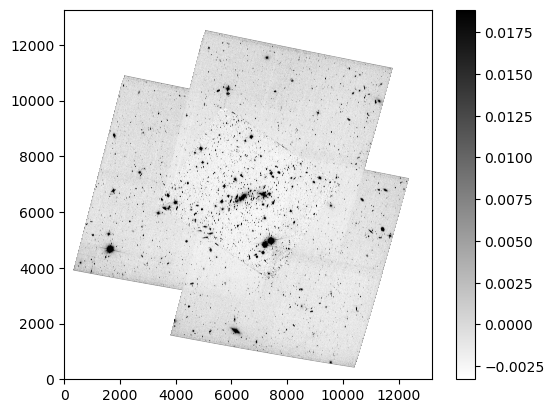

In [53]:
plt.imshow(white_image_unaligned, cmap='binary', origin='lower', vmin=np.nanpercentile(white_image_unaligned, 30), vmax=np.nanpercentile(white_image_unaligned, 99))
plt.colorbar()
plt.show()

In [60]:
center_1 = get_center(data[0], header[0])
center_2 = get_center(data[1], header[1])
center_3 = get_center(data[2], header[2])
center_4 = get_center(data[3], header[3])
print(center_1)
print(center_2)
print(center_3)
print(center_4)

[ 59.08399282 -53.62887798]
[ 59.08399282 -53.62887798]
[ 59.08702463 -53.63010735]
[ 59.08701825 -53.63010111]


The white light image gets blurry. This is due to the unalignement of the images. Images in the red part of the specter are not obtained with the same camera than the others. The central/reference pixel is not aligned with the central/reference pixel of the other cameras eventhough they are pointed in the same direction.

### Alignement of the FITS files

In [82]:
ref = "SPT-CLJ0356-5337_F606W.fits"

In [179]:
to_align = ["SPT-CLJ0356-5337_F814W_0.03g0.8_cr2.5_0.7_drc_sci.fits", 
            "SPT-CLJ0356-5337_F110W_0.03g0.8_cr4.0_0.7_drz_sci.fits",
            "SPT-CLJ0356-5337_F160W_0.03g0.8_cr4.0_0.7_drz_sci.fits"]

In [42]:
aligned = ["SPT-CLJ0356-5337_F814W_aligned.fits",
           "SPT-CLJ0356-5337_F110W_aligned.fits",
           "SPT-CLJ0356-5337_F160W_aligned.fits"]

In [ ]:
align_fits_reproject(ref, to_align, aligned)

In [43]:
files_corrected = ["SPT-CLJ0356-5337_F606W_0.03g0.8_cr2.5_0.7_drc_sci.fits",
                   "SPT-CLJ0356-5337_F814W_aligned.fits",
                   "SPT-CLJ0356-5337_F110W_aligned.fits",
                   "SPT-CLJ0356-5337_F160W_aligned.fits"]

In [44]:
data_corrected, header_corrected = loading(files_corrected)

In [45]:
center_1 = get_center(data_corrected[0], header_corrected[0])
center_2 = get_center(data_corrected[1], header_corrected[1])
center_3 = get_center(data_corrected[2], header_corrected[2])
center_4 = get_center(data_corrected[3], header_corrected[3])
print(center_1)
print(center_2)
print(center_3)
print(center_4)

[ 59.08399282 -53.62887798]
[ 59.08399282 -53.62887798]
[ 59.08399282 -53.62887798]
[ 59.08399282 -53.62887798]


### White image

In [47]:
white_image = compute_white_image(data_corrected)

In [48]:
hdul = fits.open('SPT-CLJ0356-5337_F606W.fits')
print(hdul[0].header.get('BUNIT', 'Units not found'))

ELECTRONS/S


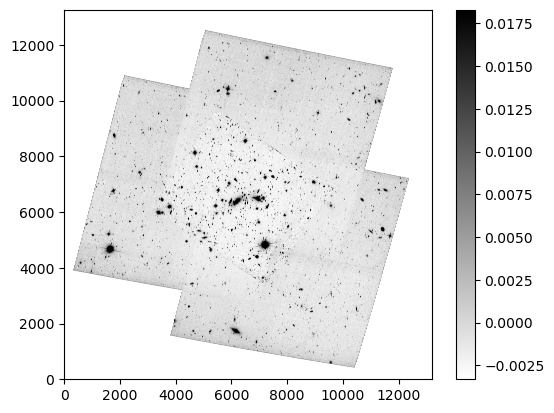

In [49]:
plt.imshow(white_image, cmap='binary', origin='lower', vmin=np.nanpercentile(white_image, 30), vmax=np.nanpercentile(white_image, 99))
plt.colorbar()
plt.show()

In [54]:
h, w = white_image.data.shape
cy, cx = h//2, w//2

sub_white = white_image[cy-1000:cy+1000, cx-1000:cx+1000]
sub_white_unal = white_image_unaligned[cy-1000:cy+1000, cx-1000:cx+1000]

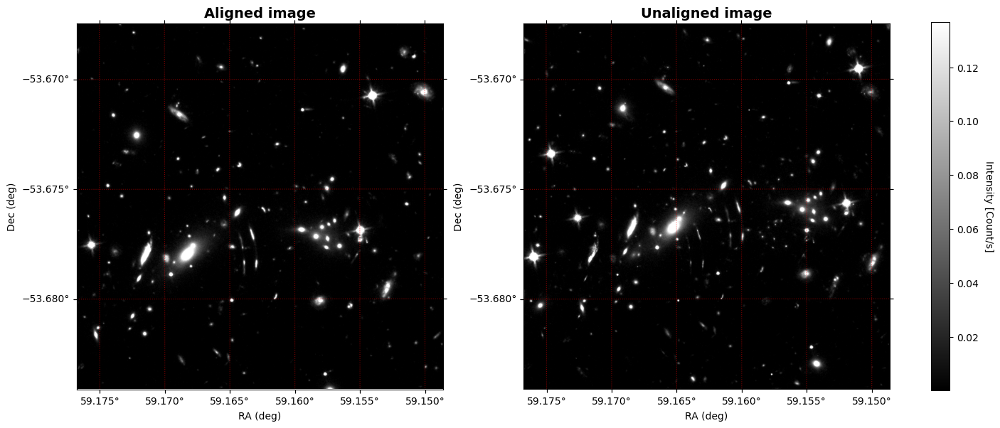

In [55]:
wcs1 = WCS(header[0])

fig = plt.figure(figsize=(14, 7), layout='constrained')

vmin_log = max(1e-4, np.nanpercentile(sub_white, 5)) 
vmax_log = np.nanpercentile(sub_white, 99.5)

ax1 = fig.add_subplot(1, 2, 1, projection=wcs1)   # Projected in the ra dec grid and not in pixels
im1 = ax1.imshow(sub_white, cmap='gray', origin='lower', vmin=vmin_log, vmax=vmax_log)
ax1.set_title('Aligned image', fontsize=14, fontweight='bold')

ax2 = fig.add_subplot(1, 2, 2, projection=wcs1)
im2 = ax2.imshow(sub_white_unal, cmap='gray', origin='lower', vmin=vmin_log, vmax=vmax_log)
ax2.set_title('Unaligned image', fontsize=14, fontweight='bold')

for ax in [ax1, ax2]:
    ax.coords['ra'].set_major_formatter('d.ddd') # To plot in degrees with 3 number after the ,
    ax.coords['dec'].set_major_formatter('d.ddd')
    
    ax.set_xlabel('RA (deg)')
    ax.set_ylabel('Dec (deg)')

    ax.coords.grid(color='red', ls='dotted', alpha=0.5)

cbar = fig.colorbar(im1, ax=[ax1, ax2], location='right', shrink=0.8)
cbar.set_label('Intensity [Count/s]', rotation=270, labelpad=15)

plt.show()

### Detection of the sources

In [659]:
segmentation_map, bkg, kernel = detection_sources_opti(white_image, coef_threshold=3, n_pixels=80)

Deblending:   0%|          | 0/1122 [00:00<?, ?it/s]

In [660]:
h, w = white_image.data.shape
cy, cx = h//2, w//2

sub_white = white_image[cy-1000:cy+1000, cx-1000:cx+1000]
sub_seg = segmentation_map.data[cy-1000:cy+1000, cx-1000:cx+1000]

In [661]:
sub_bkg = bkg.background[cy-1000:cy+1000, cx-1000:cx+1000]
sub_rms = bkg.background_rms[cy-1000:cy+1000, cx-1000:cx+1000]

In [662]:
wcs1 = WCS(header_corrected[0])
sub_wcs = wcs1[cy-1000:cy+1000, cx-1000:cx+1000]

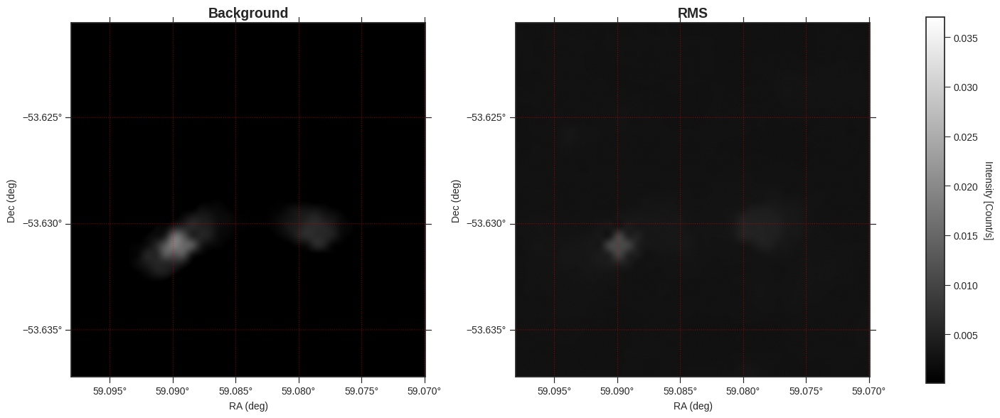

In [663]:
fig = plt.figure(figsize=(14, 7), layout='constrained')

vmin_log = max(1e-4, np.nanpercentile(white_image, 5)) 
vmax_log = np.nanpercentile(white_image, 99.5)

ax1 = fig.add_subplot(1, 2, 1, projection=sub_wcs)   # Projected in the ra dec grid and not in pixels
im1 = ax1.imshow(sub_bkg, cmap='gray', origin='lower', vmin=vmin_log, vmax=vmax_log)
ax1.set_title('Background', fontsize=14, fontweight='bold')

ax2 = fig.add_subplot(1, 2, 2, projection=sub_wcs)
im2 = ax2.imshow(sub_rms, cmap='gray', origin='lower', vmin=vmin_log, vmax=vmax_log)
ax2.set_title('RMS', fontsize=14, fontweight='bold')

for ax in [ax1, ax2]:
    ax.coords['ra'].set_major_formatter('d.ddd') # To plot in degrees with 3 number after the ,
    ax.coords['dec'].set_major_formatter('d.ddd')
    
    ax.set_xlabel('RA (deg)')
    ax.set_ylabel('Dec (deg)')

    ax.coords.grid(color='red', ls='dotted', alpha=0.5)

cbar = fig.colorbar(im1, ax=[ax1, ax2], location='right', shrink=0.8)
cbar.set_label('Intensity [Count/s]', rotation=270, labelpad=15)

plt.show()

<>:11: SyntaxWarning: invalid escape sequence '\s'
<>:11: SyntaxWarning: invalid escape sequence '\s'
/tmp/ipykernel_74240/3329895376.py:11: SyntaxWarning: invalid escape sequence '\s'
  ax.set_title('Gaussian Kernel ($\sigma=3.0$, size=9)', fontsize=12, fontweight='bold')


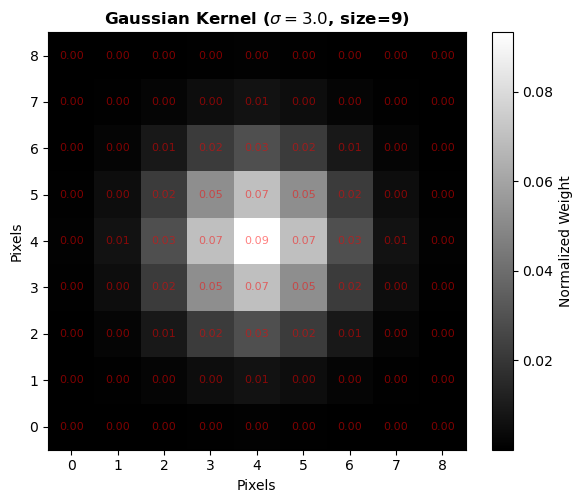

In [52]:
kernel = make_2dgaussian_kernel(3.0, size=9)

fig, ax = plt.subplots(figsize=(6, 5))

im = ax.imshow(kernel, cmap='gray', origin='lower', interpolation='none')

for (j, i), label in np.ndenumerate(kernel.array):
    ax.text(i, j, f'{label:.2f}', ha='center', va='center', 
            color='red', fontsize=8, alpha=0.5)

ax.set_title('Gaussian Kernel ($\sigma=3.0$, size=9)', fontsize=12, fontweight='bold')
ax.set_xlabel('Pixels')
ax.set_ylabel('Pixels')

cbar = fig.colorbar(im, ax=ax)
cbar.set_label('Normalized Weight')

plt.tight_layout()
plt.show()

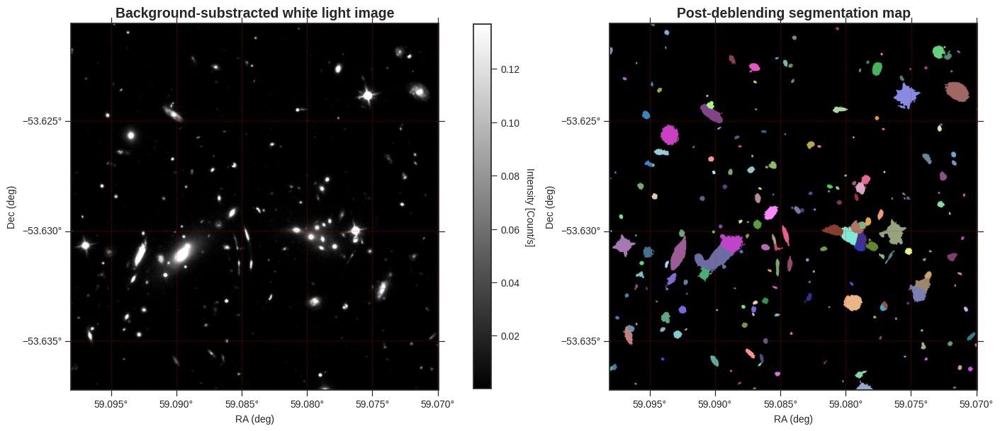

In [373]:
wcs1 = WCS(header_corrected[0])

fig = plt.figure(figsize=(14, 7), layout='constrained')

vmin_log = max(1e-4, np.nanpercentile(sub_white, 5)) 
vmax_log = np.nanpercentile(sub_white, 99.5)

ax1 = fig.add_subplot(1, 2, 1, projection=sub_wcs)   # Projected in the ra dec grid and not in pixels
im1 = ax1.imshow(sub_white, cmap='gray', origin='lower', vmin=vmin_log, vmax=vmax_log)
ax1.set_title('Background-substracted white light image', fontsize=14, fontweight='bold')

ax2 = fig.add_subplot(1, 2, 2, projection=sub_wcs)
im2 = ax2.imshow(sub_seg, cmap=segmentation_map.cmap, origin='lower')
ax2.set_title('Post-deblending segmentation map', fontsize=14, fontweight='bold')

for ax in [ax1, ax2]:
    ax.coords['ra'].set_major_formatter('d.ddd') # To plot in degrees with 3 number after the ,
    ax.coords['dec'].set_major_formatter('d.ddd')
    
    ax.set_xlabel('RA (deg)')
    ax.set_ylabel('Dec (deg)')

    ax.coords.grid(color='red', ls='dotted', alpha=0.5)

cbar = fig.colorbar(im1, ax=[ax1], location='right', shrink=0.8)
cbar.set_label('Intensity [Count/s]', rotation=270, labelpad=15)

plt.show()

In [ ]:
seg_map_corrected = merge_sources(segmentation_map, 1093, 2108)   #Part of a source from Set 3 that was over-deblended

In [57]:
type(seg_map_corrected)

photutils.segmentation.core.SegmentationImage

Exportation and importation

In [59]:
with open("segmentation_map_SPTCLJ0356-5337_version_ultra_finale.pkl", 'wb') as file:
    pkl.dump(seg_map_corrected, file)

In [60]:
with open("segmentation_map_SPTCLJ0356-5337_version_ultra_finale.pkl", 'rb') as file:
    segmentation_map = pkl.load(file)

In [61]:
export_seg_map(seg_map_corrected, header_corrected[0], "version_ultra_finale")

### Creation of the photometric catalog

In [56]:
filter_names = ["F606W", "F814W", "F110W", "F160W"]

In [63]:
photometric_catalog = generate_multi_band_catalog(data_corrected, header_corrected, seg_map_corrected,
                                                  white_image, filter_names=filter_names, type_var='heavy', thread=False)

Extraction of the positions of the sources ...
Creation of the photometric catalog for band: F606W
Creation of the photometric catalog for band: F814W
Creation of the photometric catalog for band: F110W
Creation of the photometric catalog for band: F160W
Merging ...
['flux_F606W', 'flux_err_F606W', 'flux_F814W', 'flux_err_F814W', 'flux_F110W', 'flux_err_F110W', 'flux_F160W', 'flux_err_F160W']
Catalog created !


In [93]:
photometric_catalog.describe()

,segment_id,xcentroid,ycentroid,ra,dec,a,b,theta,flux_F606W,flux_err_F606W,flux_F814W,flux_err_F814W,flux_F110W,flux_err_F110W,flux_F160W,flux_err_F160W
count,925.000000,925.000000,925.000000,925.000000,925.000000,925.000000,925.000000,925.000000,925.000000,925.000000,925.000000,925.000000,925.000000,925.000000,925.000000,925.000000
mean,1152.698378,6421.813952,6447.663850,59.086412,-53.630413,6.856593,4.264648,-1.766497,14.130901,0.039646,18.574950,0.042786,76.904715,0.038430,54.883586,0.027919
std,484.908213,1357.407265,1275.935052,0.019075,0.010633,4.645485,2.513381,54.383960,209.651859,0.034407,223.752597,0.036507,911.715780,0.048756,573.723155,0.033382
min,279.000000,3314.744432,3465.882536,59.041030,-53.655262,1.759949,1.342836,-89.860494,-0.555632,0.012490,-0.306418,0.013554,-14.732612,0.011400,0.115179,0.008176
25%,793.000000,5409.525166,5592.183918,59.072236,-53.637543,3.856079,2.631633,-50.482008,0.363448,0.020300,0.390013,0.022028,1.290932,0.018336,0.673897,0.013418
50%,1109.000000,6399.093048,6456.532933,59.086732,-53.630340,5.409887,3.553438,-1.650998,0.899559,0.030396,0.934256,0.032608,3.588731,0.026746,2.065809,0.019486
75%,1434.000000,7430.836081,7357.024010,59.100637,-53.622832,8.276985,4.932825,48.104340,2.688165,0.047076,3.116258,0.050547,14.258509,0.043619,8.541816,0.031612
max,2178.000000,9651.431790,9448.477385,59.130080,-53.605406,43.368886,22.183839,89.938364,6185.550740,0.574050,6274.343395,0.559534,26440.414795,0.997460,16356.946742,0.557353


In [64]:
flux_columns = ["flux_F606W", "flux_F814W", "flux_F110W", "flux_F160W"]

In [81]:
bad = photometric_catalog[(photometric_catalog[flux_columns] <= 0).any(axis=1)]

In [85]:
photometric_catalog_cleaned = photometric_catalog[(photometric_catalog[flux_columns] >= 0).all(axis=1)]

In [86]:
photometric_catalog_cleaned

,segment_id,xcentroid,ycentroid,ra,dec,a,b,theta,flux_F606W,flux_err_F606W,flux_F814W,flux_err_F814W,flux_F110W,flux_err_F110W,flux_F160W,flux_err_F160W
1,282,7147.995970,3478.882181,59.076203,-53.655154,2.023070,1.666733,50.445631,0.029267,0.023864,0.037061,0.025741,68.915331,0.044295,4.685061,0.030918
3,286,7319.496855,3502.463163,59.073791,-53.654957,2.167423,1.505298,67.033804,0.031251,0.026185,0.025880,0.027442,71.193520,0.041571,4.414715,0.028400
4,292,7233.923387,3562.304973,59.074995,-53.654458,9.815137,5.333726,89.915997,3.171547,0.067271,2.723057,0.069969,10.510420,0.130350,6.288125,0.086809
5,293,7273.208660,3572.915795,59.074442,-53.654370,4.827875,4.246270,17.331610,0.288244,0.047692,0.705540,0.050311,8.989374,0.094304,6.196247,0.063128
6,298,7353.419413,3598.751586,59.073315,-53.654155,4.187140,2.928434,63.436063,1.441190,0.036750,1.283409,0.038945,5.050030,0.071160,2.392169,0.046644
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
905,2151,6130.680815,7828.259092,59.090502,-53.618909,9.077312,5.879222,-81.733487,0.417009,0.039124,0.505367,0.042454,4.675430,0.035805,7.779512,0.025601
906,2152,6342.333218,7849.107393,59.087529,-53.618735,19.054341,9.003307,47.712324,6.480625,0.070082,5.470903,0.077132,23.252011,0.067536,13.247027,0.046891
907,2153,6302.137476,7843.006129,59.088093,-53.618786,8.669769,6.540598,-44.884007,1.271627,0.034887,1.149369,0.038267,3.776553,0.033441,1.858750,0.023769
916,2162,6037.785745,8163.801218,59.091807,-53.616113,5.898595,3.717974,-4.541351,1.204350,0.028999,0.972723,0.031517,4.199182,0.025766,2.575462,0.018512


Export the catalog

In [95]:
photometric_catalog_cleaned.to_pickle("cleaned_photometric_catalog_version_ultra_finale.pkl")

In [50]:
photometric_catalog_cleaned = pd.read_pickle("cleaned_photometric_catalog_version_ultra_finale.pkl")

In [51]:
photometric_catalog_cleaned[photometric_catalog_cleaned["segment_id"]==884]

,segment_id,xcentroid,ycentroid,ra,dec,a,b,theta,flux_F606W,flux_err_F606W,flux_F814W,flux_err_F814W,flux_F110W,flux_err_F110W,flux_F160W,flux_err_F160W
295,884,5739.216064,5988.971303,59.096006,-53.634236,3.071729,2.485651,-86.169298,0.044817,0.016063,0.511035,0.017502,1.377629,0.015207,0.645084,0.011266


Clean with SN ratio

In [52]:
photometric_catalog_test = SN_ratio_cleaning(photometric_catalog_cleaned, ['F110W', 'F814W', 'F606W', 'F160W'], threshold=10)

Number of discarded sources: 108


In [53]:

lignes_selectionnees = photometric_catalog_cleaned[photometric_catalog_cleaned['segment_id'].isin([1069, 884])]

photometric_catalog_test = pd.concat([photometric_catalog_test, lignes_selectionnees]).reset_index(drop=True)

In [54]:
photometric_catalog_test[photometric_catalog_test["segment_id"]==884]

,segment_id,xcentroid,ycentroid,ra,dec,a,b,theta,flux_F606W,flux_err_F606W,flux_F814W,flux_err_F814W,flux_F110W,flux_err_F110W,flux_F160W,flux_err_F160W
786,884,5739.216064,5988.971303,59.096006,-53.634236,3.071729,2.485651,-86.169298,0.044817,0.016063,0.511035,0.017502,1.377629,0.015207,0.645084,0.011266


In [57]:
photometric_catalog_mag = convert_to_mag(photometric_catalog_test, header_corrected, filter_names, ADU=False)

In [58]:
photometric_catalog_mag.describe()

,segment_id,xcentroid,ycentroid,ra,dec,a,b,theta,flux_F606W,flux_err_F606W,flux_F814W,flux_err_F814W,flux_F110W,flux_err_F110W,flux_F160W,flux_err_F160W
count,788.000000,788.000000,788.000000,788.000000,788.000000,788.000000,788.000000,788.000000,788.000000,788.000000,788.000000,788.000000,788.000000,788.000000,788.000000,788.000000
mean,1146.935279,6373.416372,6422.741901,59.087092,-53.630620,7.132551,4.482578,-1.251547,26.040478,0.034223,25.364529,0.033397,24.988432,0.009982,24.735719,0.014260
std,475.834314,1360.030820,1245.474860,0.019113,0.010379,4.637965,2.615994,55.448003,1.515647,0.027306,1.655530,0.023045,1.849457,0.008401,1.967916,0.013470
min,292.000000,3384.555813,3562.304973,59.041294,-53.654458,2.309406,1.342836,-89.860494,17.007049,0.000101,16.440156,0.000097,15.763338,0.000041,15.403365,0.000037
25%,789.750000,5357.172714,5555.163986,59.072749,-53.637849,4.185885,2.768121,-54.686252,25.196443,0.015139,24.467499,0.014704,23.854657,0.003321,23.532170,0.003927
50%,1102.500000,6351.178432,6424.230216,59.087405,-53.630609,5.777454,3.754049,0.320425,26.234023,0.027904,25.624742,0.029413,25.295590,0.007460,25.012940,0.009796
75%,1423.250000,7394.138208,7269.240788,59.101376,-53.623566,8.666637,5.252697,49.494960,27.167486,0.045810,26.608597,0.048346,26.425391,0.014831,26.265506,0.021517
max,2163.000000,9632.636336,9448.477385,59.129100,-53.605406,43.368886,22.183839,89.938364,29.856887,0.389141,27.990047,0.107817,28.200068,0.049638,28.284189,0.085519


In [59]:
photometric_catalog_mag[photometric_catalog_mag["segment_id"] == 997]

,segment_id,xcentroid,ycentroid,ra,dec,a,b,theta,flux_F606W,flux_err_F606W,flux_F814W,flux_err_F814W,flux_F110W,flux_err_F110W,flux_F160W,flux_err_F160W
326,997,8130.160131,6332.66269,59.062405,-53.631371,6.540485,3.487762,-71.555859,25.433245,0.014089,25.21722,0.021092,25.126719,0.006043,24.783773,0.007404


### Extraction of the red sequence

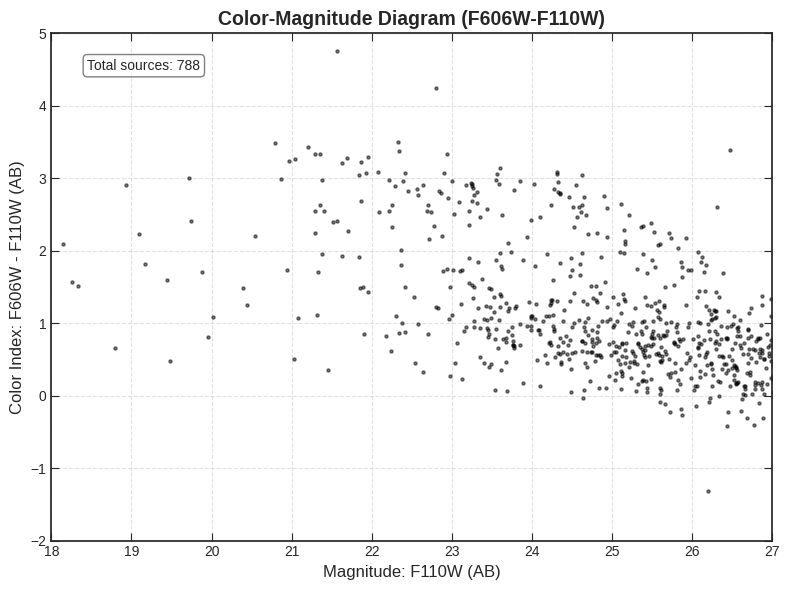

In [60]:
make_color_index_diagram(photometric_catalog_mag, band_1="F606W", band_2="F110W", band_x="F110W", ylim_max=5, ylim_min=-2, xlim_min=18, xlim_max=27)

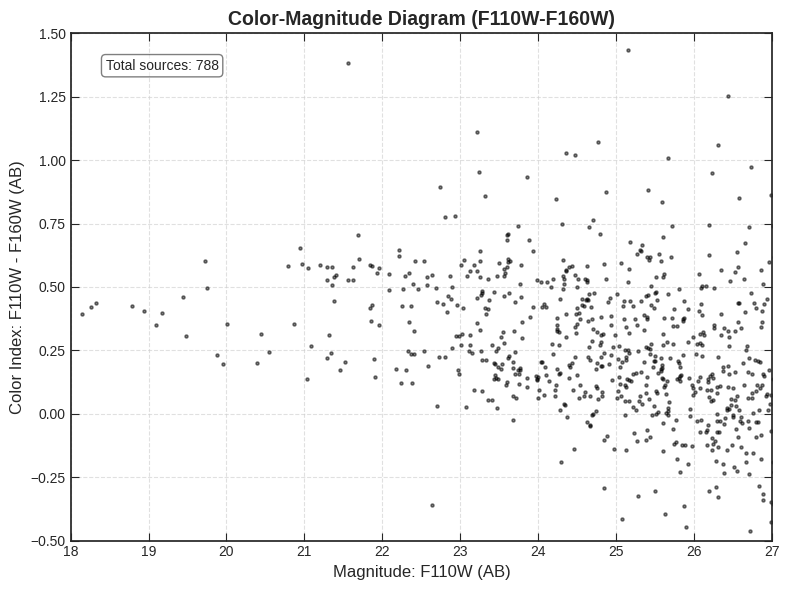

In [61]:
make_color_index_diagram(photometric_catalog_mag, band_1="F110W", band_2="F160W", band_x="F110W", ylim_max=1.5, ylim_min=-0.5, xlim_min=18, xlim_max=27)

#### Regression method

In [62]:
hist, xedg, yedg = make_hist_2D(photometric_catalog_mag, bins=100, band_1="F110W", band_2="F160W", band_x="F110W")

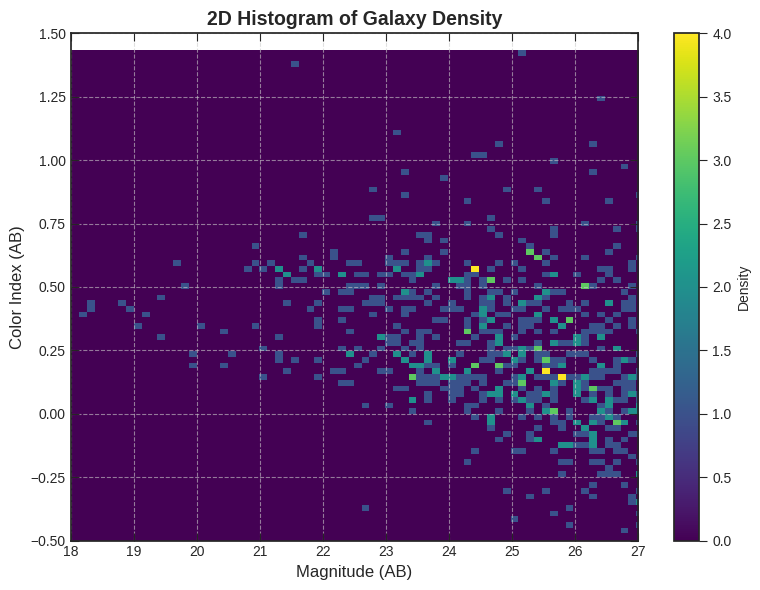

In [63]:
show_hist_2D(hist, xedg, yedg, ylim_max=1.5, ylim_min=-0.5, xlim_min=18, xlim_max=27)

In [64]:
color = photometric_catalog_mag["flux_F110W"] - photometric_catalog_mag["flux_F160W"]
mag_110 = photometric_catalog_mag["flux_F110W"]
catalog_18_23 = photometric_catalog_mag[(color>0) & (color<1) & (mag_110<23) & (mag_110>18)]
color_18_23 = catalog_18_23["flux_F110W"] - catalog_18_23["flux_F160W"]

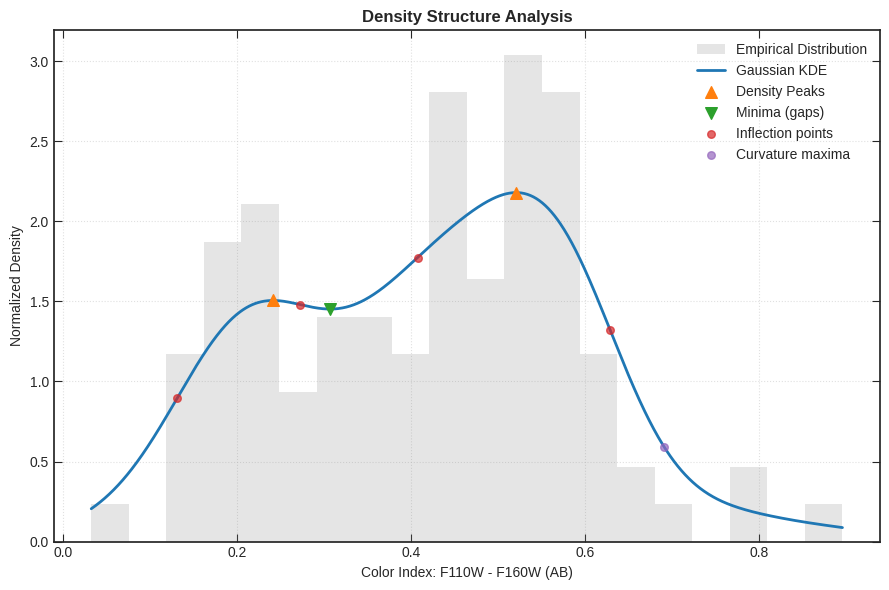

In [65]:
analysis_index = density_gap_finder(catalog_18_23, "F110W", "F160W", plot=True)

Regression: y = -0.049 * x + 1.588


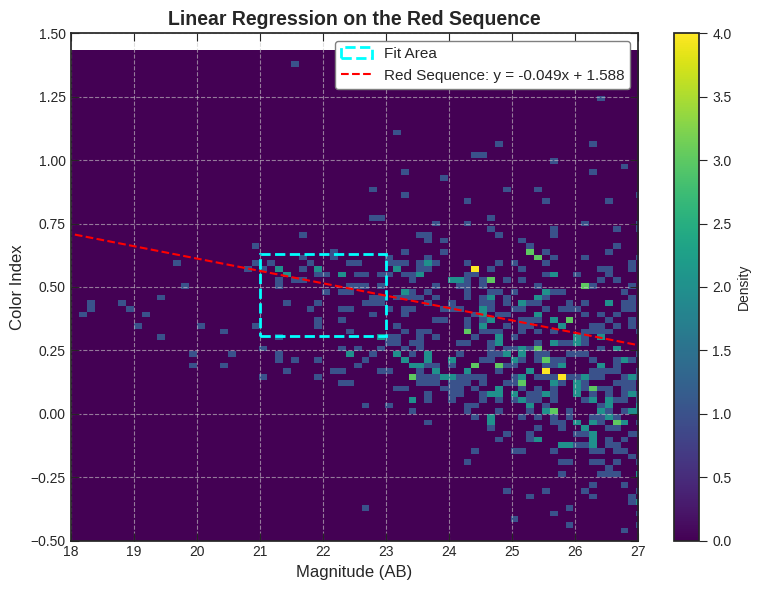

In [66]:
coeffs = select_red_sequence(hist, xedg, yedg, index_min=analysis_index["minima"][0], index_max=analysis_index["inflections"][3], mag_min=21, mag_max=23,
                             ylim_max=1.5, ylim_min=-0.5, xlim_min=18, xlim_max=27, plot=True)

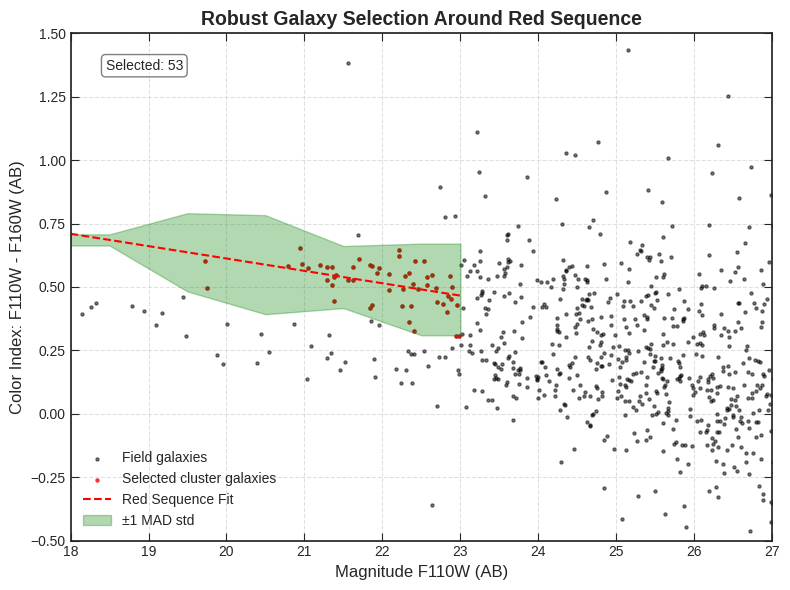

[INFO] Selected 53 cluster galaxies, rejected 735 field galaxies.


In [67]:
cluster_galaxies, field_galaxies = robust_red_sequence_selection(coeffs, photometric_catalog_mag, mag_min=18, mag_max=23, sigma=1,
                                                                 n_bins=None, min_bin_size=5,
                                                                 ylim_max=1.5, ylim_min=-0.5, xlim_min=18, xlim_max=27)

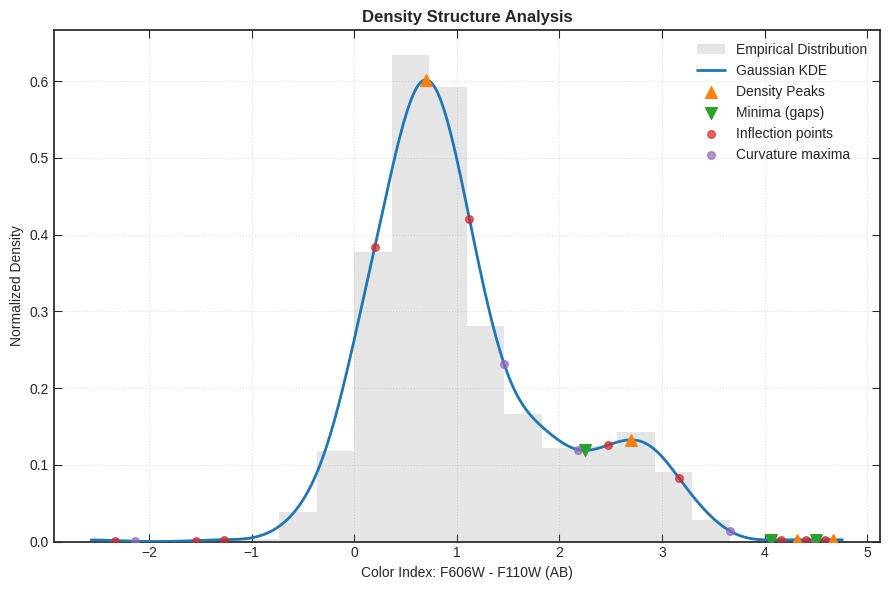

In [68]:
analysis_rb = density_gap_finder(photometric_catalog_mag, "F606W", "F110W", plot=True)

In [69]:
analysis_rb["curvature_max"][1]

np.float64(1.4607683591449154)

In [70]:
correction_color = cluster_galaxies[(cluster_galaxies['flux_F606W']-cluster_galaxies['flux_F110W'])<=analysis_rb["curvature_max"][1]]

In [71]:
cluster_galaxies = cluster_galaxies[~cluster_galaxies['segment_id'].isin(correction_color['segment_id'])]
field_galaxies = pd.concat([field_galaxies, correction_color], ignore_index=True)

In [72]:
cluster_galaxies.reset_index(drop=True)
field_galaxies.reset_index(drop=True)
print(f'There are {len(cluster_galaxies)} cluster galaxies and {len(field_galaxies)} field galaxies.')

There are 50 cluster galaxies and 738 field galaxies.


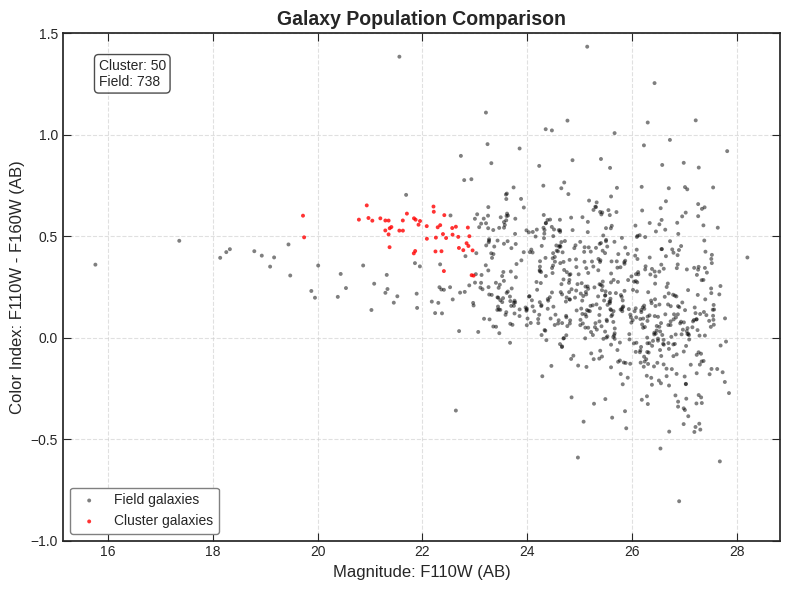

In [73]:
plt.style.use('seaborn-v0_8-ticks')
fig, ax = plt.subplots(figsize=(8, 6))

ax.scatter(field_galaxies['flux_F110W'], 
           field_galaxies['flux_F110W'] - field_galaxies['flux_F160W'],
           color='black', s=8, alpha=0.5, label='Field galaxies', edgecolors='none')

ax.scatter(cluster_galaxies['flux_F110W'], 
           cluster_galaxies['flux_F110W'] - cluster_galaxies['flux_F160W'],
           color='red', s=8, alpha=0.8, label='Cluster galaxies', edgecolors='none')

ax.set_title('Galaxy Population Comparison', fontsize=14, fontweight='bold')
ax.set_xlabel('Magnitude: F110W (AB)', fontsize=12)
ax.set_ylabel('Color Index: F110W - F160W (AB)', fontsize=12)

ax.set_ylim(-1, 1.5)

ax.grid(True, linestyle='--', alpha=0.6)
ax.tick_params(which='both', direction='in', top=True, right=True)

info_text = f"Cluster: {len(cluster_galaxies)}\nField: {len(field_galaxies)}"
ax.text(0.05, 0.95, info_text, transform=ax.transAxes, 
        verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.7))

ax.legend(loc='lower left', frameon=True, facecolor='white')

plt.tight_layout()
plt.show()

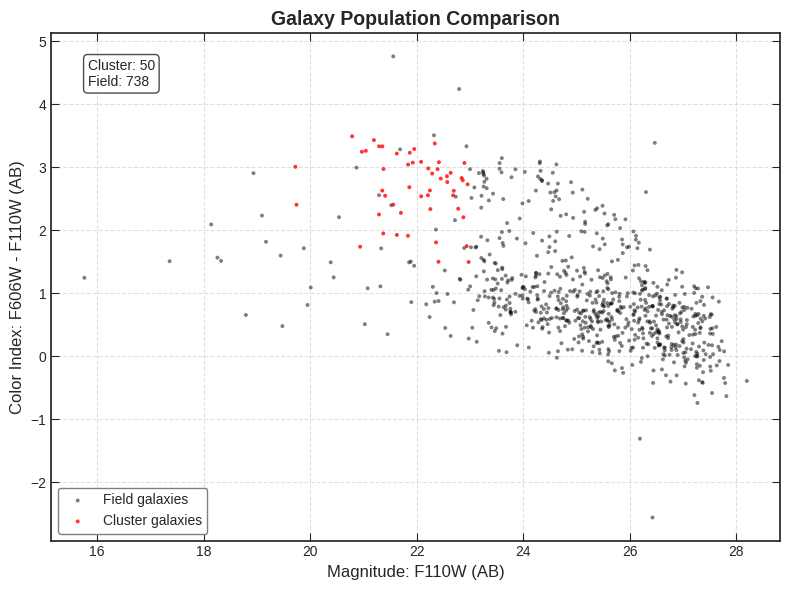

In [74]:
plt.style.use('seaborn-v0_8-ticks')
fig, ax = plt.subplots(figsize=(8, 6))

ax.scatter(field_galaxies['flux_F110W'], 
           field_galaxies['flux_F606W'] - field_galaxies['flux_F110W'],
           color='black', s=8, alpha=0.5, label='Field galaxies', edgecolors='none')

ax.scatter(cluster_galaxies['flux_F110W'], 
           cluster_galaxies['flux_F606W'] - cluster_galaxies['flux_F110W'],
           color='red', s=8, alpha=0.8, label='Cluster galaxies', edgecolors='none')

ax.set_title('Galaxy Population Comparison', fontsize=14, fontweight='bold')
ax.set_xlabel('Magnitude: F110W (AB)', fontsize=12)
ax.set_ylabel('Color Index: F606W - F110W (AB)', fontsize=12)

ax.grid(True, linestyle='--', alpha=0.6)
ax.tick_params(which='both', direction='in', top=True, right=True)

info_text = f"Cluster: {len(cluster_galaxies)}\nField: {len(field_galaxies)}"
ax.text(0.05, 0.95, info_text, transform=ax.transAxes, 
        verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.7))

ax.legend(loc='lower left', frameon=True, facecolor='white')

plt.tight_layout()
plt.show()

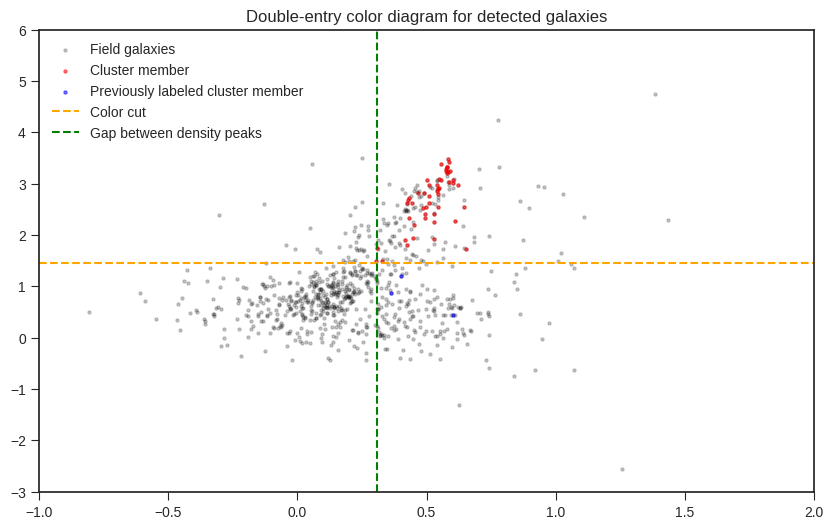

In [75]:
plt.figure(figsize=(10,6))

plt.scatter(photometric_catalog_mag['flux_F110W']-photometric_catalog_mag['flux_F160W'],
            photometric_catalog_mag['flux_F606W']-photometric_catalog_mag['flux_F110W'],
            color='black', alpha=0.2, s=5, label="Field galaxies")
plt.scatter(cluster_galaxies['flux_F110W']-cluster_galaxies['flux_F160W'],
            cluster_galaxies['flux_F606W']-cluster_galaxies['flux_F110W'],
            color='red', alpha=0.5, s=5, label="Cluster member")
plt.scatter(correction_color['flux_F110W']-correction_color['flux_F160W'],
            correction_color['flux_F606W']-correction_color['flux_F110W'],
            color='blue', alpha=0.5, s=5, label="Previously labeled cluster member")

plt.axhline(y=analysis_rb["curvature_max"][1], color='orange', linestyle='--', label="Color cut")
plt.axvline(x=analysis_index["minima"][0], color='green', linestyle='--', label="Gap between density peaks")

plt.legend()
plt.title("Double-entry color diagram for detected galaxies")
plt.xlim(-1,2)
plt.ylim(-3, 6)
plt.show()

#### Comparison with color-color cut method

In [74]:
batch = photometric_catalog_mag[(photometric_catalog_mag["flux_F110W"]-photometric_catalog_mag["flux_F160W"] >= analysis_index["minima"][0]) &
                                (photometric_catalog_mag["flux_F606W"] - photometric_catalog_mag["flux_F110W"]>= analysis_rb["curvature_max"][1]) &
                                (photometric_catalog_mag["flux_F110W"] >= 19.5) &
                                (photometric_catalog_mag["flux_F110W"] <= 24.5)]

In [75]:
list_batch = batch['segment_id'].tolist()

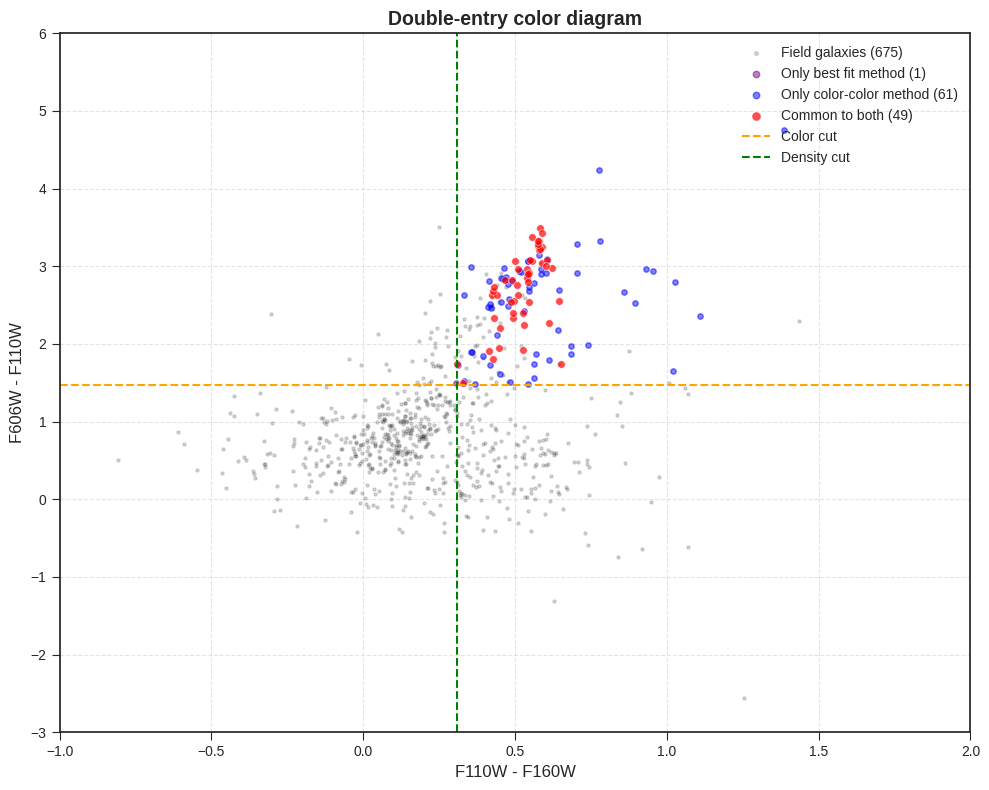

In [76]:

ids_c1 = cluster_galaxies['segment_id'].unique()
ids_c2 = batch['segment_id'].unique() 

mask_both = photometric_catalog_mag['segment_id'].isin(ids_c1) & photometric_catalog_mag['segment_id'].isin(ids_c2)
mask_only_c1 = photometric_catalog_mag['segment_id'].isin(ids_c1) & ~photometric_catalog_mag['segment_id'].isin(ids_c2)
mask_only_c2 = photometric_catalog_mag['segment_id'].isin(ids_c2) & ~photometric_catalog_mag['segment_id'].isin(ids_c1)
mask_field = ~photometric_catalog_mag['segment_id'].isin(ids_c1) & ~photometric_catalog_mag['segment_id'].isin(ids_c2)

plt.style.use('seaborn-v0_8-ticks')
plt.figure(figsize=(10, 8))

df_f = photometric_catalog_mag[mask_field]
plt.scatter(df_f['flux_F110W'] - df_f['flux_F160W'], df_f['flux_F606W'] - df_f['flux_F110W'],
            color='black', alpha=0.15, s=5, label=f"Field galaxies ({len(df_f)})")

df_c1 = photometric_catalog_mag[mask_only_c1]
plt.scatter(df_c1['flux_F110W'] - df_c1['flux_F160W'], df_c1['flux_F606W'] - df_c1['flux_F110W'],
            color='purple', alpha=0.5, s=15, label=f"Only best fit method ({len(df_c1)})")

df_c2 = photometric_catalog_mag[mask_only_c2]
plt.scatter(df_c2['flux_F110W'] - df_c2['flux_F160W'], df_c2['flux_F606W'] - df_c2['flux_F110W'],
            color='blue', alpha=0.5, s=15, label=f"Only color-color method ({len(df_c2)})")

df_b = photometric_catalog_mag[mask_both]
plt.scatter(df_b['flux_F110W'] - df_b['flux_F160W'], df_b['flux_F606W'] - df_b['flux_F110W'],
            color='red', alpha=0.7, s=30, label=f"Common to both ({len(df_b)})", 
            edgecolors='white', linewidths=0.5)

plt.axhline(y=analysis_rb["curvature_max"][1], color='orange', linestyle='--', label="Color cut")
plt.axvline(x=analysis_index["minima"][0], color='green', linestyle='--', label="Density cut")

plt.title("Double-entry color diagram", fontsize=14, fontweight='bold')
plt.xlabel("F110W - F160W", fontsize=12)
plt.ylabel("F606W - F110W", fontsize=12)
plt.xlim(-1, 2)
plt.ylim(-3, 6)
plt.grid(True, linestyle='--', alpha=0.5)
plt.legend(loc='upper right', markerscale=1.2)

plt.tight_layout()
plt.show()

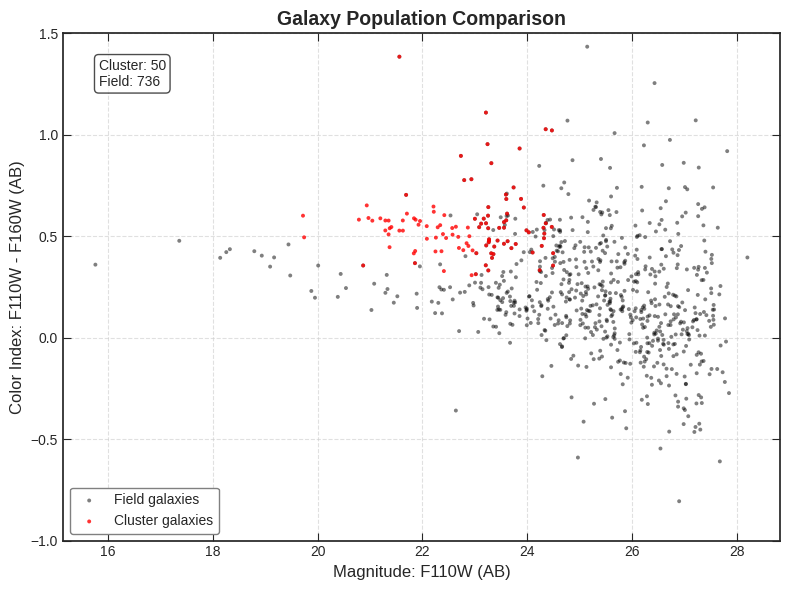

In [77]:
plt.style.use('seaborn-v0_8-ticks')
fig, ax = plt.subplots(figsize=(8, 6))

ax.scatter(field_galaxies['flux_F110W'], 
           field_galaxies['flux_F110W'] - field_galaxies['flux_F160W'],
           color='black', s=8, alpha=0.5, label='Field galaxies', edgecolors='none')

ax.scatter(batch['flux_F110W'], 
           batch['flux_F110W'] - batch['flux_F160W'],
           color='red', s=8, alpha=0.8, label='Cluster galaxies', edgecolors='none')

ax.set_title('Galaxy Population Comparison', fontsize=14, fontweight='bold')
ax.set_xlabel('Magnitude: F110W (AB)', fontsize=12)
ax.set_ylabel('Color Index: F110W - F160W (AB)', fontsize=12)

ax.set_ylim(-1, 1.5)

ax.grid(True, linestyle='--', alpha=0.6)
ax.tick_params(which='both', direction='in', top=True, right=True)

info_text = f"Cluster: {len(cluster_galaxies)}\nField: {len(field_galaxies)}"
ax.text(0.05, 0.95, info_text, transform=ax.transAxes, 
        verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.7))

ax.legend(loc='lower left', frameon=True, facecolor='white')

plt.tight_layout()
plt.show()

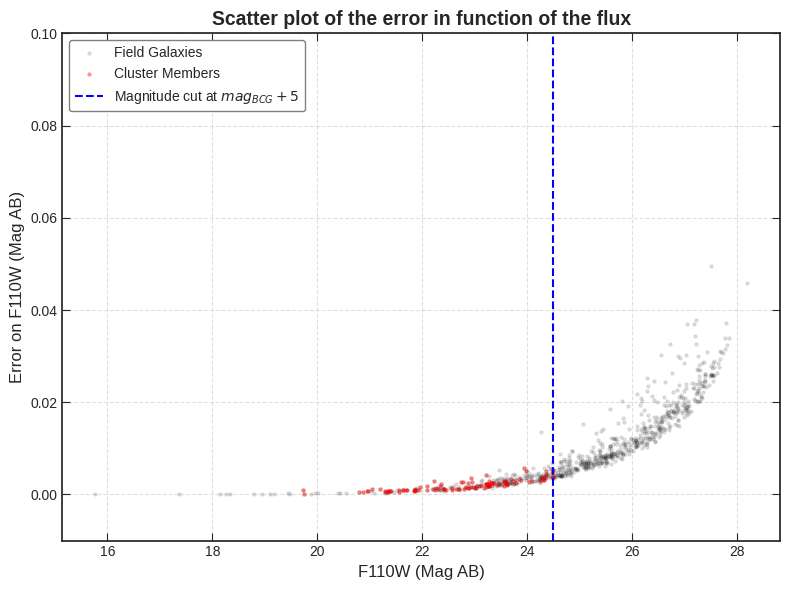

In [78]:
plt.style.use('seaborn-v0_8-ticks')
fig, ax = plt.subplots(figsize=(8, 6))

ax.scatter(photometric_catalog_mag["flux_F110W"], 
           photometric_catalog_mag["flux_err_F110W"],
           c='black', s=5, alpha=0.1, label="Field Galaxies")

ax.scatter(batch["flux_F110W"], 
           batch["flux_err_F110W"],
           c='red', s=5, alpha=0.3, label="Cluster Members")

ax.axvline(x=24.5, color='blue', linestyle="--", label=r"Magnitude cut at $mag_{BCG} + 5$")

ax.set_title("Scatter plot of the error in function of the flux", fontsize=14, fontweight='bold')
ax.set_xlabel("F110W (Mag AB)", fontsize=12)
ax.set_ylabel("Error on F110W (Mag AB)", fontsize=12)

ax.set_ylim(-0.01, 0.10)

ax.grid(True, linestyle='--', alpha=0.6)
ax.tick_params(which='both', direction='in', top=True, right=True)

ax.text(0.05, 0.95, f'Total sources: {len(photometric_catalog_mag)}', 
        transform=ax.transAxes, verticalalignment='top', 
        bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))

ax.legend(loc='upper left', frameon=True)
plt.tight_layout()
plt.show()

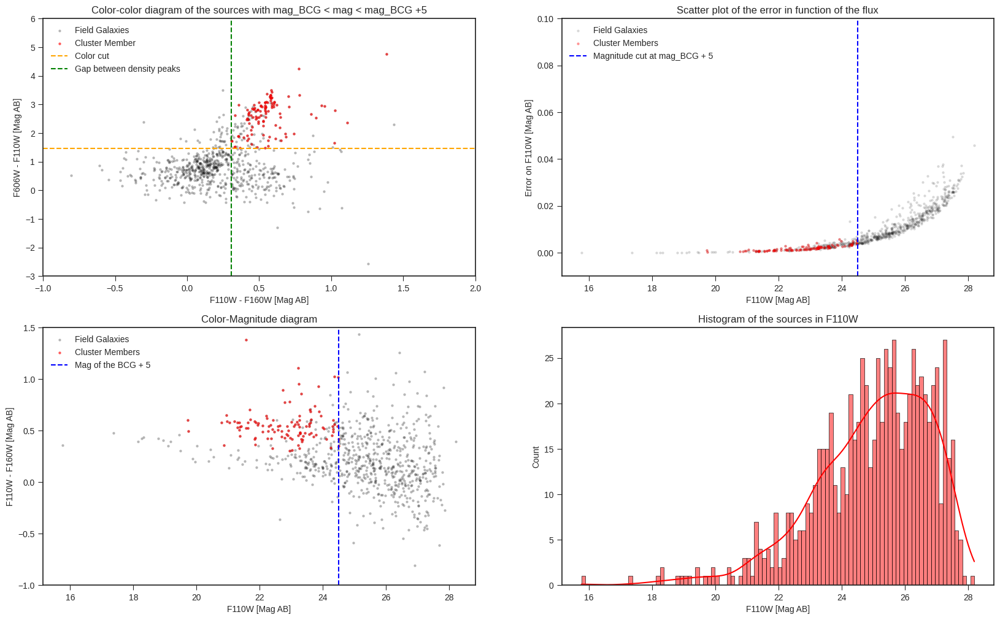

In [79]:
fig, axs = plt.subplots(2,2, figsize=(20,12))

# First plot
axs[0,0].scatter(photometric_catalog_mag['flux_F110W']-photometric_catalog_mag['flux_F160W'],
                 photometric_catalog_mag['flux_F606W']-photometric_catalog_mag['flux_F110W'],
                 color='black', alpha=0.2, s=5, label="Field Galaxies")
axs[0,0].scatter(batch['flux_F110W']-batch['flux_F160W'],
                 batch['flux_F606W']-batch['flux_F110W'],
                 color='red', alpha=0.5, s=5, label="Cluster Member")
axs[0, 0].set_xlim(-1, 2)
axs[0, 0].set_ylim(-3, 6)
axs[0, 0].set_title("Color-color diagram of the sources with mag_BCG < mag < mag_BCG +5")
axs[0, 0].set_xlabel("F110W - F160W [Mag AB]")
axs[0, 0].set_ylabel("F606W - F110W [Mag AB]")
axs[0, 0].axhline(y=analysis_rb["curvature_max"][1], color='orange', linestyle='--', label="Color cut")
axs[0, 0].axvline(x=analysis_index["minima"][0], color='green', linestyle='--', label="Gap between density peaks")
axs[0, 0].legend()

# Second plot
axs[0, 1].scatter(photometric_catalog_mag["flux_F110W"], photometric_catalog_mag["flux_err_F110W"],
                  s=5, color='black', alpha=0.1, label="Field Galaxies")
axs[0, 1].scatter(batch["flux_F110W"], batch["flux_err_F110W"],
                  s=5, color='red', alpha=0.3, label="Cluster Members")
axs[0, 1].axvline(x=24.5, color='blue', linestyle="--", label="Magnitude cut at mag_BCG + 5")
axs[0, 1].set_title("Scatter plot of the error in function of the flux")
axs[0, 1].set_xlabel("F110W [Mag AB]")
axs[0, 1].set_ylabel("Error on F110W [Mag AB]")
axs[0, 1].set_ylim(-0.01, 0.10)
axs[0, 1].legend()

# Third plot
axs[1, 0].scatter(photometric_catalog_mag["flux_F110W"], photometric_catalog_mag["flux_F110W"]-photometric_catalog_mag["flux_F160W"],
                  s=5, color="black", alpha=0.2, label="Field Galaxies")
axs[1, 0].scatter(batch["flux_F110W"], batch["flux_F110W"]-batch["flux_F160W"],
                  s=5, color='red', alpha=0.5, label="Cluster Members")
axs[1, 0].set_ylim(-1, 1.5)
axs[1, 0].set_xlabel("F110W [Mag AB]")
axs[1, 0].set_ylabel("F110W - F160W [Mag AB]")
axs[1, 0].axvline(24.5, color="blue", linestyle="--", label="Mag of the BCG + 5")
axs[1, 0].set_title("Color-Magnitude diagram") 
axs[1, 0].legend()

# Fourth plot: Example
sns.histplot(photometric_catalog_mag["flux_F110W"],color="red", bins=100, kde=True, ax=axs[1, 1])
axs[1,1].set_title("Histogram of the sources in F110W")
axs[1,1].set_xlabel("F110W [Mag AB]")



plt.show()

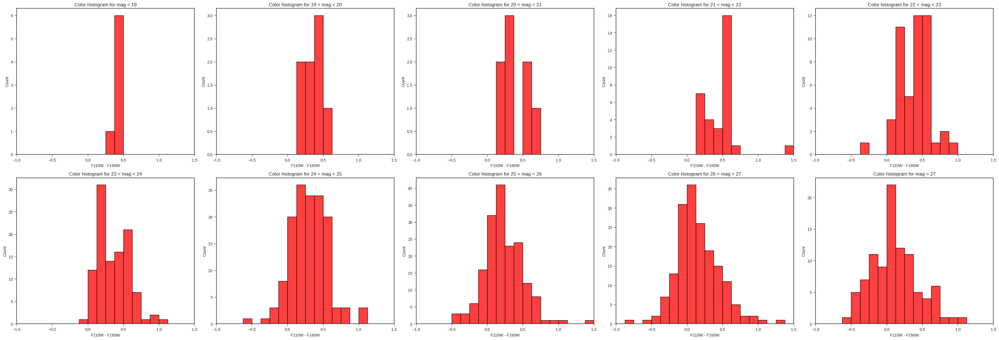

In [80]:
fig, axs = plt.subplots(2, 5, figsize=(35, 12))

frag = [(None, 19)] + [(i, i+1) for i in range(19, 27)] + [(27, None)]
bins = np.arange(-1.0, 1.5 + 0.125, 0.125)

for k, (mmin, mmax) in enumerate(frag):
    row = k // 5
    col = k % 5
    ax = axs[row, col]

    if mmin is None:
        mask = photometric_catalog_mag["flux_F110W"] < mmax
    elif mmax is None:
        mask = photometric_catalog_mag["flux_F110W"] > mmin
    else:
        mask = (photometric_catalog_mag["flux_F110W"] >= mmin) & (photometric_catalog_mag["flux_F110W"] < mmax)

    color = photometric_catalog_mag.loc[mask, "flux_F110W"] - photometric_catalog_mag.loc[mask, "flux_F160W"]

    sns.histplot(color,bins=bins ,color="red", kde=False, ax=ax)
    ax.set_xbound(-1, 1.5)
    
    if mmin is None:
        title = f"Color histogram for mag < {mmax}"
    elif mmax is None:
        title = f"Color histogram for mag > {mmin}"
    else:
        title = f"Color histogram for {mmin} < mag < {mmax}"

    ax.set_title(title)
    ax.set_xlabel("F110W - F160W")

plt.tight_layout()
plt.show()


In [81]:
# BCG
cluster_galaxies[cluster_galaxies["segment_id"]==2092]

,segment_id,xcentroid,ycentroid,ra,dec,a,b,theta,flux_F606W,flux_err_F606W,flux_F814W,flux_err_F814W,flux_F110W,flux_err_F110W,flux_F160W,flux_err_F160W
862,2092,6179.687846,6355.749365,59.089815,-53.63118,43.368886,22.183839,19.367758,22.729405,0.00648,20.97281,0.002443,19.723243,0.000938,19.121917,0.000777


In [82]:
batch_list = batch["segment_id"].to_list()
cluster_list = cluster_galaxies["segment_id"].to_list()

only_in_cluster = list(set(cluster_list) - set(batch_list))
only_in_batch = list(set(batch_list) - set(cluster_list))
in_both = list(set(cluster_list) & set(batch_list))

In [83]:
sources_list = [only_in_cluster, only_in_batch, in_both]
couleurs = ['magenta', 'blue', 'red']
noms_groupes = ['Only best-fit method', 'Only color-color method', "Common to both"]

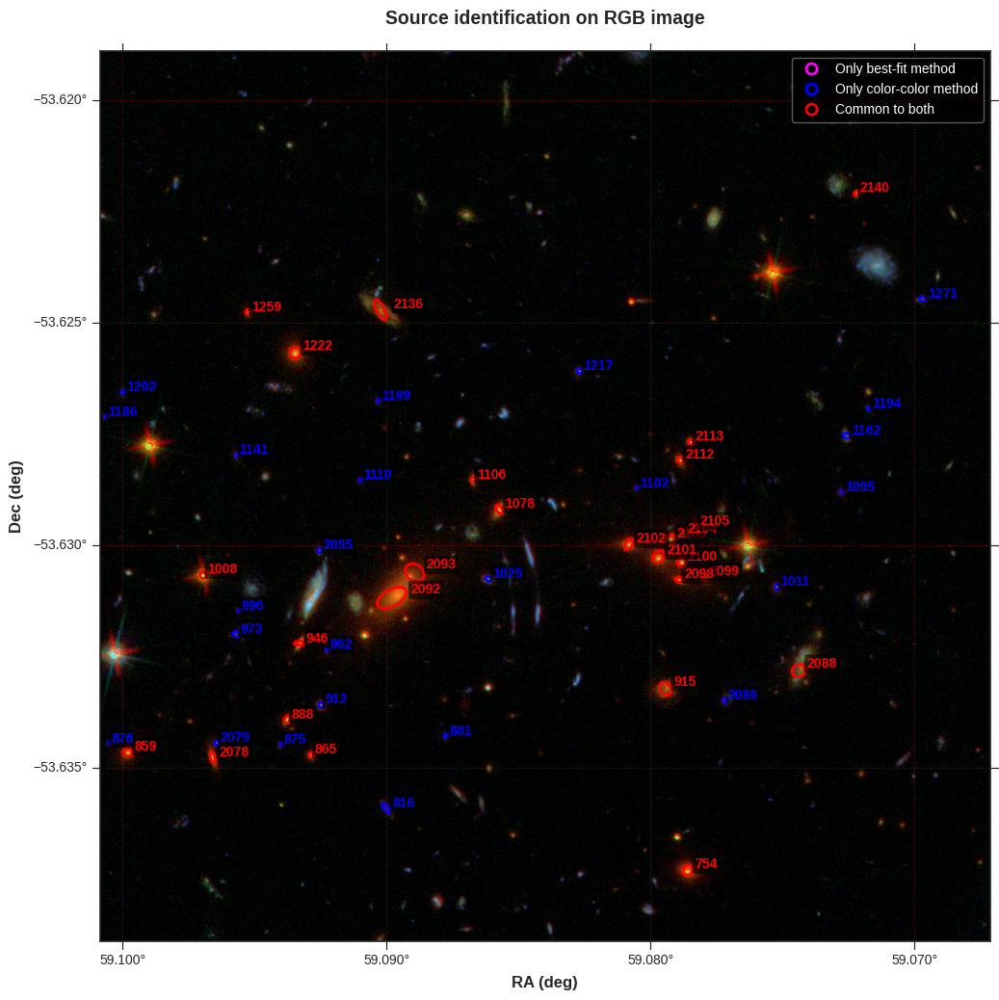

(<Figure size 1200x1200 with 1 Axes>,
 <WCSAxes: title={'center': 'Source identification on RGB image'}>)

In [87]:
list_source_on_rgb(rgb, photometric_catalog_mag, sources=sources_list, colors=couleurs, group_labels=noms_groupes,header=header_corrected[0], crop_size=1200)

### Fragmentation of the catalog

In [76]:
labeled_masks = circular_mask_incrementals(cluster_galaxies, header_corrected[2], 800, 19.574586, "F110W")

Pixel Scale (arcsec/pixel): 0.030 deg
[INFO]: The sphere of influence will is set to 24.000 deg for a magnitude of 19.574586.


Creating circular masks: 100%|██████████| 50/50 [00:03<00:00, 16.46it/s]


In [77]:
print(f'There are {np.unique(labeled_masks)} unique masks that have been created.')

There are [ 0  1  2  3  4  5  6  7  8  9 10 11 12] unique masks that have been created.


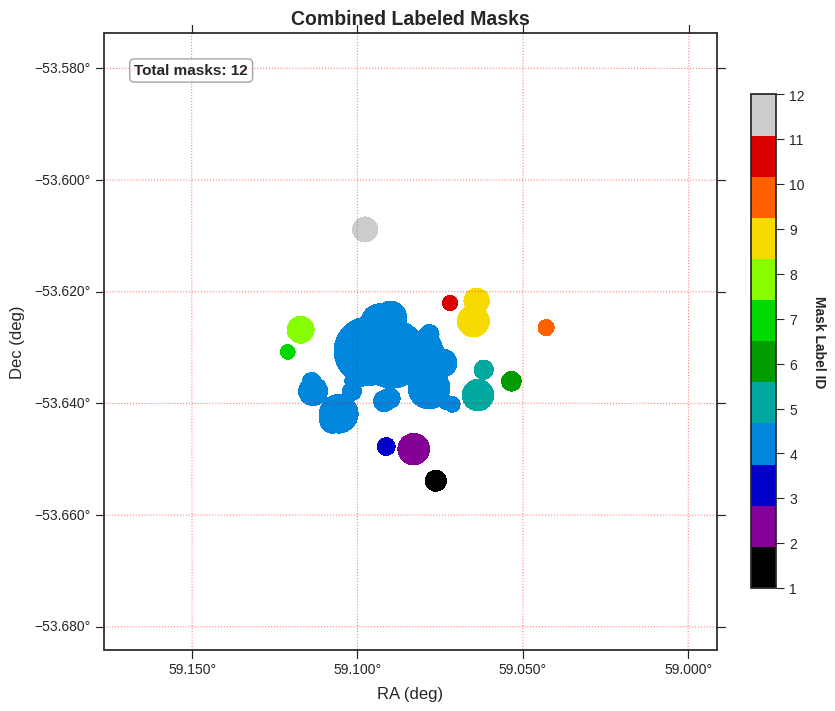

In [78]:
visualize_labeled_masks(labeled_masks, header_corrected[0])

In [80]:
fragmented_catalog = mask_fragments(field_galaxies, labeled_masks)

In [81]:
print(f'Number of catalog created: {len(fragmented_catalog)}')

Number of catalog created: 12


In [82]:
result_dictionary_mag = chi2_dictionary(fragmented_catalog,ranks=True)

Fragments: 100%|██████████| 12/12 [00:10<00:00,  1.14it/s]


In [102]:
fragmented_photometric_catalog_flux = fragment_catalog_by_segments(fragmented_catalog, photometric_catalog_cleaned)

### Apply chi² method

In [103]:
result_dictionary_flux = chi2_dictionary(fragmented_photometric_catalog_flux,ranks=True)

Fragments: 100%|██████████| 12/12 [00:11<00:00,  1.04it/s]


In [104]:
result_dictionary_flux[928]

,segment_id,xcentroid,ycentroid,chi²,alpha,mutual_ranks
0,1093.0,6611.984525,6611.638807,3.808223,0.880283,0
1,999.0,7118.252479,6358.001798,10.350598,2.489080,2
2,682.0,4973.891040,5307.997067,32.168185,7.444352,23
3,657.0,5144.095674,5228.760426,37.685768,3.596259,24
4,992.0,5903.684056,6314.151242,62.271191,5.363599,65
...,...,...,...,...,...,...
193,1135.0,5526.889191,6768.100801,18792.581407,0.015124,48
194,2091.0,6107.135197,6257.351026,19014.751275,0.150487,82
195,1141.0,5762.022070,6741.073672,20685.988617,0.604157,177
196,675.0,4839.851276,5313.663132,23798.098231,0.077164,39


### Apply secondary method

In [105]:
result_dictionary_flux = {k: v for k, v in result_dictionary_flux.items() 
                          if isinstance(v, pd.DataFrame) and not v.empty}

In [106]:
similarity_dictionnary = compute_similarity_score(result_dictionary_flux)

### Analysis of the results

In [107]:
catalog_flux = pd.concat(fragmented_photometric_catalog_flux, ignore_index=True)

In [108]:
with open("segmentation_map_SPTCLJ0356-5337_version_ultra_finale.pkl", 'rb') as file:
    segmentation_map = pkl.load(file)

#### Set 1

In [109]:
similarity_dictionnary[977]

,segment_id,xcentroid,ycentroid,chi²,alpha,mutual_ranks,similarity_score
0,2061.0,5894.812413,5346.764082,14.731623,6.317848,1,4.216747e-04
1,1172.0,6250.601530,6818.346871,26.962718,2.968386,1,6.983773e-07
2,2050.0,5256.629552,4702.096416,54.505483,3.459478,22,1.122901e-13
3,730.0,4807.426862,5516.032518,63.967553,4.062938,20,1.029704e-15
4,961.0,4991.763919,6232.438165,78.577107,6.634719,28,5.090366e-19
...,...,...,...,...,...,...,...
193,769.0,5317.634909,5619.385308,12353.457452,9.999995,146,0.000000e+00
194,822.0,6765.248766,5780.808433,12583.143417,9.999995,147,0.000000e+00
195,724.0,5267.775127,5478.828178,13237.961482,9.999995,164,0.000000e+00
196,1115.0,7197.210021,6672.865741,13644.996774,9.999995,125,0.000000e+00


In [110]:
transi = similarity_dictionnary[977]
transi[transi["segment_id"]==2061.0]

,segment_id,xcentroid,ycentroid,chi²,alpha,mutual_ranks,similarity_score
0,2061.0,5894.812413,5346.764082,14.731623,6.317848,1,0.000422


In [111]:
similarity_dictionnary[1172]

,segment_id,xcentroid,ycentroid,chi²,alpha,mutual_ranks,similarity_score
0,2061.0,5894.812413,5346.764082,0.513687,2.127375,0,7.734893e-01
1,977.0,6506.495812,6306.566833,26.962718,0.336884,1,6.983773e-07
2,2126.0,5830.730171,6854.005771,30.643113,5.473964,13,2.464280e-08
3,726.0,4453.623576,5497.939557,28.579652,7.393568,47,2.440435e-08
4,730.0,4807.426862,5516.032518,37.395785,1.367489,13,7.977830e-10
...,...,...,...,...,...,...,...
193,1022.0,6756.086054,6398.827284,2506.714092,0.826725,147,0.000000e+00
194,883.0,5236.034273,5999.802749,2832.374075,1.232022,136,0.000000e+00
195,675.0,4839.851276,5313.663132,2915.423319,0.032055,80,0.000000e+00
196,2091.0,6107.135197,6257.351026,2982.879981,0.061004,75,0.000000e+00


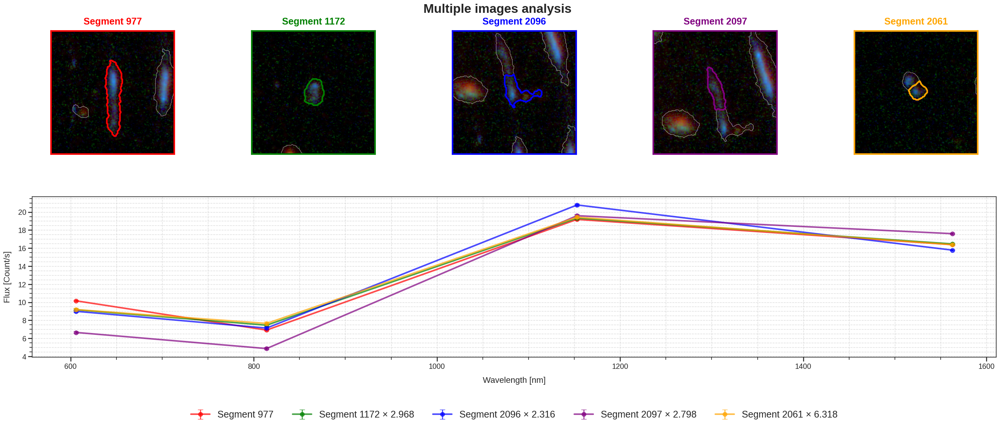

In [97]:
plot_multiple_images(catalog_flux, rgb, segmentation_map, source_ids=[977, 1172, 2096, 2097, 2061], alphas=[2.968388, 2.31594, 2.79799, 6.317848], wavelength=[606, 814, 1153, 1563],
                     cutout_size=80, colors=["red", "green", "blue", "purple", "orange"])

#### Set 2

In [114]:
similarity_dictionnary[1027]

,segment_id,xcentroid,ycentroid,chi²,alpha,mutual_ranks,similarity_score
0,986.0,6572.856299,6314.833544,1.987486,1.593157,0,3.701886e-01
1,1180.0,6362.613162,6828.868782,3.821197,2.422886,0,9.866122e-02
2,2050.0,5256.629552,4702.096416,13.228127,8.804873,6,2.682740e-04
3,2096.0,6501.328713,6405.250790,32.105452,5.861869,8,1.642390e-08
4,730.0,4807.426862,5516.032518,35.658205,9.999995,6,3.011396e-09
...,...,...,...,...,...,...,...
193,790.0,5734.770776,5663.863929,91848.775293,9.999995,118,0.000000e+00
194,724.0,5267.775127,5478.828178,92579.330586,9.999995,151,0.000000e+00
195,769.0,5317.634909,5619.385308,95037.758867,9.999995,123,0.000000e+00
196,1115.0,7197.210021,6672.865741,95690.487591,9.999995,118,0.000000e+00


In [115]:
similarity_dictionnary[986]

,segment_id,xcentroid,ycentroid,chi²,alpha,mutual_ranks,similarity_score
0,1027.0,6550.481737,6474.415586,1.987486,0.627686,0,3.701884e-01
1,1180.0,6362.613162,6828.868782,6.735142,1.520858,1,1.723663e-02
2,2050.0,5256.629552,4702.096416,13.060417,5.524256,5,3.241559e-04
3,730.0,4807.426862,5516.032518,18.857970,6.474612,5,1.607215e-05
4,2096.0,6501.328713,6405.250790,27.836963,3.678667,5,1.640278e-07
...,...,...,...,...,...,...,...
193,822.0,6765.248766,5780.808433,35995.763647,9.999995,127,0.000000e+00
194,769.0,5317.634909,5619.385308,36999.710610,9.999995,124,0.000000e+00
195,724.0,5267.775127,5478.828178,37062.143851,9.999995,152,0.000000e+00
196,1115.0,7197.210021,6672.865741,38389.636038,9.999995,119,0.000000e+00


In [116]:
similarity_dictionnary[1180]

,segment_id,xcentroid,ycentroid,chi²,alpha,mutual_ranks,similarity_score
0,1027.0,6550.481737,6474.415586,3.821197,0.412731,1,9.866121e-02
1,986.0,6572.856299,6314.833544,6.735142,0.657524,1,1.723663e-02
2,2050.0,5256.629552,4702.096416,11.225828,3.638600,2,1.216806e-03
3,730.0,4807.426862,5516.032518,22.328018,4.258173,8,2.180816e-06
4,2096.0,6501.328713,6405.250790,31.823039,2.418666,7,1.891479e-08
...,...,...,...,...,...,...,...
193,675.0,4839.851276,5313.663132,15671.260229,0.100520,31,0.000000e+00
194,724.0,5267.775127,5478.828178,15819.953712,9.999996,150,0.000000e+00
195,1115.0,7197.210021,6672.865741,16403.794233,9.999996,116,0.000000e+00
196,1218.0,6050.147049,6953.578813,17197.982544,9.999993,84,0.000000e+00


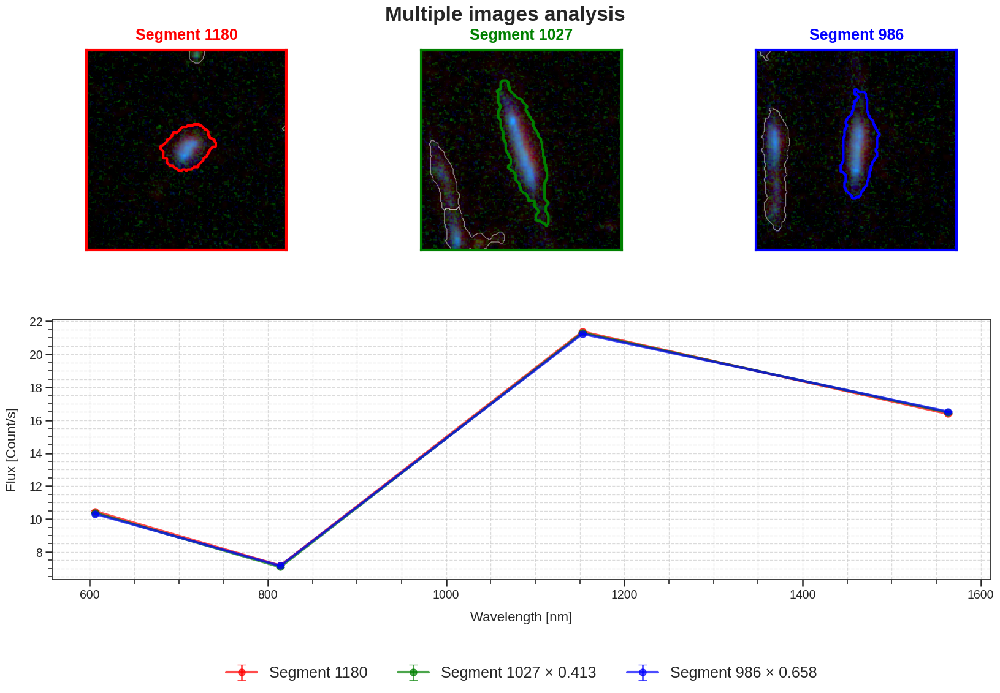

In [122]:
plot_multiple_images(catalog_flux, rgb, segmentation_map, source_ids=[1180, 1027, 986], alphas=[0.412731,0.657524], wavelength=[606, 814, 1153, 1563],
                     cutout_size=80, colors=["red", "green", "blue"])

#### Set 3

In [117]:
similarity_dictionnary[928]

,segment_id,xcentroid,ycentroid,chi²,alpha,mutual_ranks,similarity_score
0,1093.0,6611.984525,6611.638807,3.808223,0.880283,0,1.489549e-01
1,999.0,7118.252479,6358.001798,10.350598,2.489080,2,2.261811e-03
2,682.0,4973.891040,5307.997067,32.168185,7.444352,23,7.663616e-09
3,657.0,5144.095674,5228.760426,37.685768,3.596259,24,4.521385e-10
4,992.0,5903.684056,6314.151242,62.271191,5.363599,65,8.467484e-16
...,...,...,...,...,...,...,...
193,1135.0,5526.889191,6768.100801,18792.581407,0.015124,48,0.000000e+00
194,2091.0,6107.135197,6257.351026,19014.751275,0.150487,82,0.000000e+00
195,1141.0,5762.022070,6741.073672,20685.988617,0.604157,177,0.000000e+00
196,675.0,4839.851276,5313.663132,23798.098231,0.077164,39,0.000000e+00


In [118]:
transi = similarity_dictionnary[928]
transi[transi["segment_id"]==657.0]

,segment_id,xcentroid,ycentroid,chi²,alpha,mutual_ranks,similarity_score
3,657.0,5144.095674,5228.760426,37.685768,3.596259,24,4.521385e-10


In [119]:
similarity_dictionnary[1093]

,segment_id,xcentroid,ycentroid,chi²,alpha,mutual_ranks,similarity_score
0,928.0,6677.811081,6133.738006,3.808223,1.136000,0,1.489549e-01
1,999.0,7118.252479,6358.001798,11.721006,2.825799,3,9.499368e-04
2,657.0,5144.095674,5228.760426,29.530100,4.086986,17,3.684944e-08
3,682.0,4973.891040,5307.997067,29.763863,8.460073,20,2.753907e-08
4,992.0,5903.684056,6314.151242,55.851016,6.085518,59,2.292042e-14
...,...,...,...,...,...,...,...
193,2091.0,6107.135197,6257.351026,22501.149845,0.173128,86,0.000000e+00
194,1135.0,5526.889191,6768.100801,22589.543973,0.017322,40,0.000000e+00
195,1141.0,5762.022070,6741.073672,23589.481209,0.698903,183,0.000000e+00
196,675.0,4839.851276,5313.663132,28553.378469,0.088572,38,0.000000e+00


In [120]:
similarity_dictionnary[1188]

,segment_id,xcentroid,ycentroid,chi²,alpha,mutual_ranks,similarity_score
0,657.0,5144.095674,5228.760426,15.860039,5.836683,6,8.994484e-05
1,1037.0,4994.269195,6445.748627,21.646517,6.797677,9,3.321752e-06
2,992.0,5903.684056,6314.151242,25.874206,8.575518,28,1.504415e-07
3,2062.0,5885.096115,5360.447307,51.768162,8.539492,26,3.701304e-13
4,999.0,7118.252479,6358.001798,73.270690,4.007531,27,7.447112e-18
...,...,...,...,...,...,...,...
193,724.0,5267.775127,5478.828178,28211.393339,9.999996,100,0.000000e+00
194,1115.0,7197.210021,6672.865741,28832.931384,9.999996,49,0.000000e+00
195,1218.0,6050.147049,6953.578813,30405.299985,9.999993,25,0.000000e+00
196,675.0,4839.851276,5313.663132,34766.872959,0.128358,41,0.000000e+00


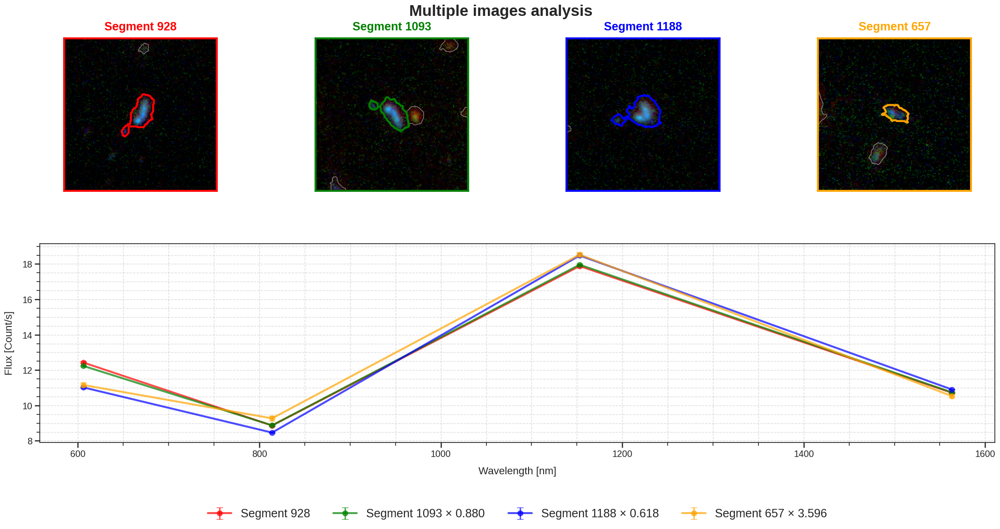

In [125]:
plot_multiple_images(catalog_flux, rgb, segmentation_map, source_ids=[928, 1093, 1188, 657], alphas=[0.880283, 0.617658, 3.596259], wavelength=[606, 814, 1153, 1563],
                     cutout_size=100, colors=["red", "green", "blue", "orange"])

#### Set 5

In [274]:
similarity_dictionnary[929]

,segment_id,xcentroid,ycentroid,chi²,alpha,mutual_ranks,similarity_score
0,949.0,5737.802754,6191.965107,1.030942,0.208436,1,0.199073
1,740.0,6210.710382,5527.824171,1.432499,0.281746,1,0.139595
2,955.0,6274.399100,6184.254873,1.473660,1.026910,5,0.079771
3,1152.0,5300.143308,6737.418485,1.822906,0.551718,1,0.073080
4,894.0,5181.013943,6012.482877,2.142477,0.420665,1,0.057097
...,...,...,...,...,...,...,...
191,649.0,5023.190965,5234.661286,30671.032693,0.010004,182,0.000000
192,2094.0,5967.689772,6362.428630,78418.428292,0.010004,182,0.000000
193,1031.0,7139.999297,6493.998790,393431.210590,0.010004,182,0.000000
194,1135.0,5526.889191,6768.100801,438186.068431,0.010004,181,0.000000


In [578]:
transi = similarity_dictionnary[929]
transi[transi["segment_id"]==1073.0]

,segment_id,xcentroid,ycentroid,chi²,alpha,mutual_ranks,similarity_score
81,1073.0,6304.929808,6547.294861,18.391689,0.132451,8,0.000002


In [460]:
similarity_dictionnary[948]

,segment_id,xcentroid,ycentroid,chi²,alpha,mutual_ranks,similarity_score
0,1073.0,6304.929808,6547.294861,2.412914,0.208863,0,0.149628
1,822.0,6765.248766,5780.808433,1.964923,1.905755,4,0.124796
2,756.0,6888.543613,5592.183918,2.609862,0.191187,0,0.108476
3,959.0,7471.990430,6199.328098,4.427020,1.276741,7,0.015617
4,734.0,6734.848051,5511.228644,5.240366,1.087220,1,0.014558
...,...,...,...,...,...,...,...
191,649.0,5023.190965,5234.661286,18297.179033,0.010004,166,0.000000
192,2094.0,5967.689772,6362.428630,49775.437068,0.010004,167,0.000000
193,1031.0,7139.999297,6493.998790,267633.021561,0.010004,166,0.000000
194,1135.0,5526.889191,6768.100801,298344.252424,0.010004,166,0.000000


In [276]:
similarity_dictionnary[973]

,segment_id,xcentroid,ycentroid,chi²,alpha,mutual_ranks,similarity_score
0,985.0,6464.811905,6280.051951,10.223638,4.216582,2,0.003013
1,572.0,5235.784647,4916.525432,17.655205,0.476613,2,0.000059
2,654.0,7039.093356,5221.561024,18.304475,0.351349,0,0.000053
3,918.0,6320.527286,6083.421872,20.536721,2.570942,14,0.000004
4,1006.0,7075.245350,6358.906627,23.883567,1.554400,4,0.000001
...,...,...,...,...,...,...,...
191,822.0,6765.248766,5780.808433,4960.328678,4.999996,148,0.000000
192,724.0,5267.775127,5478.828178,5119.336412,4.999996,139,0.000000
193,1115.0,7197.210021,6672.865741,5473.960154,4.999996,148,0.000000
194,1218.0,6050.147049,6953.578813,5803.497059,4.999996,147,0.000000


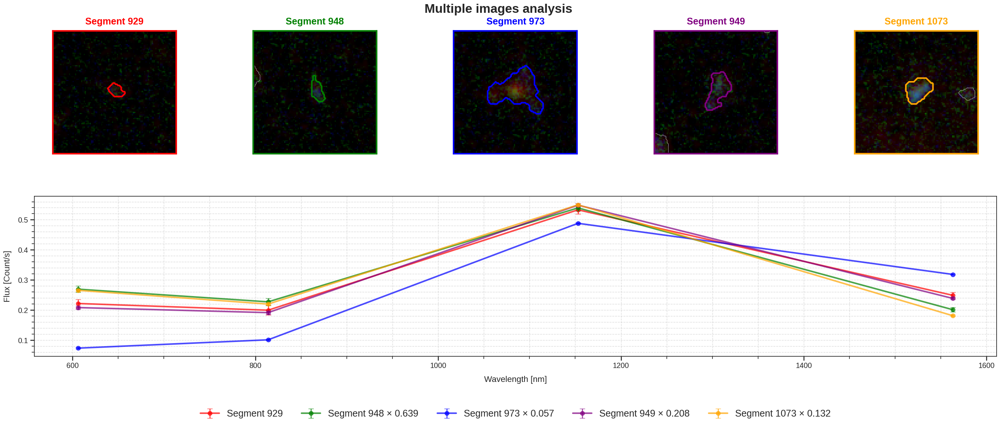

In [126]:
plot_multiple_images(photometric_catalog_cleaned, rgb, segmentation_map, source_ids=[929, 948, 973, 949, 1073], alphas=[0.639184, 0.057358, 0.208436, 0.132451], wavelength=[606, 814, 1153, 1563],
                     cutout_size=50, colors=["red", "green", "blue", "purple", "orange"])

#### Set 7

In [639]:
similarity_dictionnary[827]

,segment_id,xcentroid,ycentroid,chi²,alpha,mutual_ranks,similarity_score
0,1069.0,5528.159302,6533.757660,16.096940,2.048851,0,3.195905e-04
1,1274.0,6388.658775,7158.456194,27.707796,5.276344,17,9.623399e-08
2,724.0,5267.775127,5478.828178,29.255457,7.595905,27,2.863694e-08
3,916.0,6177.027177,6065.550731,36.743414,5.701475,98,2.039209e-10
4,967.0,6680.961353,6218.704749,59.069058,4.831001,113,2.504955e-15
...,...,...,...,...,...,...,...
194,1027.0,6550.481737,6474.415586,2556.701190,0.044041,130,0.000000e+00
195,816.0,6164.392053,5788.694627,2558.241248,0.120188,111,0.000000e+00
196,977.0,6506.495812,6306.566833,2798.897368,0.111546,109,0.000000e+00
197,1202.0,5456.278600,6910.447721,3942.416746,0.209227,155,0.000000e+00


In [640]:
similarity_dictionnary[1069]

,segment_id,xcentroid,ycentroid,chi²,alpha,mutual_ranks,similarity_score
0,827.0,5881.661353,5798.862543,16.096940,0.488078,0,3.195905e-04
1,884.0,5739.216064,5988.971303,18.378103,1.129647,0,6.810116e-05
2,916.0,6177.027177,6065.550731,23.836206,2.760862,68,1.852385e-07
3,1274.0,6388.658775,7158.456194,37.425084,2.579161,30,4.267842e-10
4,724.0,5267.775127,5478.828178,37.720801,3.724521,49,2.342607e-10
...,...,...,...,...,...,...,...
194,977.0,6506.495812,6306.566833,946.387430,0.055190,136,1.881363e-208
195,1242.0,6429.504569,7037.622336,955.337990,0.523948,103,2.370828e-210
196,720.0,4665.155698,5452.004587,973.561516,0.283367,132,2.378586e-214
197,1202.0,5456.278600,6910.447721,1375.338161,0.102249,72,1.648822e-301


In [131]:
transi = similarity_dictionnary[884]
transi[transi["segment_id"]==827]

,segment_id,xcentroid,ycentroid,chi²,alpha,mutual_ranks,similarity_score
16,827.0,5881.661353,5798.862543,65.808461,0.429385,6,4.272608e-16


In [641]:
similarity_dictionnary[884]

,segment_id,xcentroid,ycentroid,chi²,alpha,mutual_ranks,similarity_score
0,1069.0,5528.159302,6533.757660,18.378103,0.885233,1,6.810116e-05
1,916.0,6177.027177,6065.550731,25.827194,2.445587,75,6.318754e-08
2,848.0,5359.590439,5867.787962,30.979968,0.642149,16,1.874068e-08
3,960.0,6909.419889,6208.639261,34.494017,0.537580,19,2.694871e-09
4,1005.0,7304.688207,6340.303730,37.076073,0.652467,30,4.940381e-10
...,...,...,...,...,...,...,...
194,883.0,5236.034273,5999.802749,773.170334,0.178012,86,9.098630e-171
195,1202.0,5456.278600,6910.447721,785.690188,0.095341,29,2.170026e-173
196,1242.0,6429.504569,7037.622336,969.265649,0.442811,106,2.212050e-213
197,2052.0,5404.303103,4884.566461,973.022282,0.027417,147,2.970640e-214


1069 and 884 removed from catalog due to SN/ratio

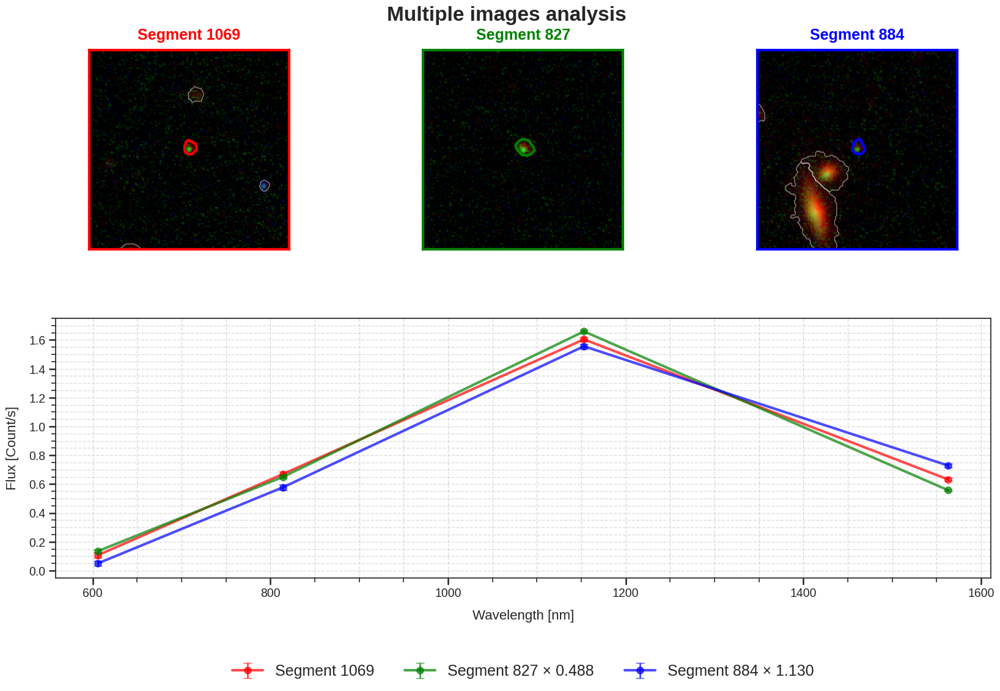

In [128]:
plot_multiple_images(photometric_catalog_cleaned, rgb, segmentation_map, source_ids=[1069, 827, 884], alphas=[0.488078, 1.129647], wavelength=[606, 814, 1153, 1563],
                     cutout_size=100, colors=["red", "green", "blue"])

#### Cluster galaxies

In [345]:
photometric_catalog_cleaned[photometric_catalog_cleaned["segment_id"]==2098]

,segment_id,xcentroid,ycentroid,ra,dec,a,b,theta,flux_F606W,flux_err_F606W,flux_F814W,flux_err_F814W,flux_F110W,flux_err_F110W,flux_F160W,flux_err_F160W
868,2098,6954.718835,6405.089287,59.078924,-53.630769,10.846276,6.948988,-22.084198,2.029992,0.066404,7.919613,0.075499,61.854778,0.101054,45.772874,0.0811


In [356]:
transi = result_flux_no_frag[2101]
transi[transi["segment_id"]==2102]

,segment_id,xcentroid,ycentroid,chi²,alpha,mutual_ranks
5,2102.0,6818.866092,6499.903811,61.655829,1.161162,9


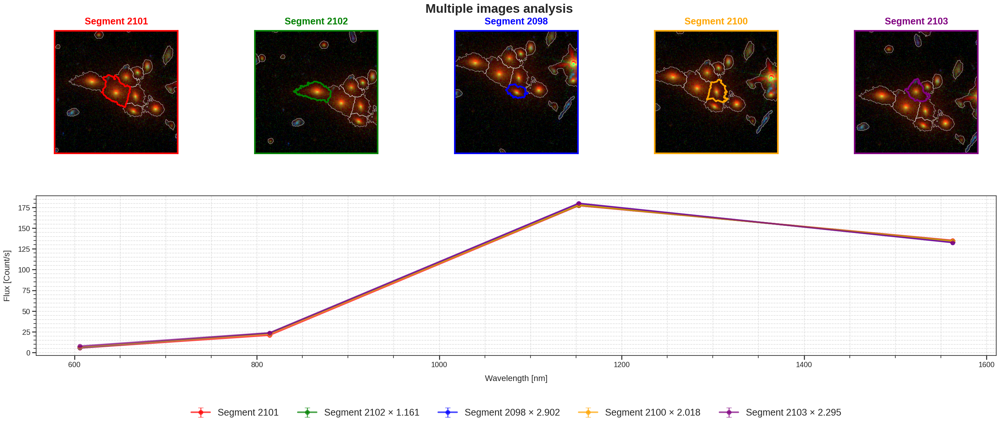

In [129]:
plot_multiple_images(photometric_catalog_cleaned, rgb, segmentation_map, source_ids=[2101, 2102, 2098,2100,2103],
                     alphas=[1.161162, 2.901749,2.017678, 2.29477],
                     wavelength=[606, 814, 1153, 1563], cutout_size=200,
                     colors=["red", "green", "blue", 'orange', "purple"])

#### Best matches

In [646]:
glob_score.head(6)

,segment_id,xcentroid,ycentroid,chi²,alpha,mutual_ranks,similarity_score,ref_id
0,1110.0,6097.222773,6673.188281,0.240560,3.580080,0,0.886672,912.0
1,1004.0,5443.726452,6351.124637,0.258594,1.207859,0,0.878713,766.0
2,1240.0,5310.704614,7032.655994,0.288565,0.398493,0,0.865643,769.0
3,881.0,6327.378540,5983.604363,0.314177,0.774459,0,0.854628,800.0
4,1076.0,6344.923805,6544.823822,0.316987,1.053635,0,0.853428,959.0
5,822.0,6765.248766,5780.808433,0.429644,2.428151,0,0.806685,789.0


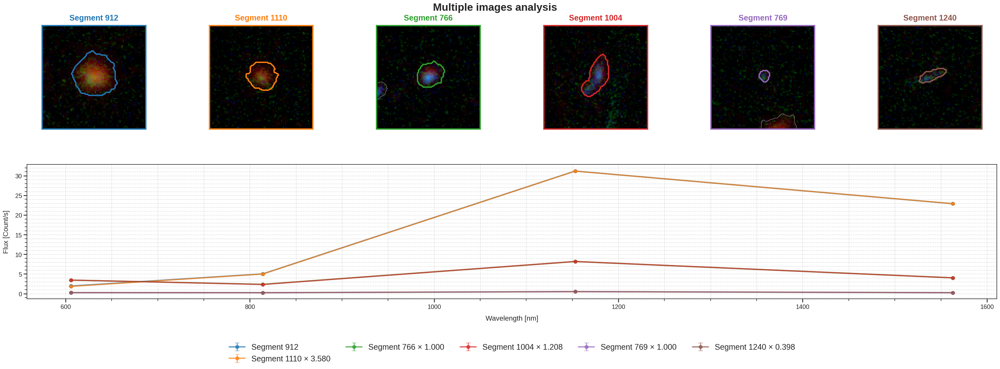

In [130]:
plot_multiple_images(photometric_catalog_cleaned, rgb, segmentation_map, source_ids=[912, 1110,766, 1004, 769, 1240],
                     alphas=[3.580080, 1, 1.207859, 1, 0.398493],
                     wavelength=[606, 814, 1153, 1563], cutout_size=50,
                     colors=["red", "green"])

### Visualization

In [90]:
images = [data_corrected[2], data_corrected[1], data_corrected[0]]

/home/vaito/.conda/envs/Master-Thesis/lib/python3.13/site-packages/astropy/visualization/lupton_rgb.py:645: RuntimeWarning: invalid value encountered in divide
  fInorm = np.where(Int <= 0, 0, np.true_divide(fI, Int))


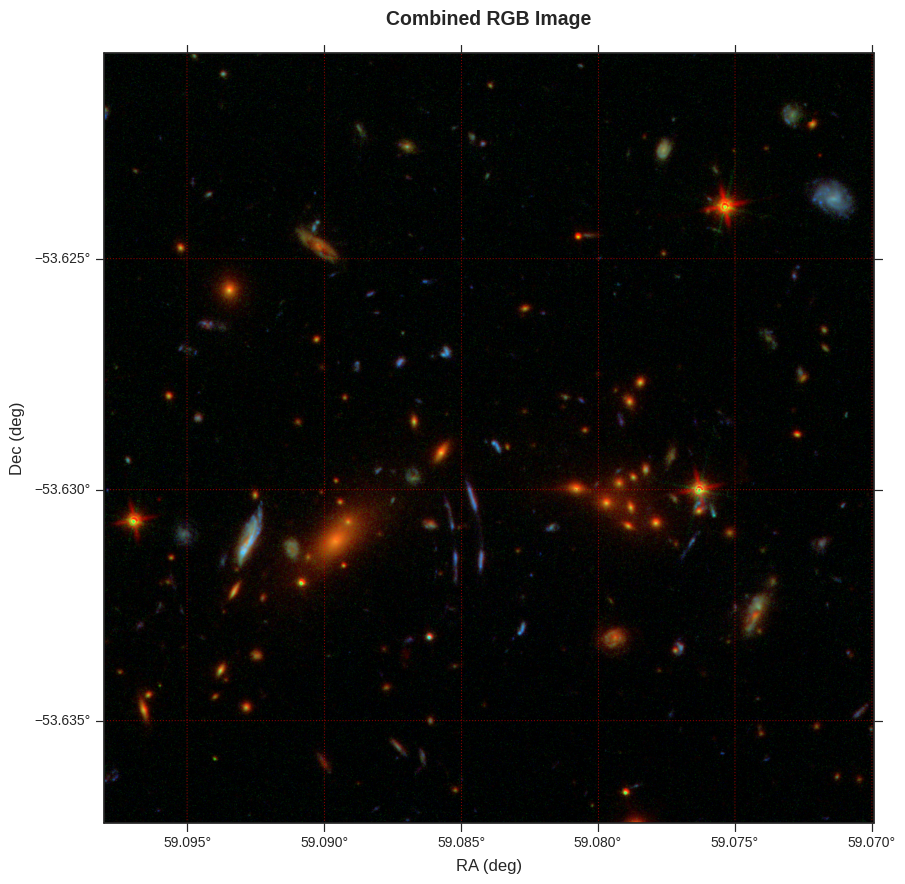

In [91]:
rgb = python_rgb(images, 10, 99.5, header_corrected[0],2000, True)

### Interpretability

In [139]:
glob_score = global_score(similarity_dictionnary, percentile=None)

In [644]:
glob_score.head(6)

,segment_id,xcentroid,ycentroid,chi²,alpha,mutual_ranks,similarity_score,ref_id
0,1110.0,6097.222773,6673.188281,0.240560,3.580080,0,0.886672,912.0
1,1004.0,5443.726452,6351.124637,0.258594,1.207859,0,0.878713,766.0
2,1240.0,5310.704614,7032.655994,0.288565,0.398493,0,0.865643,769.0
3,881.0,6327.378540,5983.604363,0.314177,0.774459,0,0.854628,800.0
4,1076.0,6344.923805,6544.823822,0.316987,1.053635,0,0.853428,959.0
5,822.0,6765.248766,5780.808433,0.429644,2.428151,0,0.806685,789.0


In [529]:
glob_score[glob_score["segment_id"]==2097]

,segment_id,xcentroid,ycentroid,chi²,alpha,mutual_ranks,similarity_score,ref_id
83,2097.0,6487.625238,6449.880023,4.079965e+00,1.033096,0,1.300310e-01,744.0
2153,2097.0,6487.625238,6449.880023,3.275166e+01,0.413977,1,1.545600e-08,961.0
3145,2097.0,6487.625238,6449.880023,4.376672e+01,0.125395,2,7.205908e-12,726.0
4612,2097.0,6487.625238,6449.880023,6.954289e+01,0.063333,48,8.127360e-18,939.0
5054,2097.0,6487.625238,6449.880023,7.967953e+01,0.086083,5,6.272520e-20,627.0
...,...,...,...,...,...,...,...,...
19308,2097.0,6487.625238,6449.880023,1.739393e+03,1.016583,184,0.000000e+00,778.0
19330,2097.0,6487.625238,6449.880023,3.526109e+06,9.999996,161,0.000000e+00,1135.0
19362,2097.0,6487.625238,6449.880023,2.233023e+05,9.999996,183,0.000000e+00,649.0
19548,2097.0,6487.625238,6449.880023,2.593422e+03,2.873662,192,0.000000e+00,1093.0


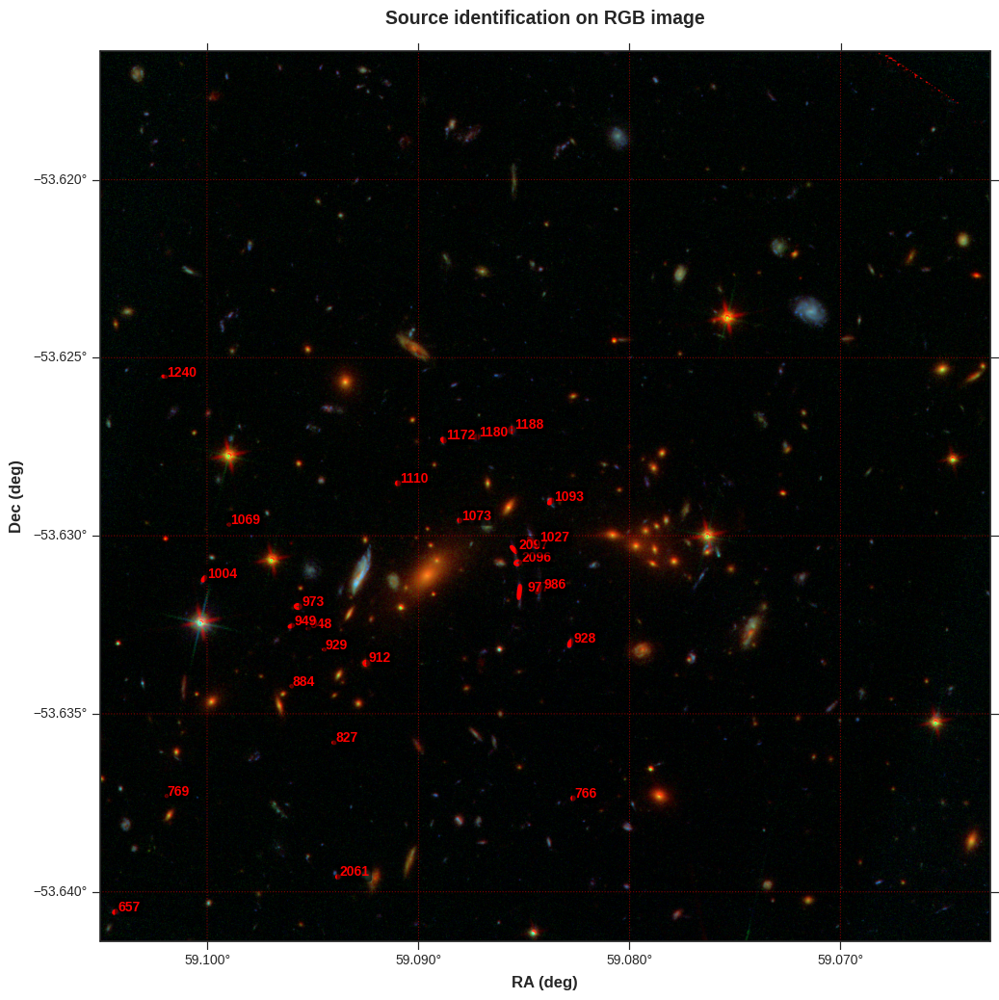

(<Figure size 1200x1200 with 1 Axes>,
 <WCSAxes: title={'center': 'Source identification on RGB image'}>)

In [655]:
list_source_on_rgb(rgb, photometric_catalog_mag, sources=[[977, 1172, 2096, 2097, 2061, 1180, 1027, 986, 928, 1093, 1188, 657, 929, 948, 973, 949, 1073, 1069, 827, 884, 912, 1110, 766, 1004, 769, 1240]], colors=["red"], group_labels=None,header=header_corrected[0], crop_size=1500)

In [137]:
set_1 = [977, 2097, 1172]
set_2 = [986, 1027, 1180]
set_3 = [928, 1093, 1188]
set_4 = []
set_5 = [929, 948]
set_6 = [985]
set_7 = [827, 884, 1069]

In [138]:
similarity_dictionnary[1069.0]

,segment_id,xcentroid,ycentroid,chi²,alpha,mutual_ranks,similarity_score
0,827.0,5881.661353,5798.862543,1.609694e+01,2.048852,0,0.068370
1,884.0,5739.216064,5988.971303,1.837810e+01,0.885234,2,0.018699
2,795.0,6861.656239,5677.644092,3.750065e+01,0.845642,24,0.000138
3,1297.0,6124.169638,7231.729558,3.852647e+01,1.703831,42,0.000069
4,877.0,7291.287714,5954.329881,5.309100e+01,0.696759,50,0.000005
...,...,...,...,...,...,...,...
126,798.0,6950.060048,5712.365253,1.946782e+05,4.999996,119,0.000000
127,926.0,6438.756129,6114.744199,2.115027e+05,4.999996,122,0.000000
128,1135.0,5526.889191,6768.100801,3.169127e+05,0.010004,79,0.000000
129,1031.0,7139.999297,6493.998790,2.215648e+07,4.999996,126,0.000000


In [133]:
vlines = [
    {
        "values": [9.311697e-07],
        "color": "blue",
        "label": "Set 1 (fragmented)"
    },
    {
        "values": [3.701886e-01, 1.723663e-02, 9.866121e-02],
        "color": "red",
        "label": "Set 2 (complete)"
    },
    {
        "values": [1.489549e-01, 3.001189e-51, 	3.732884e-59],
        "color": "green",
        "label": "set 3 (complete)"
    },
    {
        "values": [6.689138e-18, 0.000649, 	1.647443e-51],
        "color": "purple",
        "label": "set 5 (fused)"
    },
    {
        "values": [3.195905e-04, 6.810116e-05, 	4.272608e-16],
        "color": "orange",
        "label": "set 7 (low SNR)"
    }
]

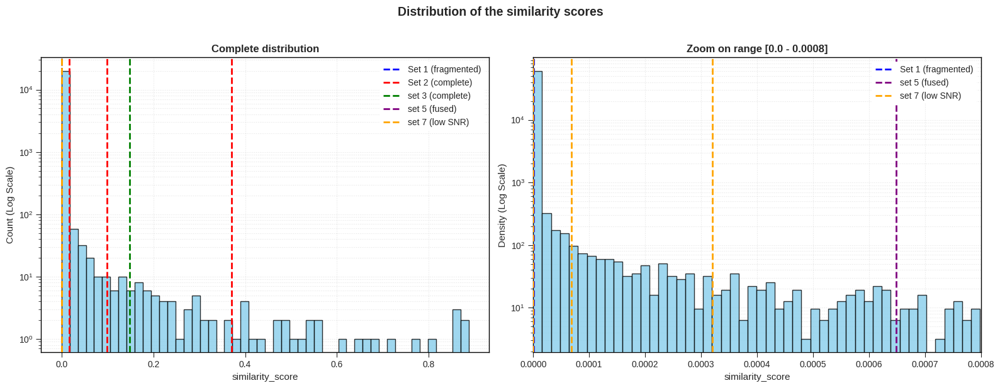

In [140]:
plot_similarity_distribution(
    glob_score, 
    vlines=vlines, 
    x_min_zoom=0.0, 
    x_max_zoom=0.0008
)

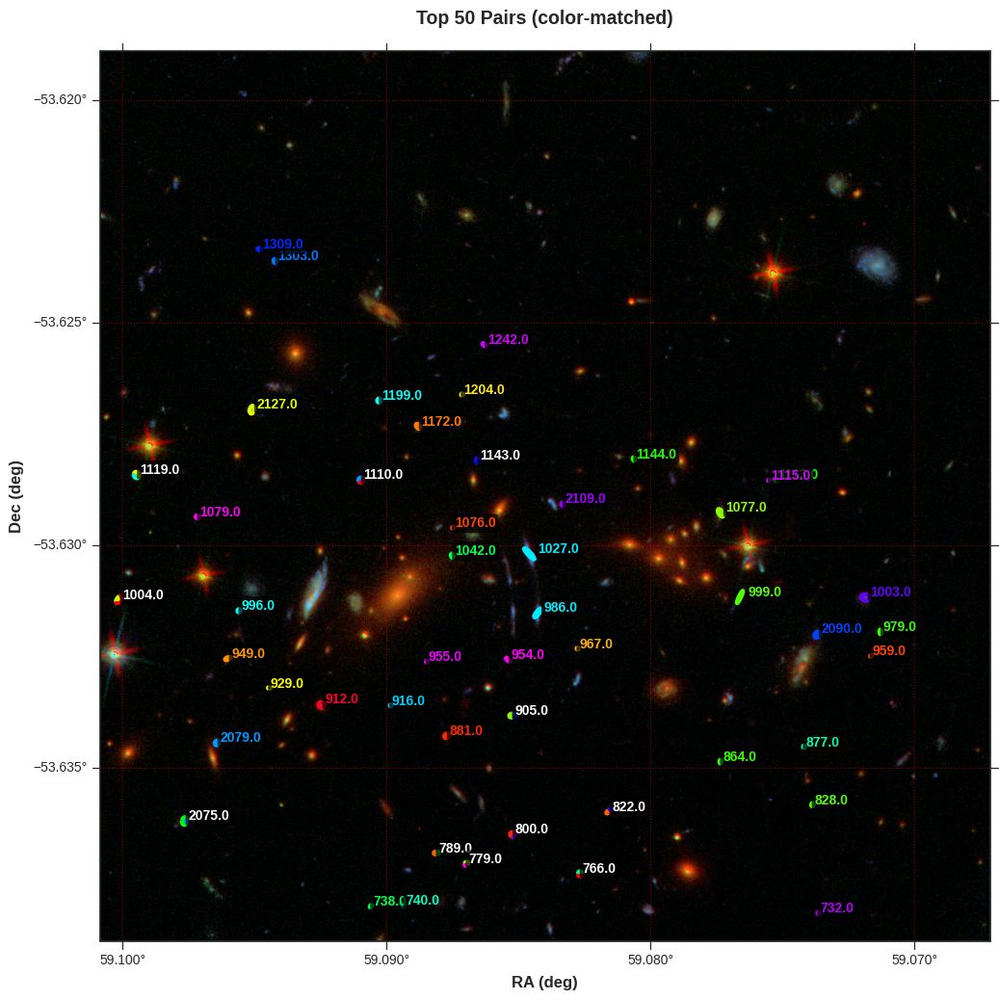

In [158]:
plot_paires_on_rgb(
    rgb, 
    photometric_catalog_cleaned, 
    df_pairs=glob_score.head(50),
    header=header_corrected[0], 
    crop_size=1200
)